In [2]:
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_auc_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import datetime
import hashlib
import gc
pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings('ignore')

# Preprocess Data

In [3]:
path_train_transaction = r"C:\Users\wxiny\Desktop\Fraud Project\Data\train_transaction.csv"
path_train_identity = r"C:\Users\wxiny\Desktop\Fraud Project\Data\train_identity.csv"
path_test_transaction = r"C:\Users\wxiny\Desktop\Fraud Project\Data\test_transaction.csv"
path_test_identity = r"C:\Users\wxiny\Desktop\Fraud Project\Data\test_identity.csv"

df_train_transaction = pd.read_csv(path_train_transaction)
df_train_identity = pd.read_csv(path_train_identity)
df_test_transaction = pd.read_csv(path_test_transaction)
df_test_identity = pd.read_csv(path_test_identity)

df_train_transaction_copy = df_train_transaction.copy()
df_train_identity_copy = df_train_identity.copy()
df_test_transaction_copy = df_test_transaction.copy()
df_test_identity_copy = df_test_identity.copy()

In [5]:
df_train_transaction_copy.shape

(590540, 394)

In [115]:
def preprocess_identity_data(df):
    """
    Preprocesses the identity dataset by extracting device and browser information, 
    standardizing device names, and grouping rare devices under 'Others'.
    
    Parameters:
    df (pd.DataFrame): Input identity DataFrame

    Returns:
    pd.DataFrame: Processed DataFrame
    """
    df = df.copy()  # Create a copy to avoid modifying the original DataFrame

    # Extract device name and version
    df['device_name'] = df['DeviceInfo'].str.split('/', expand=True)[0]
    df['device_version'] = df['DeviceInfo'].str.split('/', expand=True)[1]

    # Extract OS type and browser type
    df['OS_id_30'] = df['id_30'].str.split(' ', expand=True)[0]
    df['browser_id_31'] = df['id_31'].str.split(' ', expand=True)[0]

    # Standardizing device names
    device_replacements = {
        'Samsung': ['SM', 'SAMSUNG', 'GT-'],
        'Motorola': ['Moto G', 'Moto', 'moto'],
        'LG': ['LG-'],
        'RV': ['rv:'],
        'Huawei': ['HUAWEI', 'ALE-', '-L'],
        'ZTE': ['Blade', 'BLADE'],
        'Linux': ['Linux'],
        'Sony': ['XT'],
        'HTC': ['HTC'],
        'Asus': ['ASUS']
    }

    for brand, patterns in device_replacements.items():
        for pattern in patterns:
            df.loc[df['device_name'].str.contains(pattern, na=False), 'device_name'] = brand

    # Group rare device names under "Others" (threshold: 100 occurrences)
    rare_devices = df.device_name.value_counts()[df.device_name.value_counts() < 100].index
    df.loc[df.device_name.isin(rare_devices), 'device_name'] = "Others"

    # Free up memory
    gc.collect()

    return df

In [116]:
df_test_identity_copy = df_test_identity.copy()
df_test_identity_copy = preprocess_identity_data(df_test_identity)
df_test_identity_copy.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,device_name,device_version,OS_id_30,browser_id_31
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,NaN,New,NotFound,225.0,15.0,427.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13,Huawei,HUAWEIMYA-L13,NaN,chrome
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,Found,NaN,-300.0,Found,Found,166.0,NaN,542.0,368.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Android 6.0.1,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T,Others,MXB48T,Android,chrome
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,-360.0,New,NotFound,225.0,NaN,271.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0,Trident,7.0,NaN,ie
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,27.0,NaN,Found,Found,225.0,15.0,427.0,563.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13,Huawei,HUAWEIMYA-L13,NaN,chrome
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,NaN,100.0,NotFound,27.0,NaN,New,NotFound,225.0,15.0,567.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW,Samsung,R16NW,NaN,chrome


In [117]:
df_train_identity_copy = df_train_identity.copy()
df_train_identity_copy = preprocess_identity_data(df_train_identity_copy)
df_train_identity_copy.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,device_name,device_version,OS_id_30,browser_id_31
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,NotFound,NaN,-480.0,New,NotFound,166.0,NaN,542.0,144.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,Android 7.0,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M,Samsung,NRD90M,Android,samsung
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,iOS Device,None,iOS,mobile
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,52.0,NaN,Found,Found,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows,Windows,None,NaN,chrome
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,NaN,100.0,NotFound,52.0,NaN,New,NotFound,225.0,NaN,176.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN,NaN,NaN,NaN,chrome
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NotFound,NaN,-300.0,Found,Found,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS,MacOS,None,Mac,chrome


In [118]:
train_df = pd.merge(df_train_transaction_copy, df_train_identity_copy, on = 'TransactionID', how = 'left')
test_df = pd.merge(df_test_transaction_copy, df_test_identity_copy, on = 'TransactionID', how = 'left')

In [119]:
train_df.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,device_name,device_version,OS_id_30,browser_id_31
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,cre

In [120]:
test_df.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,device_name,device_version,OS_id_30,browser_id_31
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,NaN,gmail.com,NaN,6.0,6.0,0.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,F,T,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,47.950001,0.000000,0.000000,47.950001,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

# EDA

## Distribution of Target Variable

In [121]:
sns.set_style("whitegrid")  
sns.set_palette("coolwarm")  

plt.rcParams["figure.figsize"] = (12, 6) 
plt.rcParams["axes.labelsize"] = 14  
plt.rcParams["axes.titlesize"] = 16 
plt.rcParams["xtick.labelsize"] = 12  
plt.rcParams["ytick.labelsize"] = 12 
plt.rcParams["legend.fontsize"] = 12  
plt.rcParams["figure.dpi"] = 100  

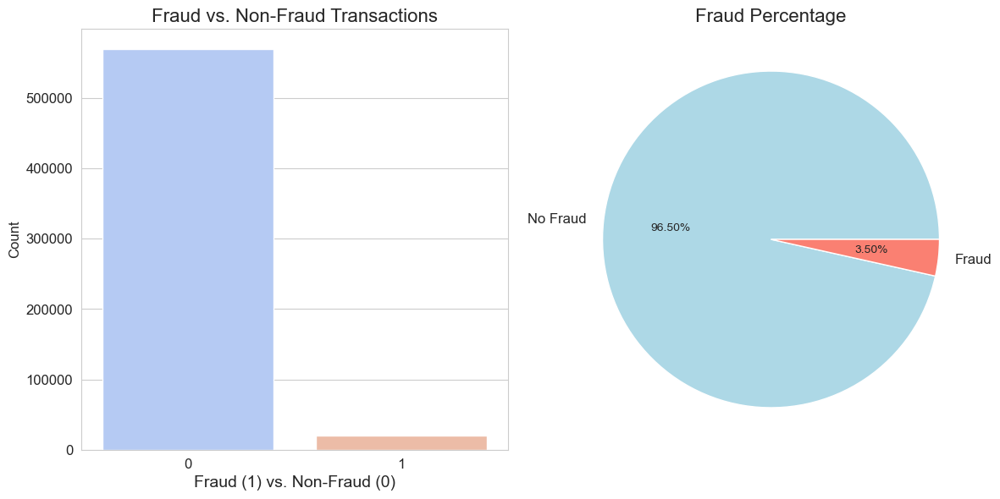

In [122]:
fig, axes = plt.subplots(1, 2)

sns.countplot(x="isFraud", data=train_df, hue="isFraud", palette="coolwarm", legend=False, ax=axes[0])

axes[0].set_title("Fraud vs. Non-Fraud Transactions")
axes[0].set_xlabel("Fraud (1) vs. Non-Fraud (0)")
axes[0].set_ylabel("Count", fontsize=12)

fraud_counts = train_df["isFraud"].value_counts()
axes[1].pie(fraud_counts, labels=["No Fraud", "Fraud"], autopct='%1.2f%%', colors=['lightblue', 'salmon'])
axes[1].set_title("Fraud Percentage")

plt.tight_layout()
plt.show()

## Correlation

In [123]:
numeric_df = train_df.select_dtypes(include=['number'])
fraud_correlation = numeric_df.corr()["isFraud"].drop("isFraud")  
fraud_correlation_sorted = fraud_correlation.reindex(fraud_correlation.abs().sort_values(ascending=False).index)
print(fraud_correlation_sorted)

V257    0.383060
V246    0.366878
V244    0.364129
V242    0.360590
V201    0.328005
          ...   
V299   -0.000308
V135   -0.000276
V137   -0.000115
V319    0.000061
V136   -0.000042
Name: isFraud, Length: 402, dtype: float64


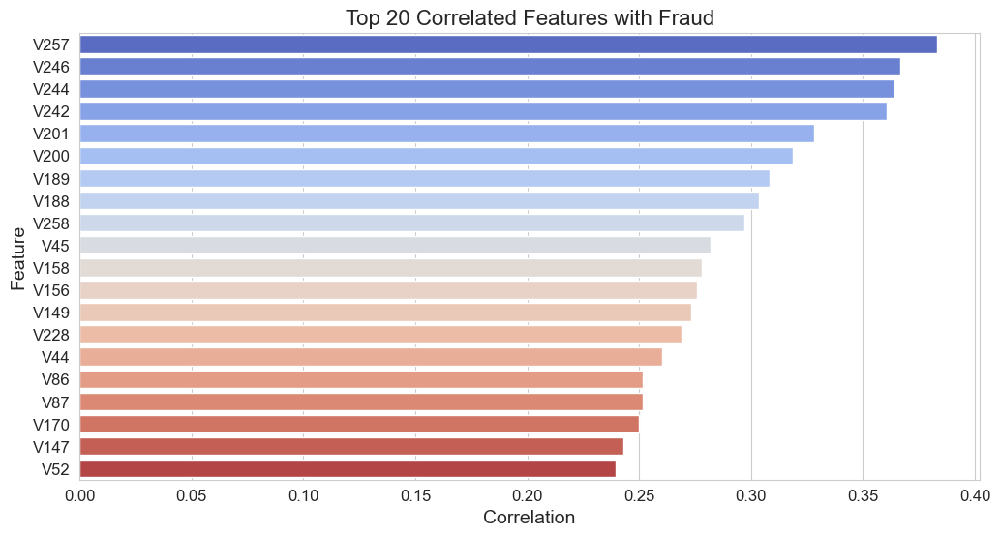

In [124]:
top_20_features = fraud_correlation_sorted[:20]
sns.barplot(x=top_20_features.values, y=top_20_features.index, hue=top_20_features.index, palette="coolwarm", legend=False)

plt.title("Top 20 Correlated Features with Fraud")
plt.xlabel("Correlation")
plt.ylabel("Feature")
plt.show()

## TransactionDT 

**Fraud Distribution Analysis Based on Time Variables**

In fraud detection, certain weekdays or time periods may exhibit a higher likelihood of fraudulent transactions. To analyze this, we first convert TransactionDT into an actual timestamp, assuming 2018-01-01 as the reference date. Since TransactionDT represents a time delta from a given reference datetime, this transformation allows us to derive meaningful time-based features. Specifically, we extract weekday (0-6, where 0 = Monday) and hour (0-23) variables from TransactionDT. By analyzing fraud occurrences across these time dimensions, we can identify patterns such as higher fraud activity during late-night hours or specific weekdays. These insights can be crucial for developing time-based fraud detection rules and enhancing model accuracy.

In [125]:
# Assume 2018-01-01 is our initial timestamp 
# TransactionDT is a timedelta from a given reference datetime 
# Convert Transaction DT to an actual timestamp
startdate = datetime.datetime.strptime('2017-12-01', '%Y-%m-%d')
train_df['TransactionDT'] = train_df['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))
test_df['TransactionDT'] = test_df['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))

# Get new variables: weekday, hour
train_df['weekday'] = (train_df['TransactionDT'].dt.dayofweek)
test_df['weekday'] = (test_df['TransactionDT'].dt.dayofweek)
train_df['hour'] = train_df['TransactionDT'].dt.hour
test_df['hour'] = test_df['TransactionDT'].dt.hour

In [126]:
train_df['month'] = train_df['TransactionDT'].dt.month
test_df['month'] = test_df['TransactionDT'].dt.month

### Mean Fraud Rate and Transaction Count by Day

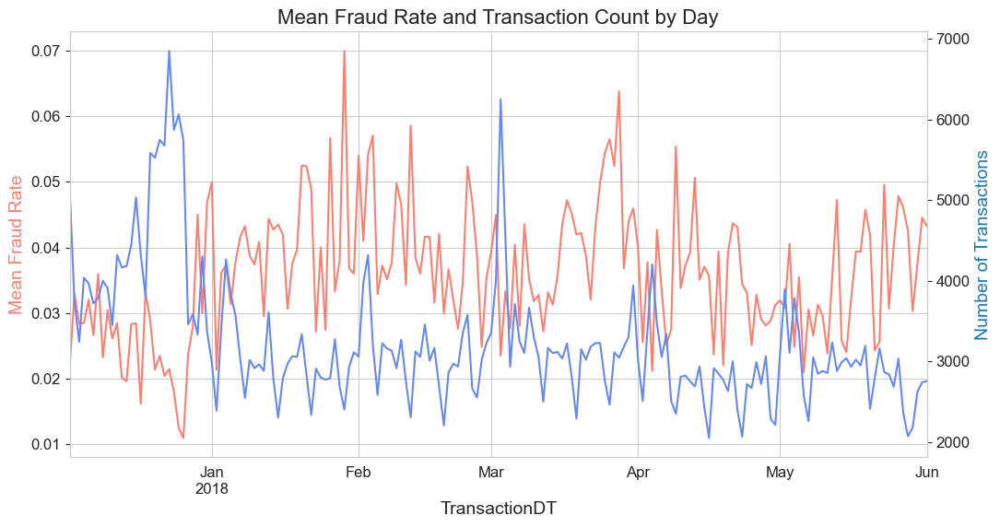

In [127]:
fig, ax1 = plt.subplots()

train_df.set_index('TransactionDT').resample('D')['isFraud'].mean().plot(ax=ax1,color='#FA8072')
ax1.set_ylabel("Mean Fraud Rate",color='#FA8072')
ax2 = ax1.twinx()

train_df.set_index('TransactionDT').resample('D').size().plot(ax=ax2)
ax2.set_ylabel("Number of Transactions", color='tab:blue')
ax2.grid(False)

plt.title("Mean Fraud Rate and Transaction Count by Day", fontsize=16)
plt.show()

### Compute Fraud Distribution by Weekday, Month, Hour

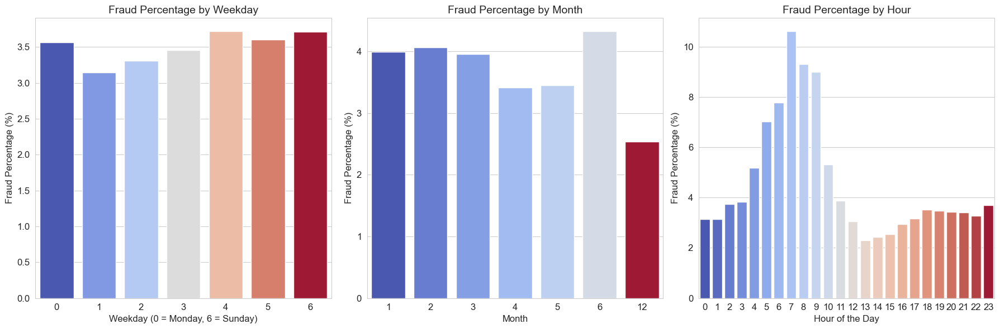

In [128]:
# Compute fraud percentage 
train_weekday_stats = train_df.groupby('weekday').agg(
    fraud_count=('isFraud', 'sum'),
    total_count=('isFraud', 'count')
).reset_index()
train_weekday_stats['fraud_percentage'] = (train_weekday_stats['fraud_count'] / train_weekday_stats['total_count']) * 100

train_month_stats = train_df.groupby('month').agg(
    fraud_count=('isFraud', 'sum'),
    total_count=('isFraud', 'count')
).reset_index()
train_month_stats['fraud_percentage'] = (train_month_stats['fraud_count'] / train_month_stats['total_count']) * 100

train_hour_stats = train_df.groupby('hour').agg(
    fraud_count=('isFraud', 'sum'),
    total_count=('isFraud', 'count')
).reset_index()
train_hour_stats['fraud_percentage'] = (train_hour_stats['fraud_count'] / train_hour_stats['total_count']) * 100

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.barplot(x='weekday', y='fraud_percentage', hue='weekday', data=train_weekday_stats, palette="coolwarm", ax=axes[0], legend=False)
axes[0].set_title("Fraud Percentage by Weekday", fontsize=14)
axes[0].set_xlabel("Weekday (0 = Monday, 6 = Sunday)", fontsize=12)
axes[0].set_ylabel("Fraud Percentage (%)", fontsize=12)

sns.barplot(x='month', y='fraud_percentage', hue='month', data=train_month_stats, palette="coolwarm", ax=axes[1], legend=False)
axes[1].set_title("Fraud Percentage by Month", fontsize=14)
axes[1].set_xlabel("Month", fontsize=12)
axes[1].set_ylabel("Fraud Percentage (%)", fontsize=12)

sns.barplot(x='hour', y='fraud_percentage', hue='hour', data=train_hour_stats, palette="coolwarm", ax=axes[2], legend=False)
axes[2].set_title("Fraud Percentage by Hour", fontsize=14)
axes[2].set_xlabel("Hour of the Day", fontsize=12)
axes[2].set_ylabel("Fraud Percentage (%)", fontsize=12)

plt.tight_layout()
plt.show()

## Transaction Amount

In [129]:
train_df.groupby('isFraud')['TransactionAmt'].describe().T

isFraud,0,1
count,569877.000000,20663.000000
mean,134.511665,149.244779
std,239.395078,232.212163
min,0.251000,0.292000
25%,43.970000,35.044000
50%,68.500000,75.000000
75%,120.000000,161.000000
max,31937.391000,5191.000000


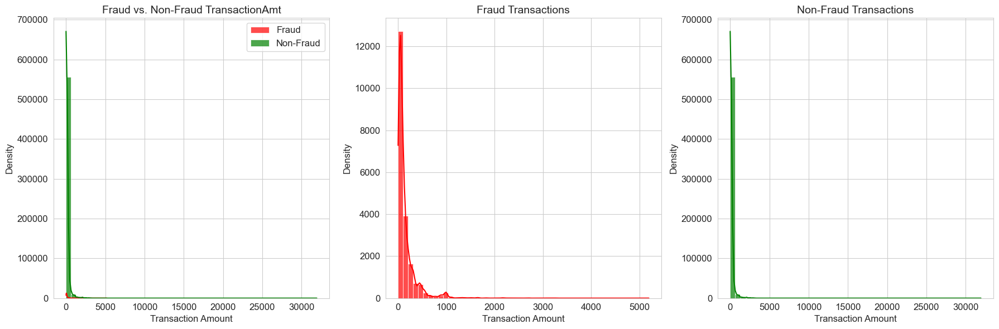

In [130]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

sns.histplot(train_df[train_df["isFraud"] == 1]["TransactionAmt"], bins=50, kde=True, color="red", alpha=0.7, label="Fraud", ax=axes[0])
sns.histplot(train_df[train_df["isFraud"] == 0]["TransactionAmt"], bins=50, kde=True, color="green", alpha=0.7, label="Non-Fraud", ax=axes[0])
axes[0].set_title("Fraud vs. Non-Fraud TransactionAmt", fontsize=14)
axes[0].set_xlabel("Transaction Amount", fontsize=12)
axes[0].set_ylabel("Density", fontsize=12)
axes[0].legend()

sns.histplot(train_df[train_df["isFraud"] == 1]["TransactionAmt"], bins=50, kde=True, color="red", alpha=0.7, ax=axes[1])
axes[1].set_title("Fraud Transactions", fontsize=14)
axes[1].set_xlabel("Transaction Amount", fontsize=12)
axes[1].set_ylabel("Density", fontsize=12)

sns.histplot(train_df[train_df["isFraud"] == 0]["TransactionAmt"], bins=50, kde=True, color="green", alpha=0.7, ax=axes[2])
axes[2].set_title("Non-Fraud Transactions", fontsize=14)
axes[2].set_xlabel("Transaction Amount", fontsize=12)
axes[2].set_ylabel("Density", fontsize=12)

plt.tight_layout()
plt.show()

From the above plots, we can see:
1. Fraudulent transactions (isFraud=1, red) are concentrated at low amounts, mostly below 1000.
2. Most transaction amounts are small, clustered near 0, with a long tail extending up to 30,000+.
    - Log transformation should be applied for better fraud/non-fraud separation in modeling.

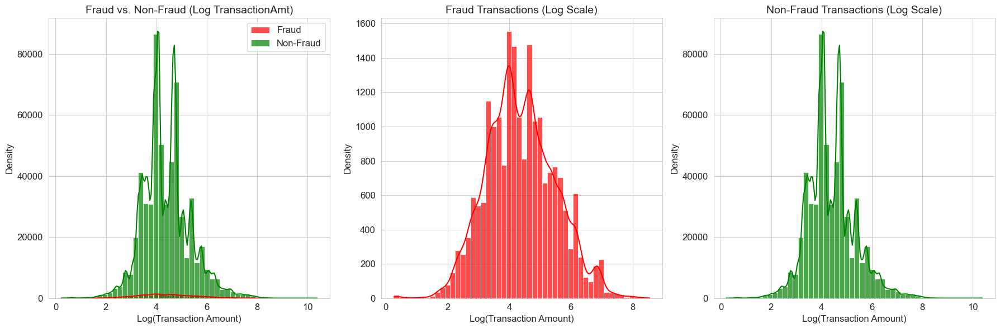

In [131]:
train_df["LogTransactionAmt"] = np.log1p(train_df["TransactionAmt"])

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
sns.histplot(train_df[train_df["isFraud"] == 1]["LogTransactionAmt"], bins=50, kde=True, color="red", alpha=0.7, label="Fraud", ax=axes[0])
sns.histplot(train_df[train_df["isFraud"] == 0]["LogTransactionAmt"], bins=50, kde=True, color="green", alpha=0.7, label="Non-Fraud", ax=axes[0])
axes[0].set_title("Fraud vs. Non-Fraud (Log TransactionAmt)", fontsize=14)
axes[0].set_xlabel("Log(Transaction Amount)", fontsize=12)
axes[0].set_ylabel("Density", fontsize=12)
axes[0].legend()

sns.histplot(train_df[train_df["isFraud"] == 1]["LogTransactionAmt"], bins=50, kde=True, color="red", alpha=0.7, ax=axes[1])
axes[1].set_title("Fraud Transactions (Log Scale)", fontsize=14)
axes[1].set_xlabel("Log(Transaction Amount)", fontsize=12)
axes[1].set_ylabel("Density", fontsize=12)

sns.histplot(train_df[train_df["isFraud"] == 0]["LogTransactionAmt"], bins=50, kde=True, color="green", alpha=0.7, ax=axes[2])
axes[2].set_title("Non-Fraud Transactions (Log Scale)", fontsize=14)
axes[2].set_xlabel("Log(Transaction Amount)", fontsize=12)
axes[2].set_ylabel("Density", fontsize=12)

plt.tight_layout()
plt.show()

From the plots, we can see:
1. Fraud (isFraud=1) is mostly concentrated between log values 3 to 6 (≈20 to 400 actual values).
    - Very few fraud cases exist beyond log 6 (≈400+ in actual amounts).
2. Fraud transactions mostly occur in low-mid value ranges, while high-value transactions are dominated by non-fraud.

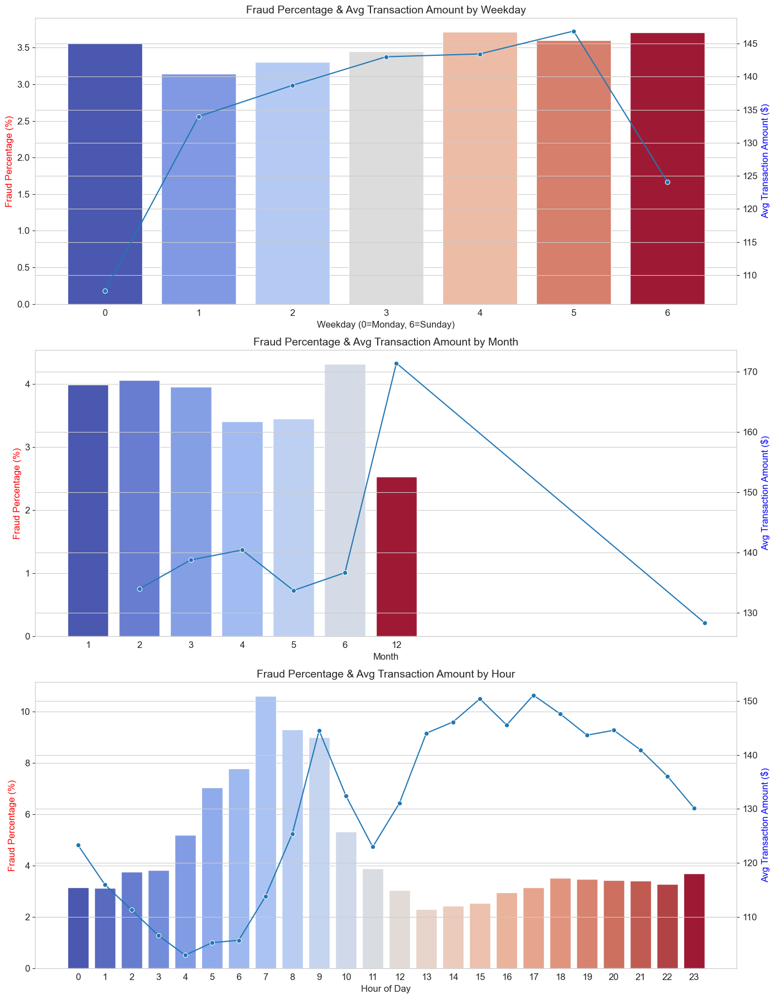

In [132]:
# Compute fraud statistics
train_weekday_stats = train_df.groupby("weekday").agg(
    fraud_count=("isFraud", "sum"),
    total_count=("isFraud", "count"),
    avg_transaction_amt=("TransactionAmt", "mean")
).reset_index()


train_weekday_stats["fraud_percentage"] = (train_weekday_stats["fraud_count"] / train_weekday_stats["total_count"]) * 100


train_month_stats = train_df.groupby("month").agg(
    fraud_count=("isFraud", "sum"),
    total_count=("isFraud", "count"),
    avg_transaction_amt=("TransactionAmt", "mean")
).reset_index()


train_month_stats["fraud_percentage"] = (train_month_stats["fraud_count"] / train_month_stats["total_count"]) * 100


train_hour_stats = train_df.groupby("hour").agg(
    fraud_count=("isFraud", "sum"),
    total_count=("isFraud", "count"),
    avg_transaction_amt=("TransactionAmt", "mean")
).reset_index()

train_hour_stats["fraud_percentage"] = (train_hour_stats["fraud_count"] / train_hour_stats["total_count"]) * 100

# Plot
fig, axes = plt.subplots(3, 1, figsize=(14, 18))

ax1 = axes[0]
ax2 = ax1.twinx()
sns.barplot(x="weekday", y="fraud_percentage", hue="weekday", data=train_weekday_stats, palette="coolwarm", legend=False, ax=ax1)
sns.lineplot(x="weekday", y="avg_transaction_amt", data=train_weekday_stats, color="tab:blue", marker="o", ax=ax2)
ax1.set_title("Fraud Percentage & Avg Transaction Amount by Weekday", fontsize=14)
ax1.set_xlabel("Weekday (0=Monday, 6=Sunday)", fontsize=12)
ax1.set_ylabel("Fraud Percentage (%)", fontsize=12, color="red")
ax2.set_ylabel("Avg Transaction Amount ($)", fontsize=12, color="blue")

ax1 = axes[1]
ax2 = ax1.twinx()
sns.barplot(x="month", y="fraud_percentage", hue="month", data=train_month_stats, palette="coolwarm", legend=False, ax=ax1)
sns.lineplot(x="month", y="avg_transaction_amt", data=train_month_stats, color="tab:blue", marker="o", ax=ax2)
ax1.set_title("Fraud Percentage & Avg Transaction Amount by Month", fontsize=14)
ax1.set_xlabel("Month", fontsize=12)
ax1.set_ylabel("Fraud Percentage (%)", fontsize=12, color="red")
ax2.set_ylabel("Avg Transaction Amount ($)", fontsize=12, color="blue")

ax1 = axes[2]
ax2 = ax1.twinx()
sns.barplot(x="hour", y="fraud_percentage", hue="hour", data=train_hour_stats, palette="coolwarm", legend=False, ax=ax1)
sns.lineplot(x="hour", y="avg_transaction_amt", data=train_hour_stats, color="tab:blue", marker="o", ax=ax2)
ax1.set_title("Fraud Percentage & Avg Transaction Amount by Hour", fontsize=14)
ax1.set_xlabel("Hour of Day", fontsize=12)
ax1.set_ylabel("Fraud Percentage (%)", fontsize=12, color="red")
ax2.set_ylabel("Avg Transaction Amount ($)", fontsize=12, color="blue")

plt.tight_layout()
plt.show()

From the plot, we can see:
1. Fraudsters exploit specific times when users or monitoring systems may be less active (mornings, weekends).
2. Higher transaction amounts do not always correspond to higher fraud rates, suggesting fraudsters may prefer targeting frequent but smaller transactions to avoid detection.

## ProductCD
Code for the product associated with the transaction.

In [133]:
product_stats = train_df.groupby('ProductCD')['isFraud'].agg(
    No_Fraud=lambda x: (x == 0).sum(),
    Fraud=lambda x: (x == 1).sum(),
    All='count'
).reset_index()

product_stats['Fraud(%)'] = (product_stats['Fraud'] / product_stats['All']) * 100
product_stats['Fraud(%)'] = product_stats['Fraud(%)'].map(lambda x: f"{x:.2f}%")
product_stats

,ProductCD,No_Fraud,Fraud,All,Fraud(%)
0,C,60511,8008,68519,11.69%
1,H,31450,1574,33024,4.77%
2,R,36273,1426,37699,3.78%
3,S,10942,686,11628,5.90%
4,W,430701,8969,439670,2.04%


From the table, we can see:
1. Category C has the most fraud%
2. Category R, S, W have less fraud%

### Product category's transaction amount across weekday, month, and hour

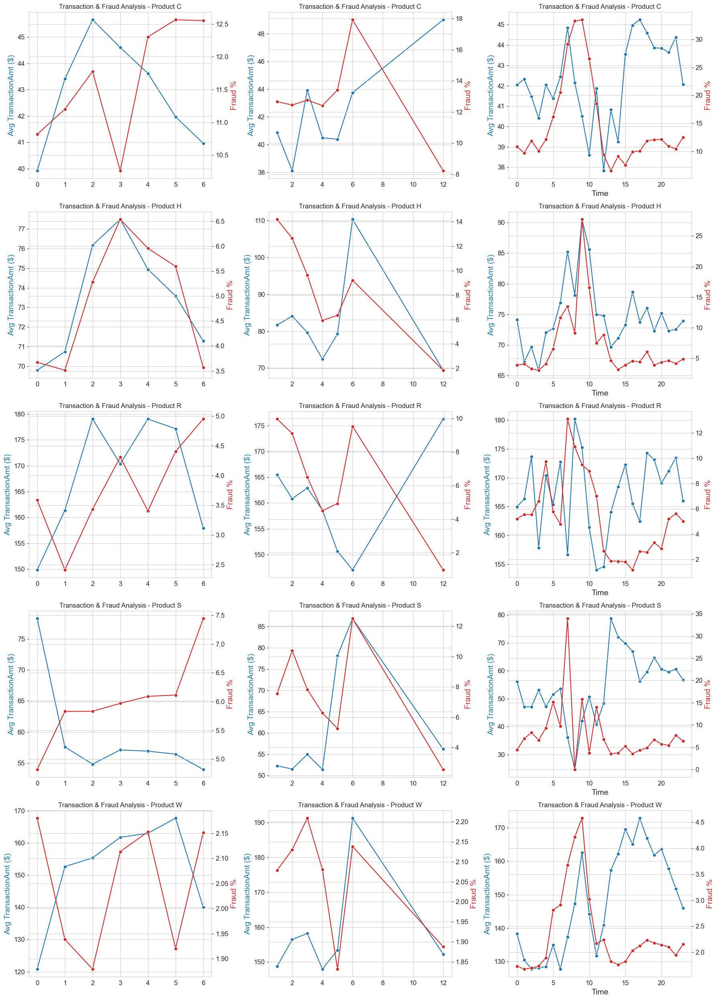

In [134]:
time_units = ['weekday', 'month', 'hour']
grouped_data = {}

for unit in time_units:
    grouped_data[unit] = train_df.groupby(['ProductCD', unit]).agg(
        fraud_count=('isFraud', 'sum'),
        total_count=('isFraud', 'count'),
        avg_transaction_amt=('TransactionAmt', 'mean')
    ).reset_index()
    grouped_data[unit]['fraud_percentage'] = (grouped_data[unit]['fraud_count'] / grouped_data[unit]['total_count']) * 100

products = sorted(train_df['ProductCD'].unique())

def plot_dual_axis_subplots(grouped_data, x_var, x_label, title_prefix):
    fig, axes = plt.subplots(len(products), 3, figsize=(18, 5 * len(products)), sharex=False)
    
    for i, prod in enumerate(products):
        for j, unit in enumerate(time_units):
            ax1 = axes[i, j]
            ax2 = ax1.twinx()
            data = grouped_data[unit][grouped_data[unit]['ProductCD'] == prod]

            # Avg TransactionAmt on primary y-axis (blue)
            sns.lineplot(x=unit, y='avg_transaction_amt', data=data, marker='o', color='tab:blue', ax=ax1)
            # Fraud Percentage on secondary y-axis (red)
            sns.lineplot(x=unit, y='fraud_percentage', data=data, marker='o', color='tab:red', ax=ax2)

            ax1.set_title(f"{title_prefix} - Product {prod}", fontsize=12)
            ax1.set_xlabel(x_label if j == 2 else "")
            ax1.set_ylabel("Avg TransactionAmt ($)", color='tab:blue')
            ax2.set_ylabel("Fraud %", color='tab:red')
            


    plt.tight_layout()
    plt.show()

plot_dual_axis_subplots(grouped_data, x_var='Time', x_label="Time", title_prefix="Transaction & Fraud Analysis")

From the plots, we can see:
1. Some categories, such as Product H & R, show sharp peaks in fraud at specific times (e.g., certain hours or days), which suggests that fraud is not evenly distributed across time.
2. If fraud behavior is time-sensitive, we might need time-based features like DT_W, DT_M, or other rolling averages to capture this behavior.

Therefore, instead of using simple label encoding, which treats ProductCD as an ordinal variable, we need categorical encoding that captures:
- Fraud trends per product over time (ProductCD_W_Day, ProductCD_C_Day, etc.).
- Transaction count trends per product per day (to measure popularity or unusual spikes).

Why Not Use Simple Label Encoding?
- Label Encoding assumes an ordinal relationship between categories, but ignore time-dependent properties.
- One-Hot Encoding would create too many sparse features.

## D1-D15: timedelta, such as days between previous transaction, etc

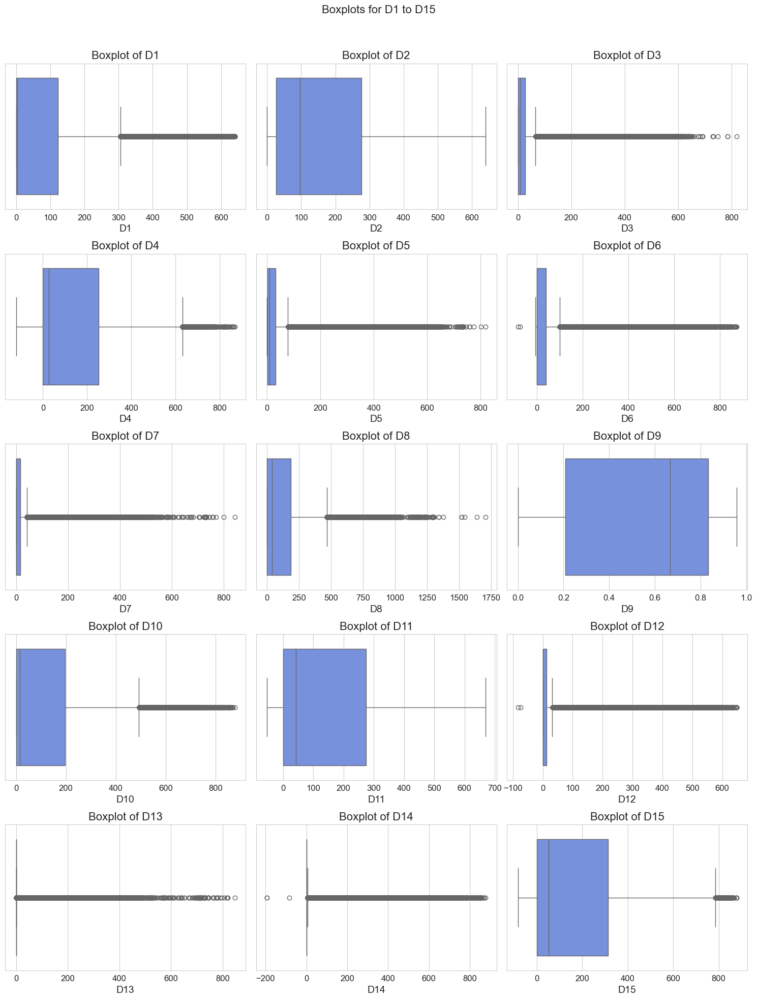

In [135]:
D_list = ['D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15']

fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 20))
fig.suptitle("Boxplots for D1 to D15", fontsize=16)
axes = axes.flatten()
for i, col in enumerate(D_list):
    sns.boxplot(x=train_df[col], ax=axes[i])
    axes[i].set_title(f"Boxplot of {col}")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

## V columns

Objective: Identify and eliminate redundant features by first grouping columns with same missing value (NaN) number. Within each group, further refine sub-groups based on feature correlation and select the most representative feature from each sub-group.Process Overview

1.	Identify Correlated Features Based on NaNs; Group features with the same number of missing value into groups 
2.	Find Correlated Features Within Each Group; Further group features with similar correlation pattern into sub-group.
3.	Select Representative Features
    - Choose the feature with the highest number of unique values as it preserves more information.
    - If unique values are similar, prefer the feature with fewer NaNs.


### Find correlated columns based on nan

In [136]:
nans_df = train_df.isna()
nans_groups={}
i_cols = ['V'+str(i) for i in range(1,340)]
for col in train_df.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group]=[col]
del nans_df; x=gc.collect()

for k,v in nans_groups.items():
    print('####### NAN count =',k)
    print(v)

####### NAN count = 0
['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'weekday', 'hour', 'month', 'LogTransactionAmt']
####### NAN count = 8933
['card2']
####### NAN count = 1565
['card3']
####### NAN count = 1577
['card4']
####### NAN count = 4259
['card5']
####### NAN count = 1571
['card6']
####### NAN count = 65706
['addr1', 'addr2']
####### NAN count = 352271
['dist1']
####### NAN count = 552913
['dist2']
####### NAN count = 94456
['P_emaildomain']
####### NAN count = 453249
['R_emaildomain']
####### NAN count = 1269
['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']
####### NAN count = 280797
['D2']
####### NAN count = 262878
['D3']
####### NAN count = 168922
['D4']
####### NAN count = 309841
['D5']
####### NAN count = 517353
['D6']
####### NAN count = 551623
['D7']
####### NAN count = 515614
['D8', 'D9', 'id_09'

### V1-V11, D11 (NAN count = 279287)

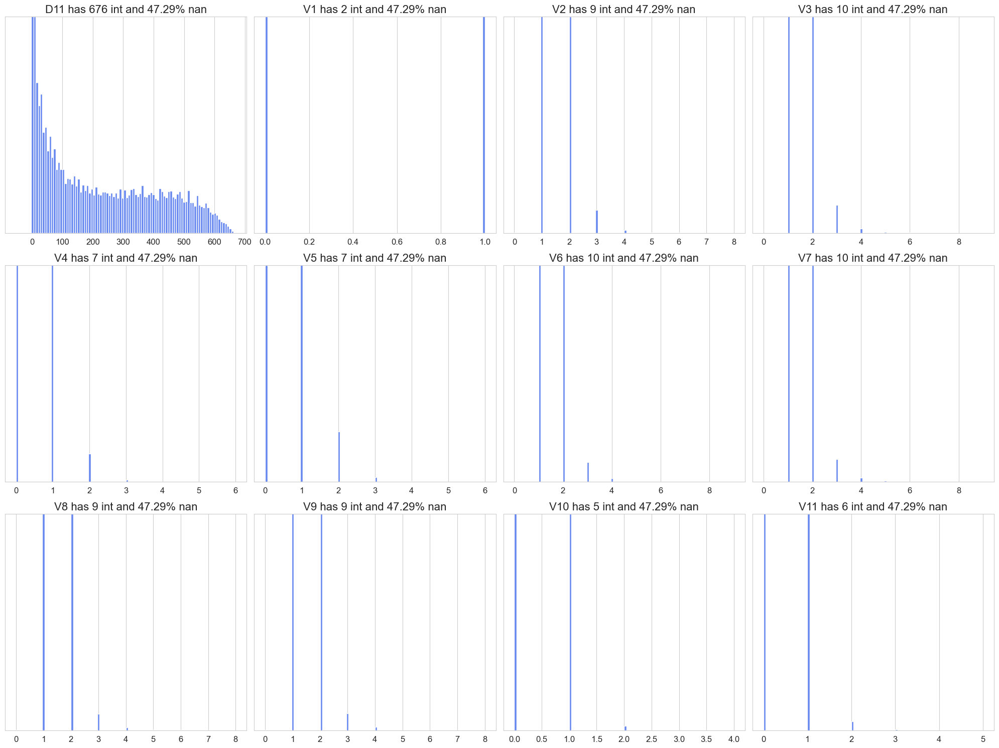

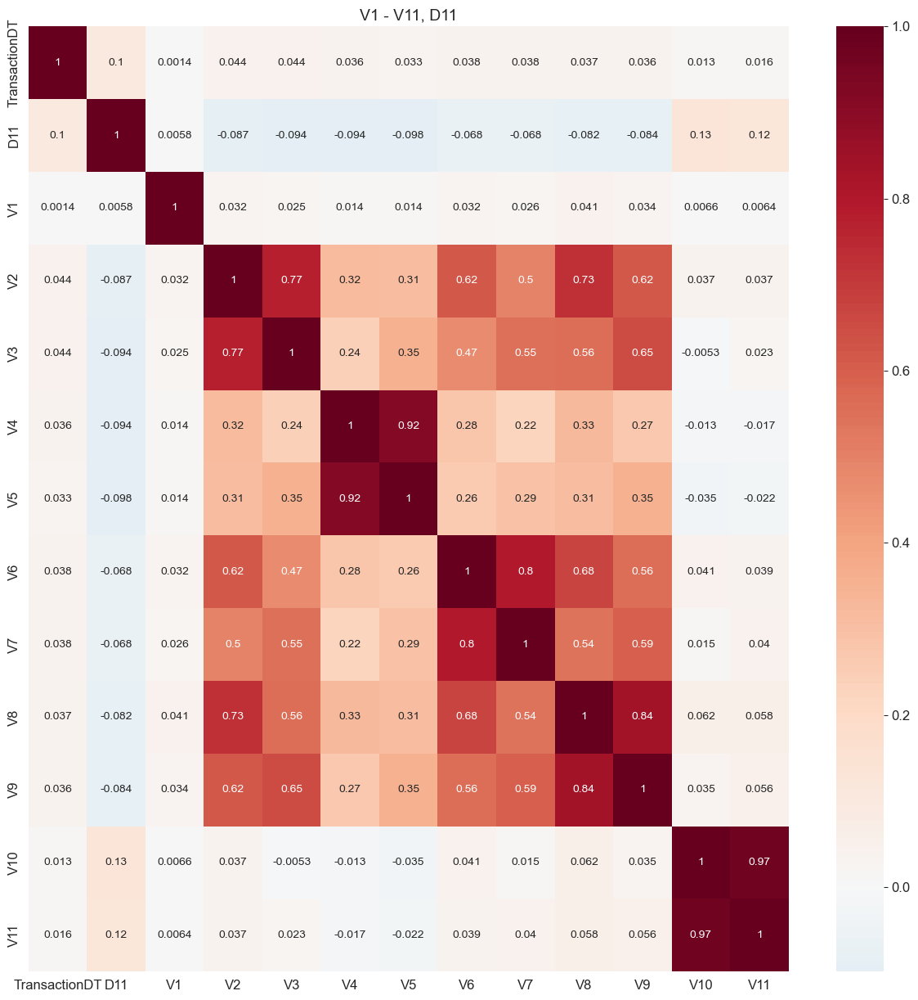

In [137]:
Vc = ['dayr', 'isFraud', 'TransactionAmt', 'card1', 'addr1', 'D1n', 'D11n']
Vs = nans_groups[279287]
Vtitle = 'V1 - V11, D11'

def make_plots(Vs):
    col = 4
    row = (len(Vs) + col - 1) // col  # Ensures enough rows for all variables
    fig, axes = plt.subplots(row, col, figsize=(20, row * 5))
    axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

    idx = train_df[~train_df[Vs[0]].isna()].index
    for i, v in enumerate(Vs):
        ax = axes[i]
        n = train_df[v].nunique()
        x = np.sum(train_df.loc[idx, v] != train_df.loc[idx, v].astype(int))
        y = np.round(100 * np.sum(train_df[v].isna()) / len(train_df), 2)
        t = 'int' if x == 0 else 'float'
        
        ax.set_title(f"{v} has {n} {t} and {y}% nan")
        ax.set_yticks([])
        h = ax.hist(train_df.loc[idx, v], bins=100)
        
        if len(h[0]) > 1:
            ax.set_ylim((0, np.sort(h[0])[-2]))

    # Hide any unused subplots
    for i in range(len(Vs), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

make_plots(Vs)

def make_corr(Vs, Vtitle=''):
    cols = ['TransactionDT'] + Vs
    plt.figure(figsize=(15, 15))
    sns.heatmap(train_df[cols].corr(), cmap='RdBu_r', annot=True, center=0.0)
    plt.title(Vtitle if Vtitle else f"{Vs[0]} - {Vs[-1]}", fontsize=14)
    plt.show()

make_corr(Vs, Vtitle)

In [138]:
# Define groups of related variables for feature selection
# Each sublist contains variable indices that are considered similar or redundant
feature_groups = [[1], [2, 3], [4, 5], [6, 7], [8, 9], [10, 11]]

def select_representative_features(feature_groups, prefix='V'):
    """
    Selects the most representative feature from each group in `feature_groups`.

    Parameters:
    - feature_groups (list of lists): Groups of related feature indices.
    - prefix (str): Column name prefix (default is 'V').

    Returns:
    - Prints the selected feature indices.
    """
    selected_features = []  

    for group in feature_groups:
        max_unique_values = 0  # Track the highest unique value count
        best_feature = group[0]  # Default to the first feature in the group

        for feature_index in group:
            # Count the number of unique values in the column
            column_name = f"{prefix}{feature_index}"
            unique_count = train_df[column_name].nunique()

            # Select the feature with the highest number of unique values
            if unique_count > max_unique_values:
                max_unique_values = unique_count
                best_feature = feature_index
        # Append
        selected_features.append(best_feature)

    print("Selected representative features:", selected_features)

select_representative_features(feature_groups)

Selected representative features: [1, 3, 4, 6, 8, 11]


### V12-V34 (NAN count = 76073)

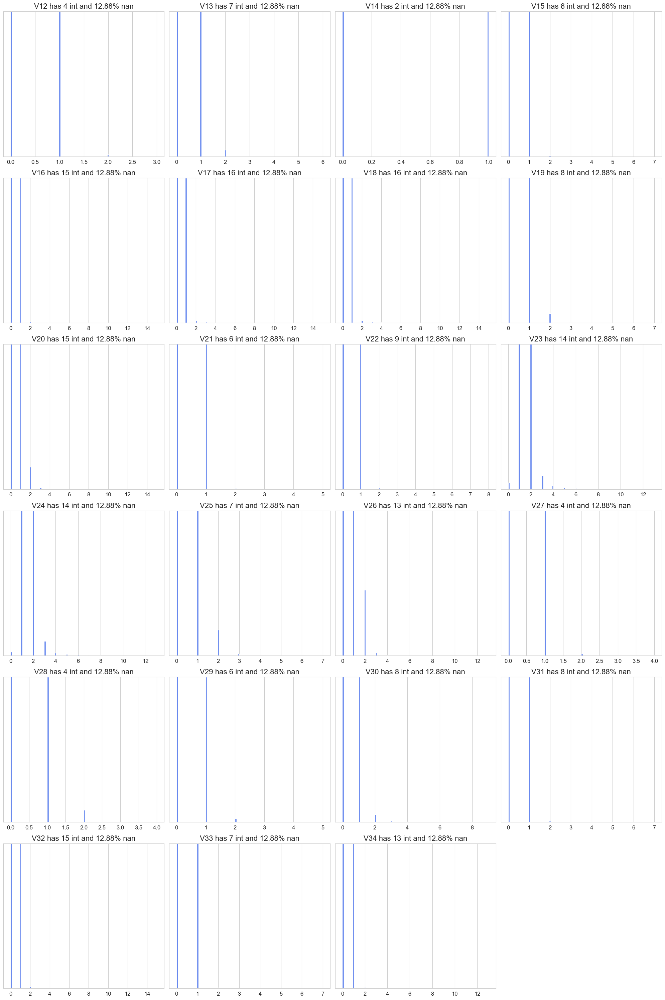

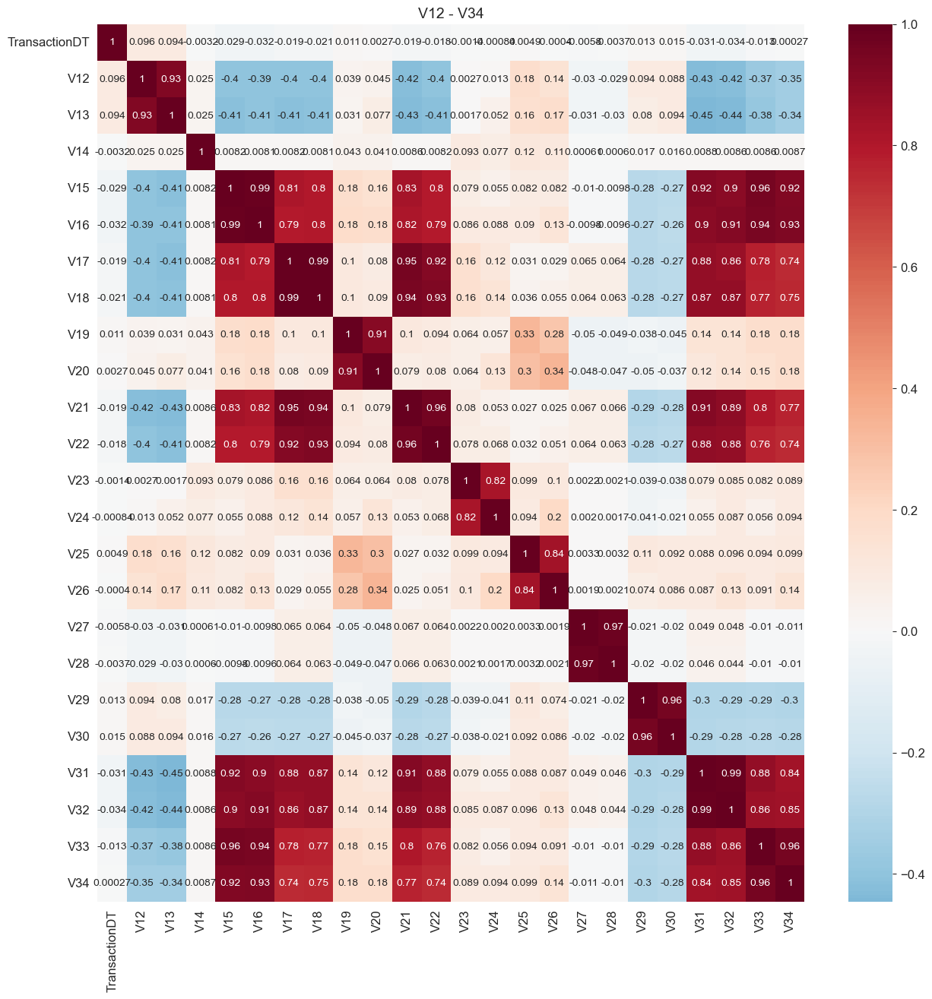

In [139]:
Vs = nans_groups[76073]
make_plots(Vs)
make_corr(Vs)

In [140]:
features_group = [[12,13],[14],[15,16,17,18,21,22,31,32,33,34],[19,20],[23,24],[25,26],[27,28],[29,30]]
select_representative_features(features_group)

Selected representative features: [13, 14, 17, 20, 23, 26, 27, 30]


### V35 - V52

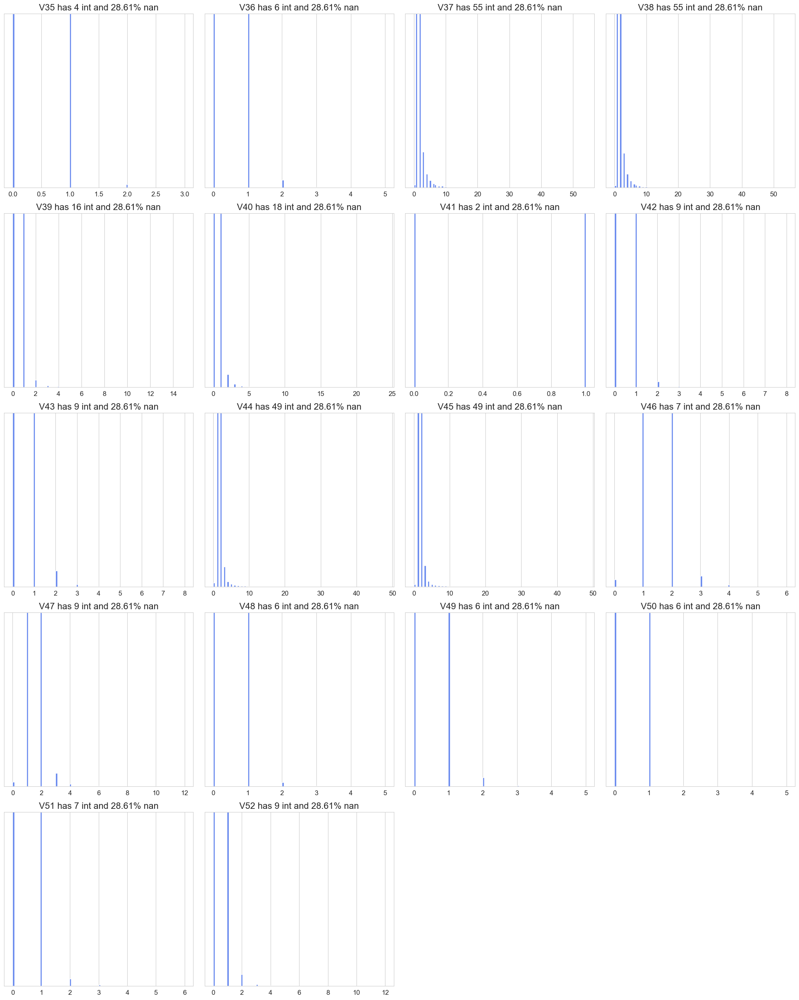

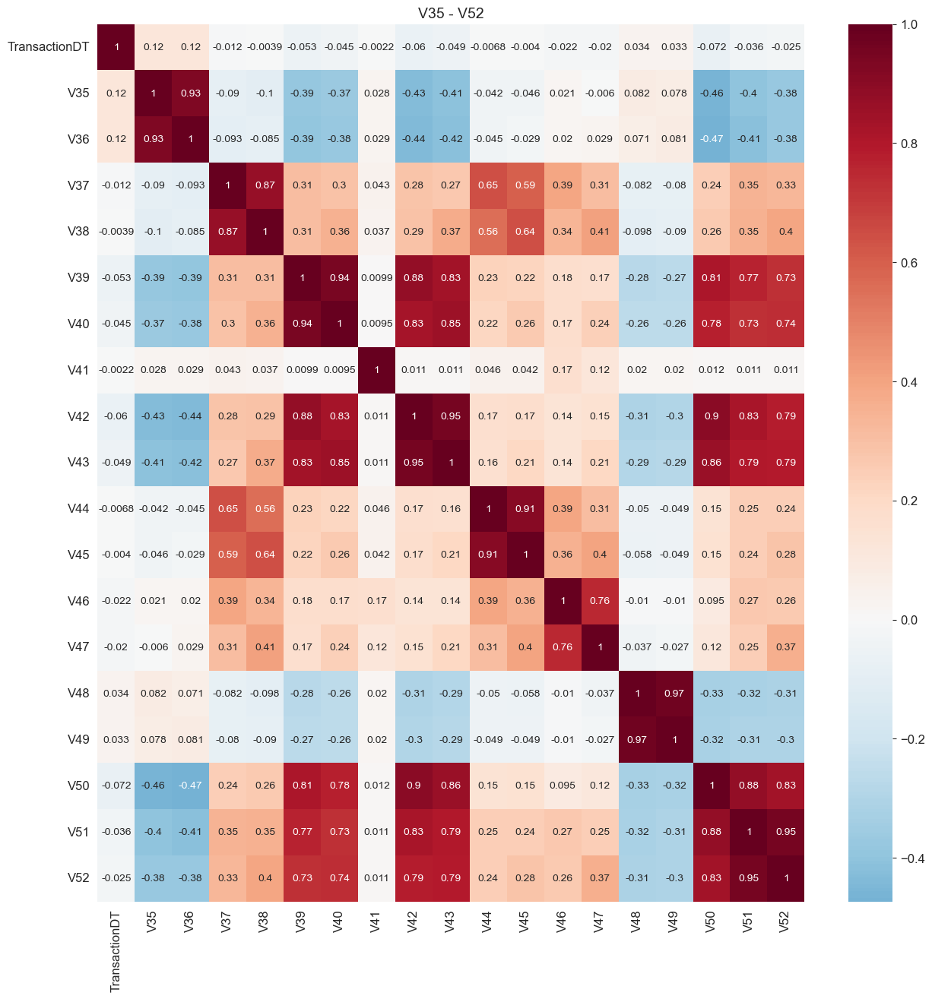

In [141]:
Vs = nans_groups[168969]
make_plots(Vs)
make_corr(Vs)

In [142]:
grps = [[35,36],[37,38],[39,40,42,43,50,51,52],[41],[44,45],[46,47],[48,49]]
select_representative_features(grps)

Selected representative features: [36, 37, 40, 41, 44, 47, 48]


### V53 - V74

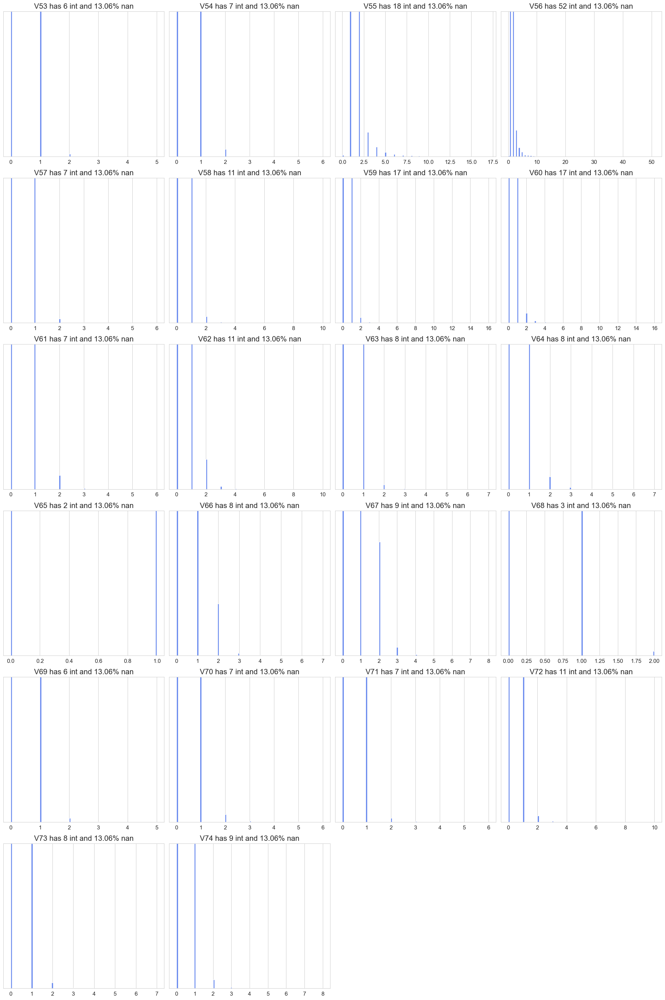

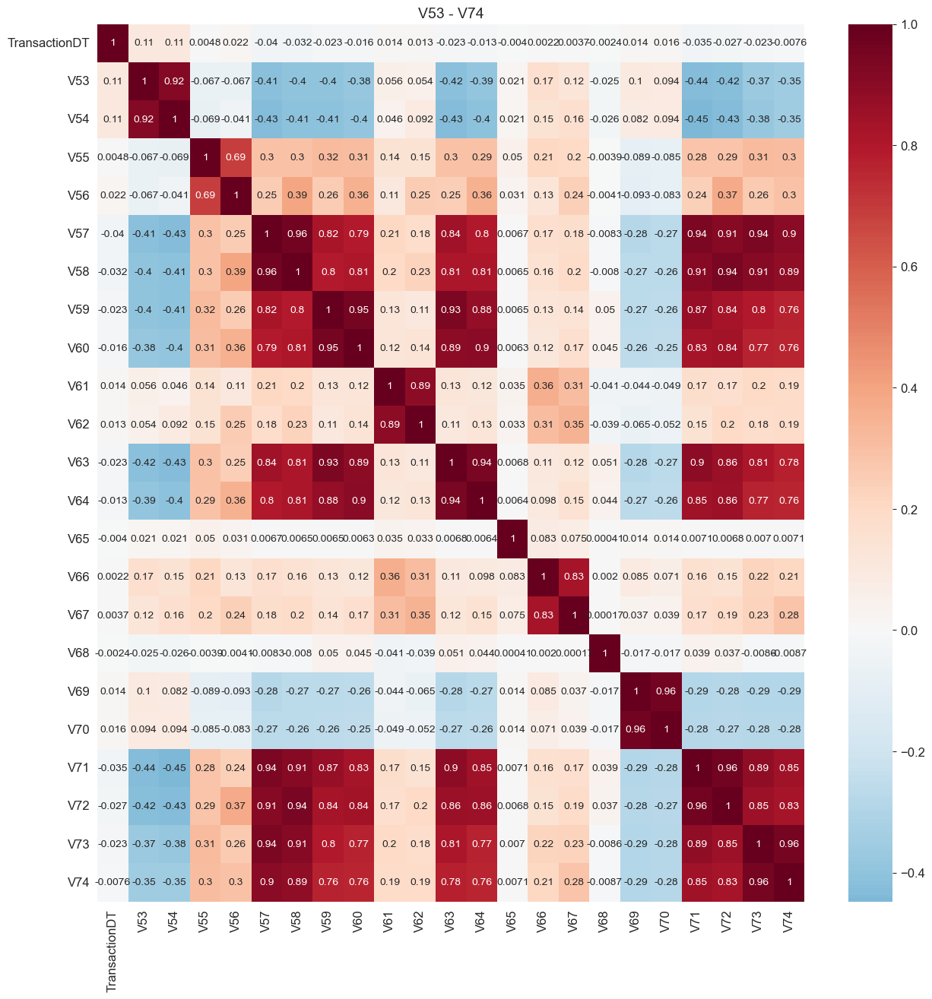

In [143]:
Vs = nans_groups[77096]
make_plots(Vs)
make_corr(Vs)

In [144]:
grps = [[53,54],[55,56],[57,58,59,60,63,64,71,72,73,74],[61,62],[65],[66,67],[68],[69,70]]
select_representative_features(grps)

Selected representative features: [54, 56, 59, 62, 65, 67, 68, 70]


### V75 - V94

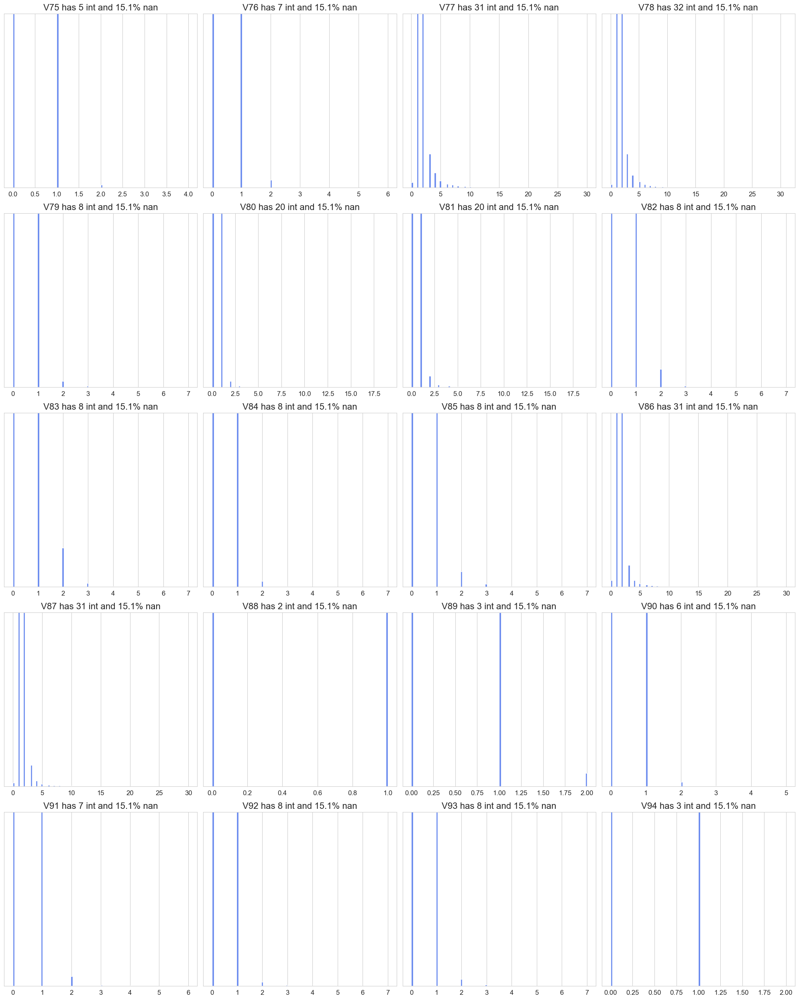

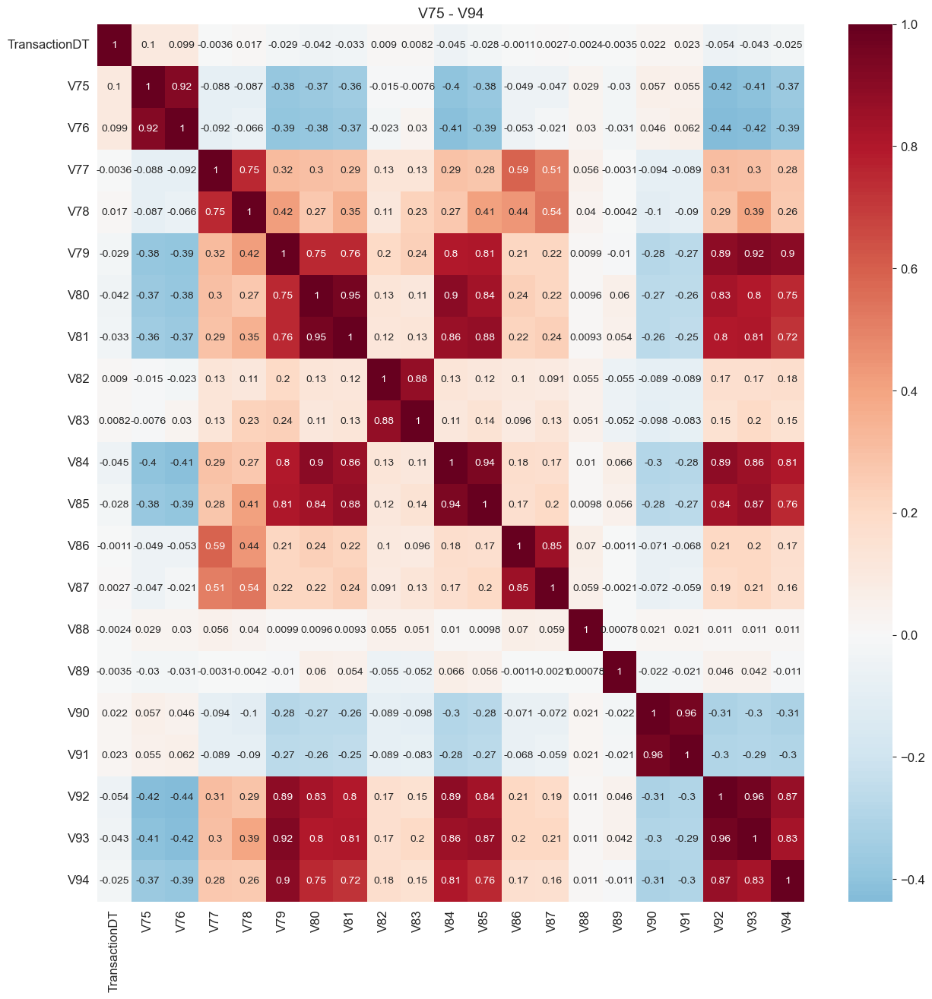

In [145]:
Vs = nans_groups[89164]
make_plots(Vs)
make_corr(Vs)

In [146]:
grps = [[75,76],[77,78],[79,80,81,84,85,92,93,94],[82,83],[86,87],[88],[89],[90,91]]
select_representative_features(grps)

Selected representative features: [76, 78, 80, 82, 86, 88, 89, 91]


### V95 - V137

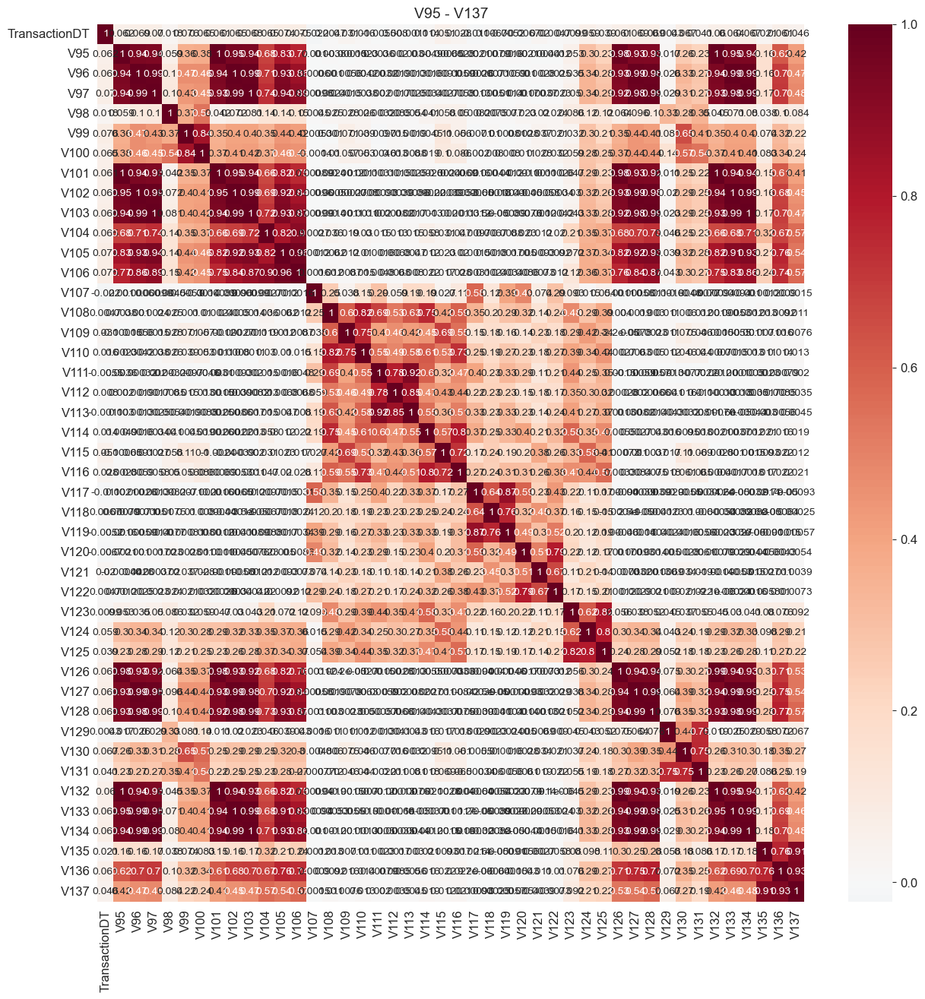

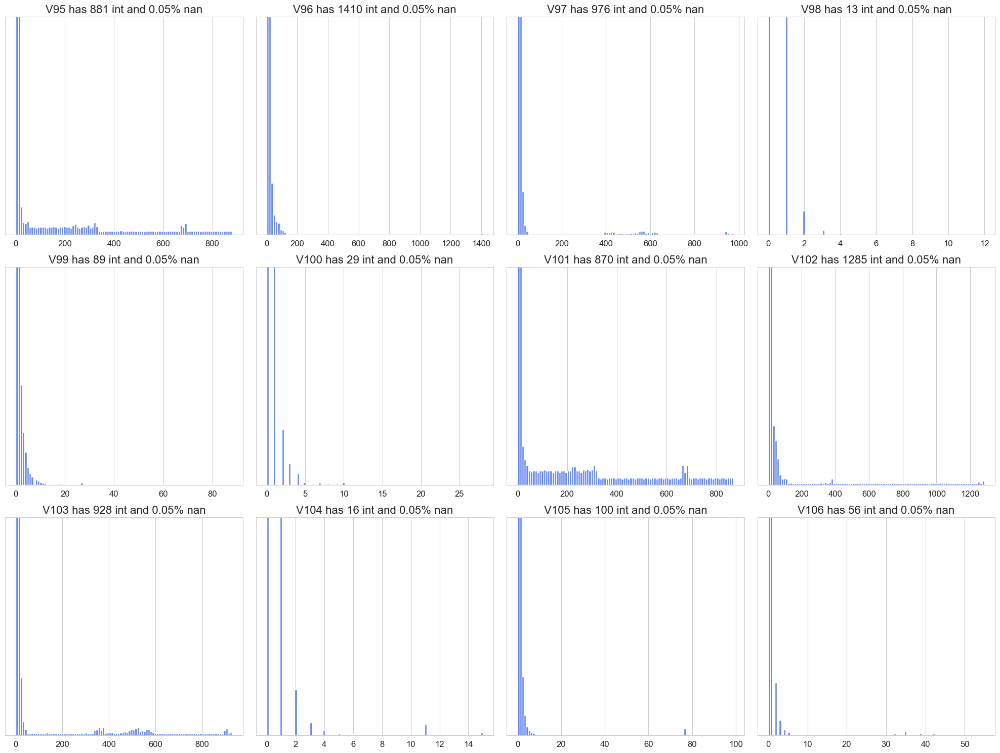

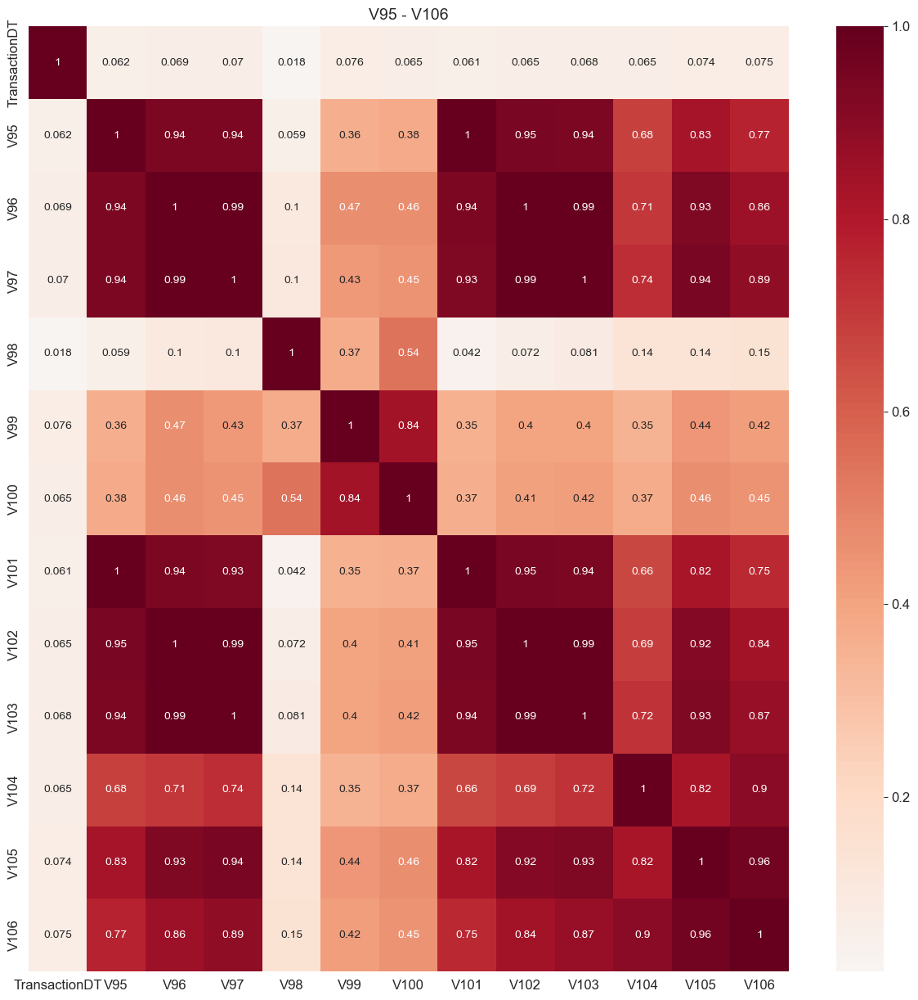

In [147]:
Vs = nans_groups[314]
make_corr(Vs)

Vs = ['V'+str(x) for x in range(95,107)]
make_plots(Vs)
make_corr(Vs)

In [148]:
grps = [[95,96,97,101,102,103,105,106],[98],[99,100],[104]]
select_representative_features(grps)

Selected representative features: [96, 98, 99, 104]


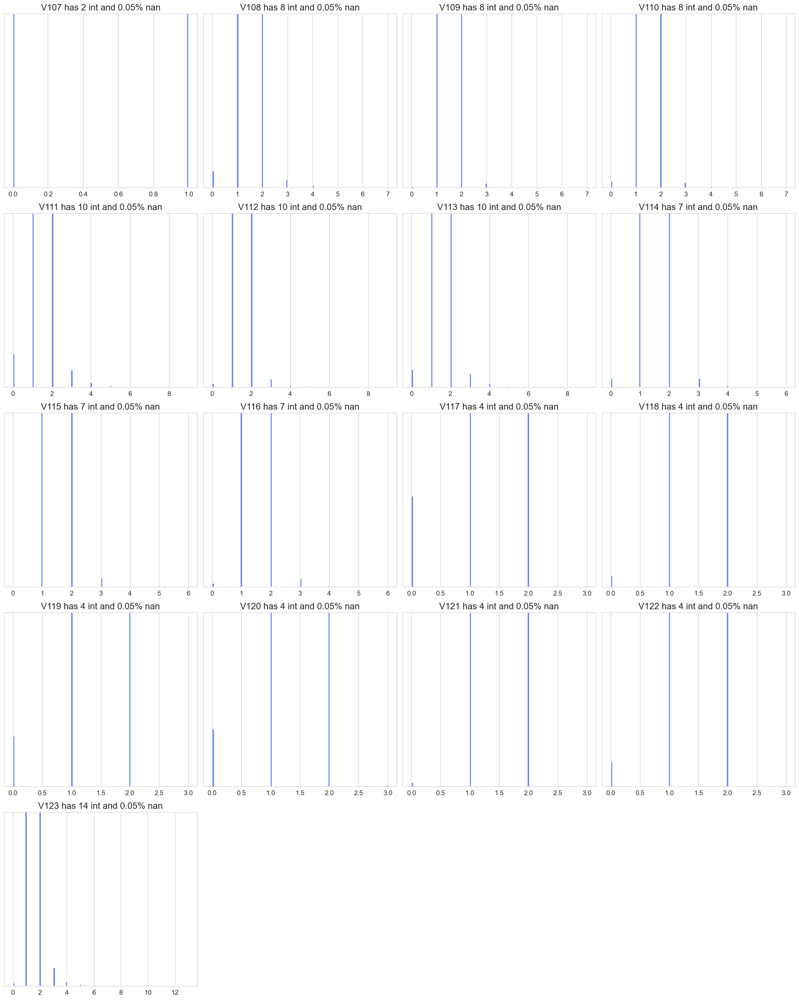

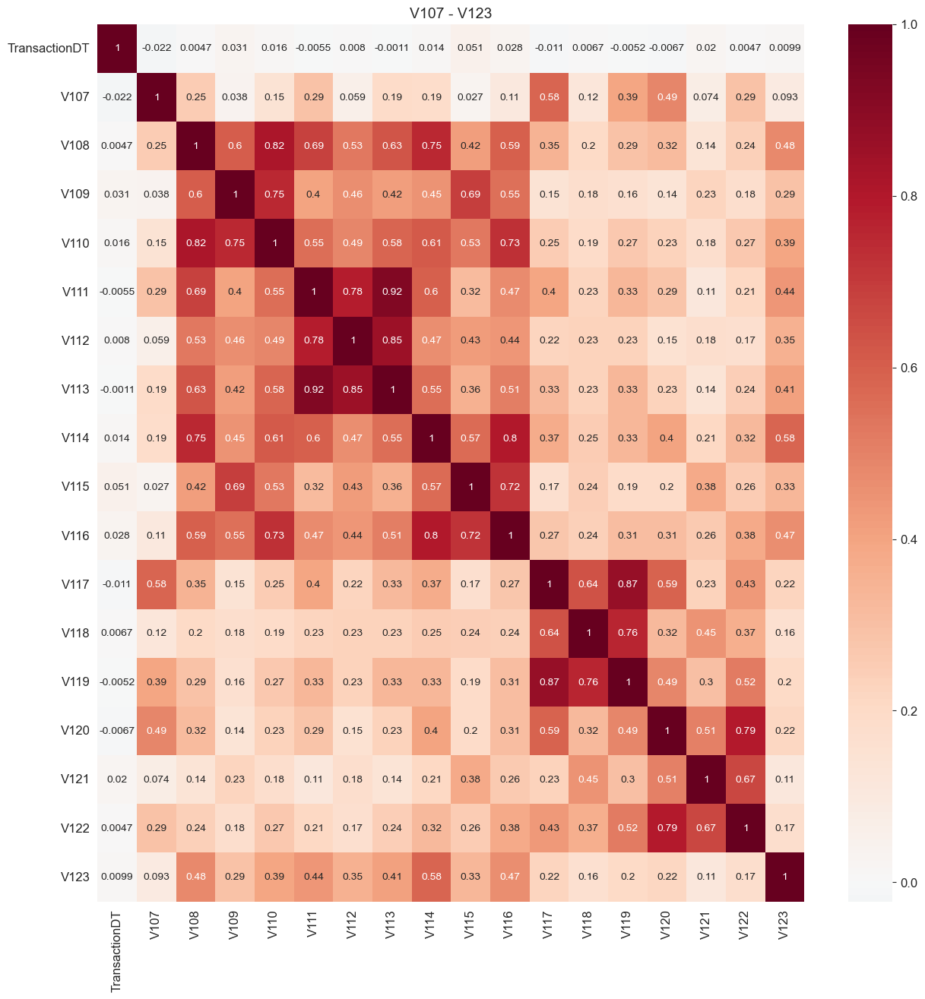

In [149]:
Vs = ['V'+str(x) for x in range(107,124)]
make_plots(Vs)
make_corr(Vs)

In [150]:
grps = [[107],[108,109,110,114],[111,112,113],[115,116],[117,118,119],[120,122],[121],[123]]
select_representative_features(grps)

Selected representative features: [107, 108, 111, 115, 117, 120, 121, 123]


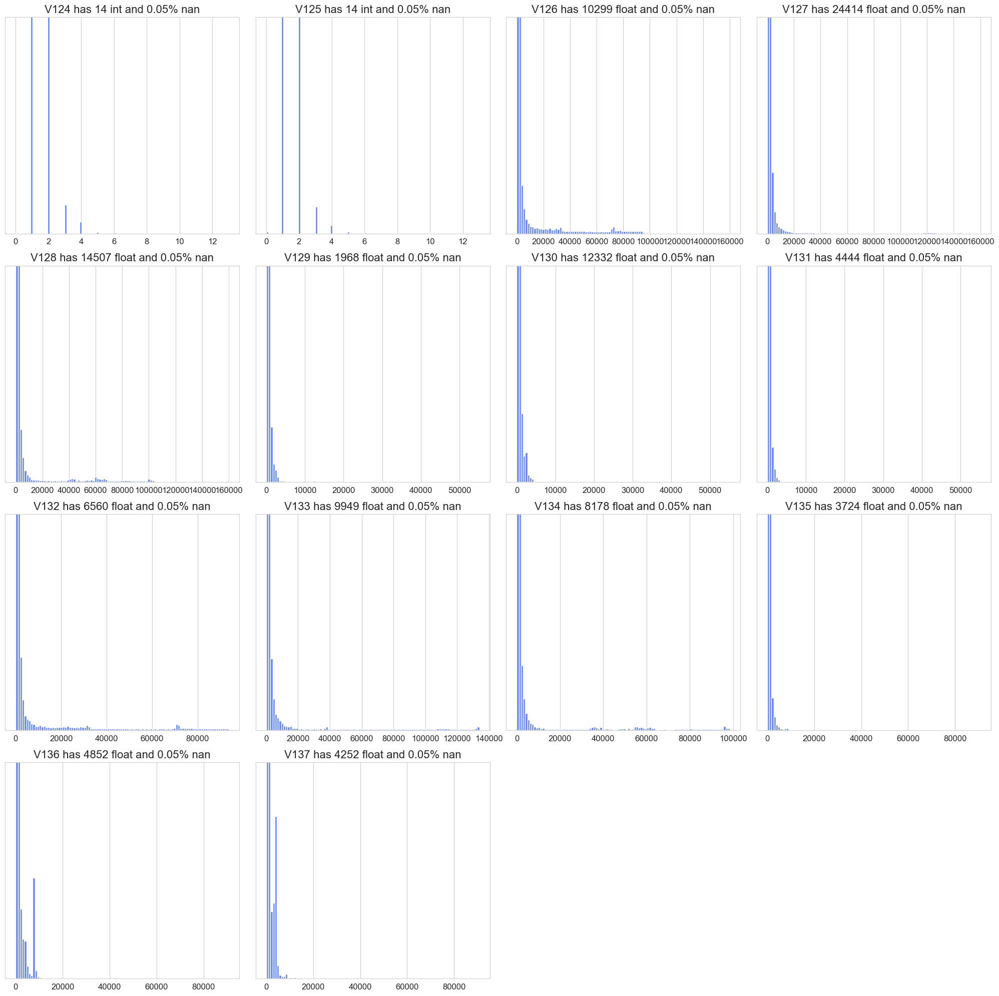

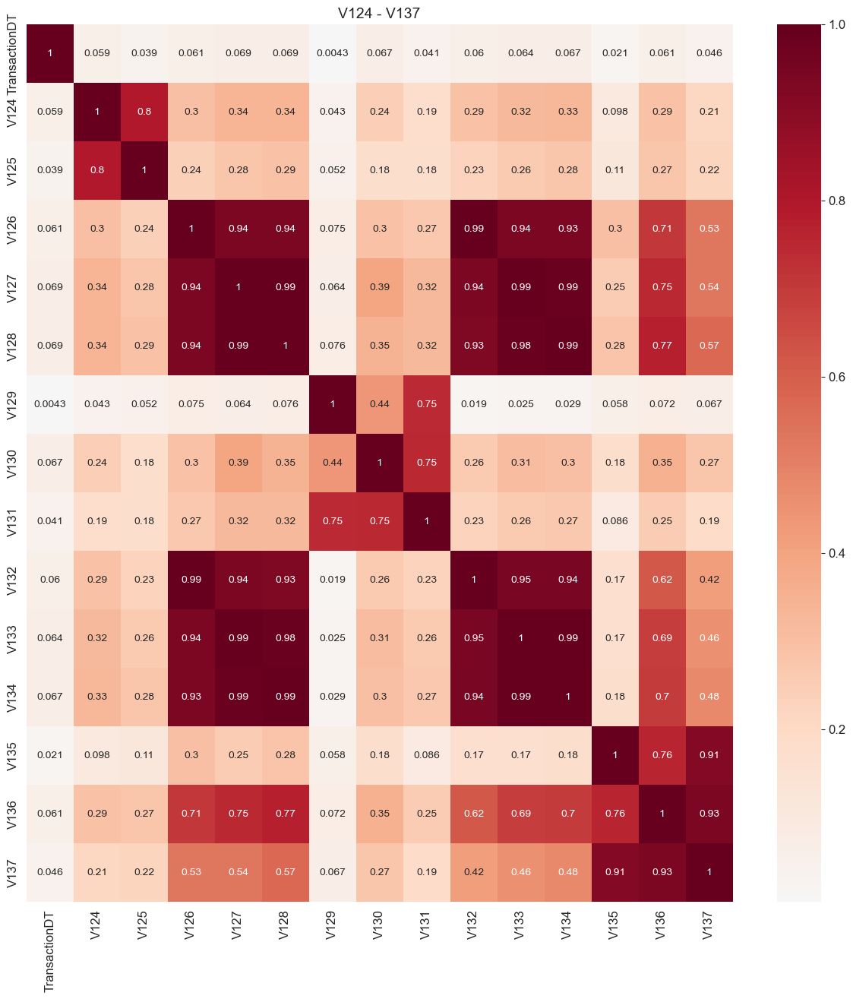

In [151]:
Vs = ['V'+str(x) for x in range(124,138)]
make_plots(Vs)
make_corr(Vs)

In [152]:
grps = [[124,125],[126,127,128,132,133,134],[129],[130,131],[135,136,137]]
select_representative_features(grps)

Selected representative features: [124, 127, 129, 130, 136]


### V138 ~ V163

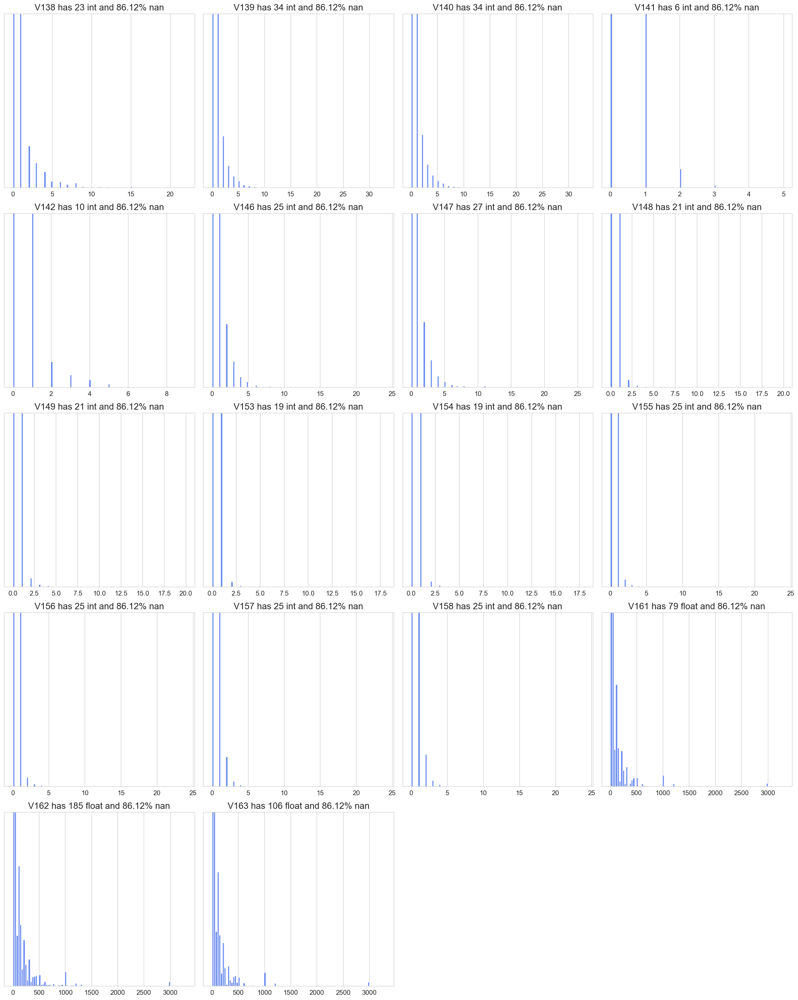

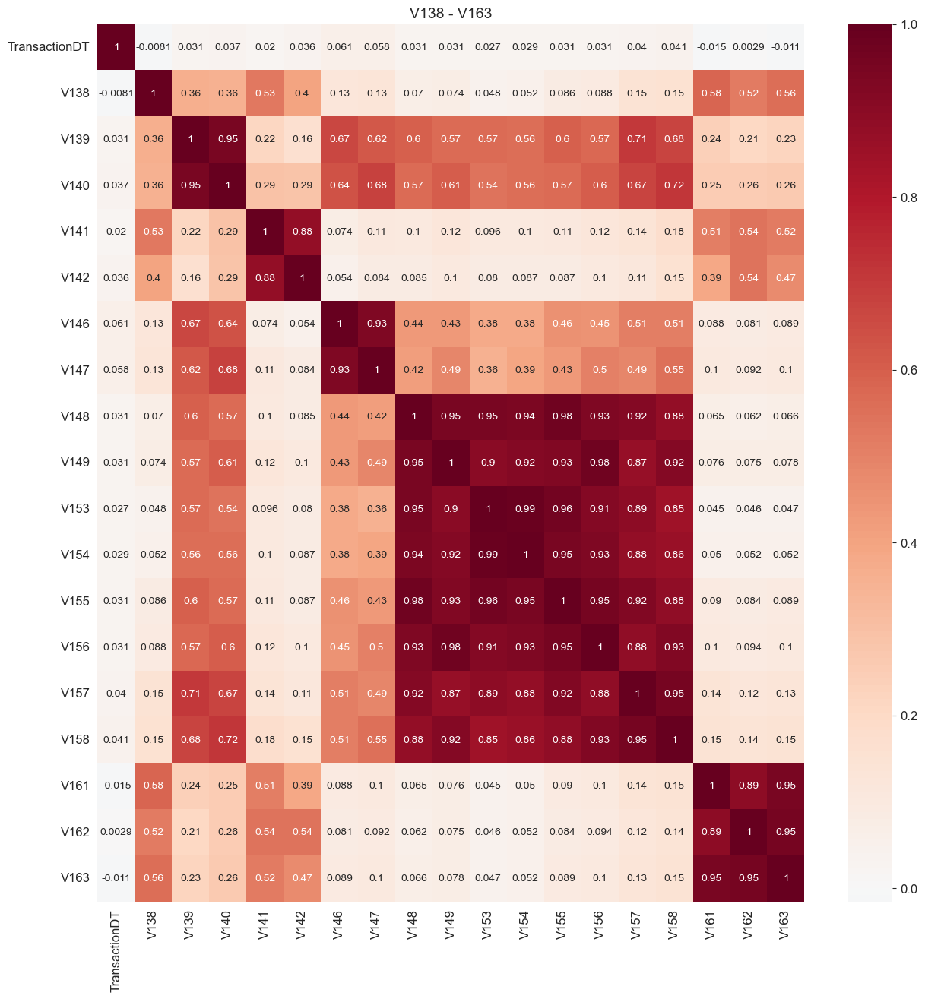

In [153]:
Vs = nans_groups[508595]
make_plots(Vs)
make_corr(Vs)

In [154]:
grps = [[138],[139,140],[141,142],[146,147],[148,149,153,154,156,157,158],[161,162,163]]
select_representative_features(grps)

Selected representative features: [138, 139, 142, 147, 156, 162]


### V143 ~ V166

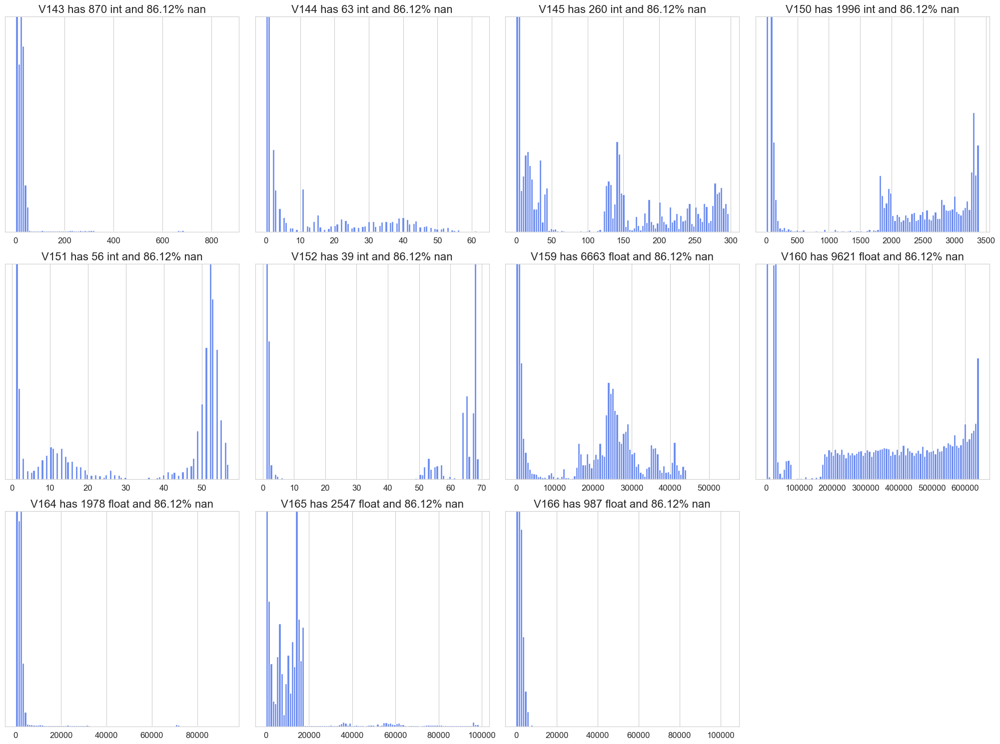

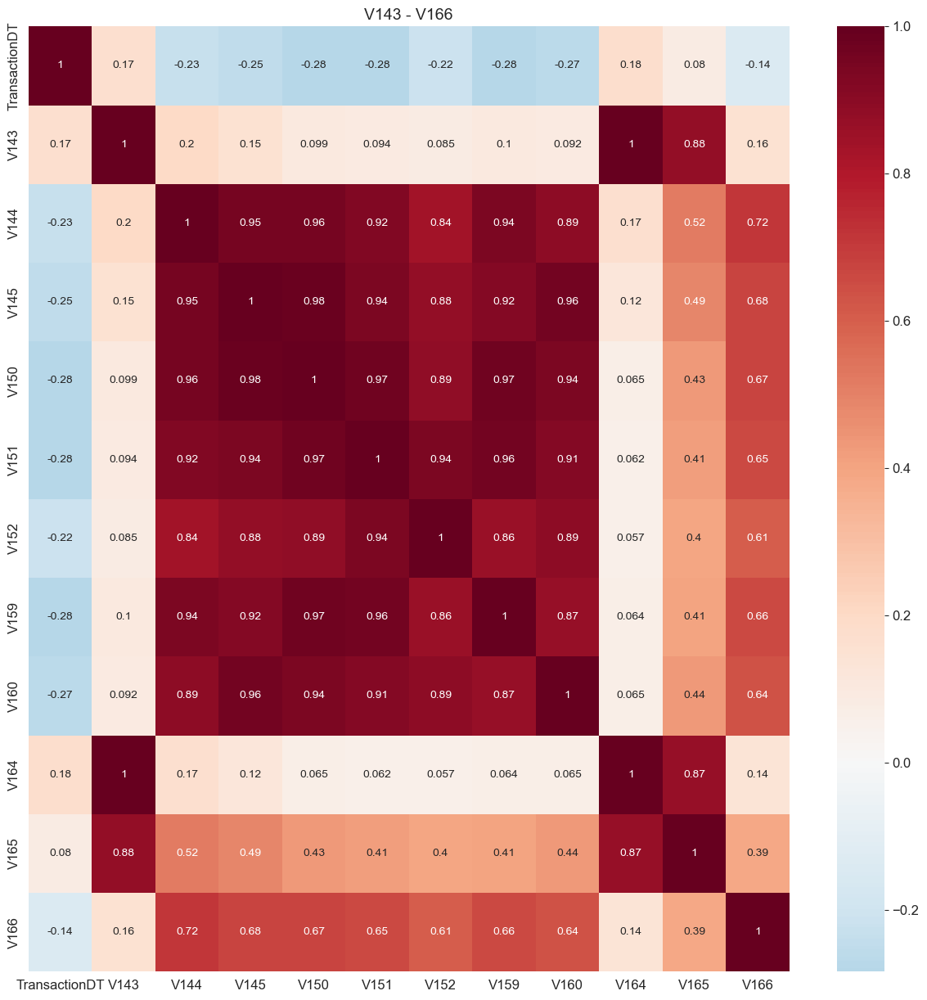

In [155]:
Vs = nans_groups[508589]
make_plots(Vs)
make_corr(Vs)

In [156]:
grps = [[143,164,165],[144,145,150,151,152,159,160],[166]]
select_representative_features(grps)

Selected representative features: [165, 160, 166]


### V167 ~ V216

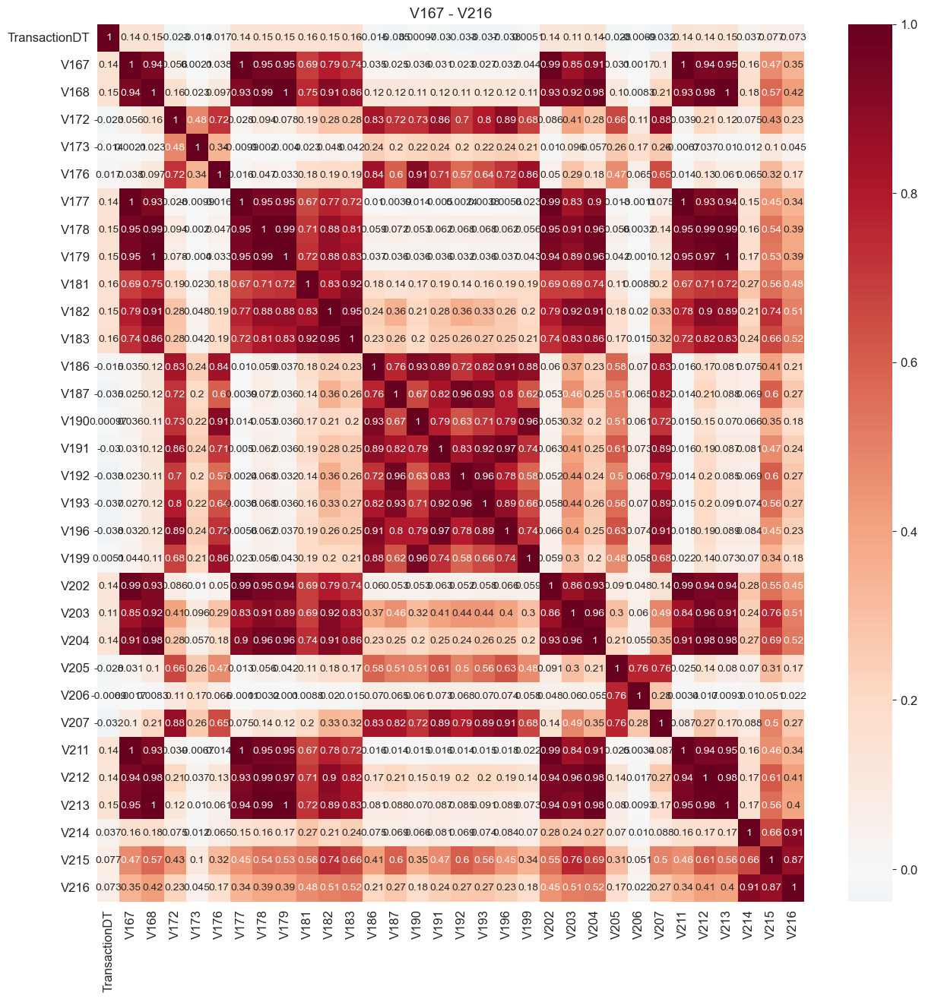

In [157]:
Vs = [x for x in nans_groups[450909]]
make_corr(Vs)

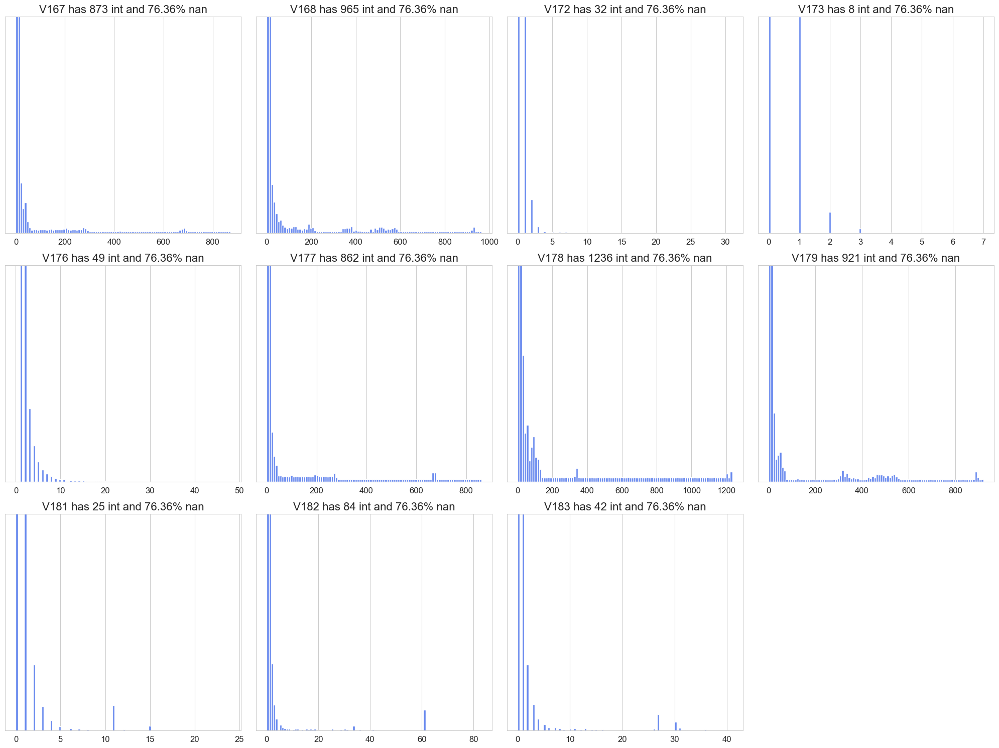

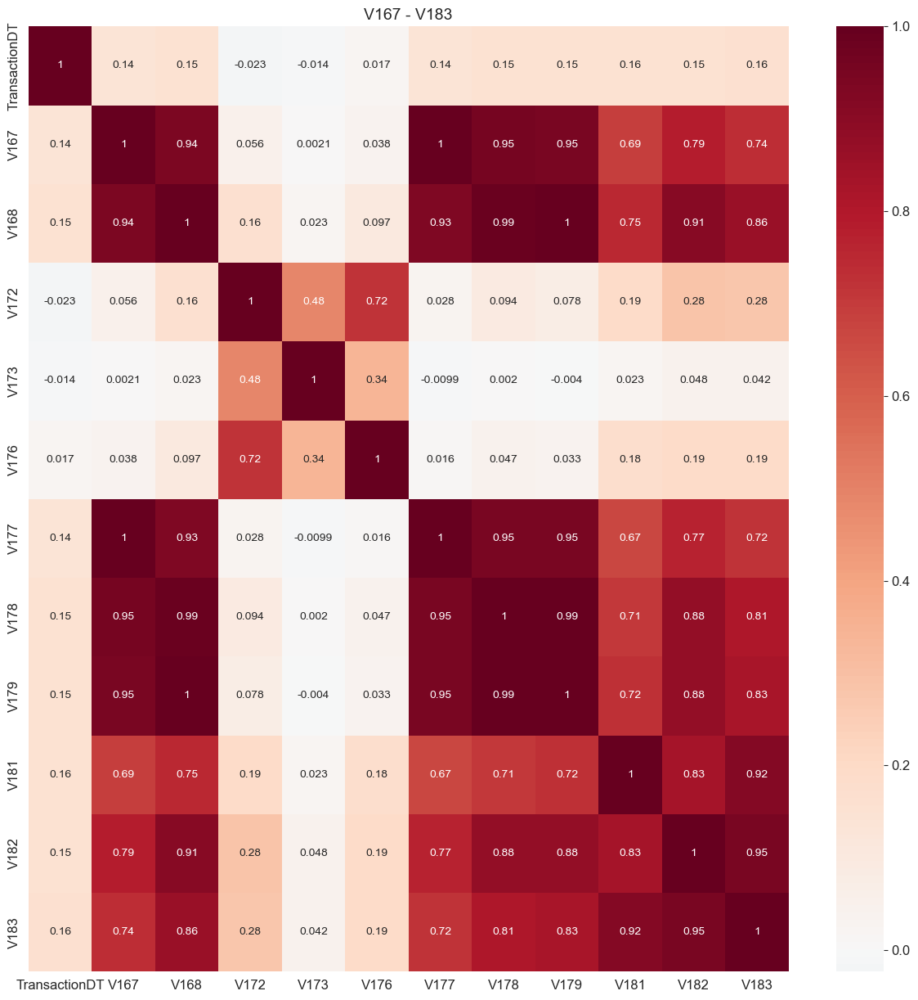

In [158]:
Vs = [x for x in nans_groups[450909] if int(x[1:])<186]
make_plots(Vs)
make_corr(Vs)

In [159]:
grps = [[167,168,177,178,179],[172,176],[173],[181,182,183]]
select_representative_features(grps)

Selected representative features: [178, 176, 173, 182]


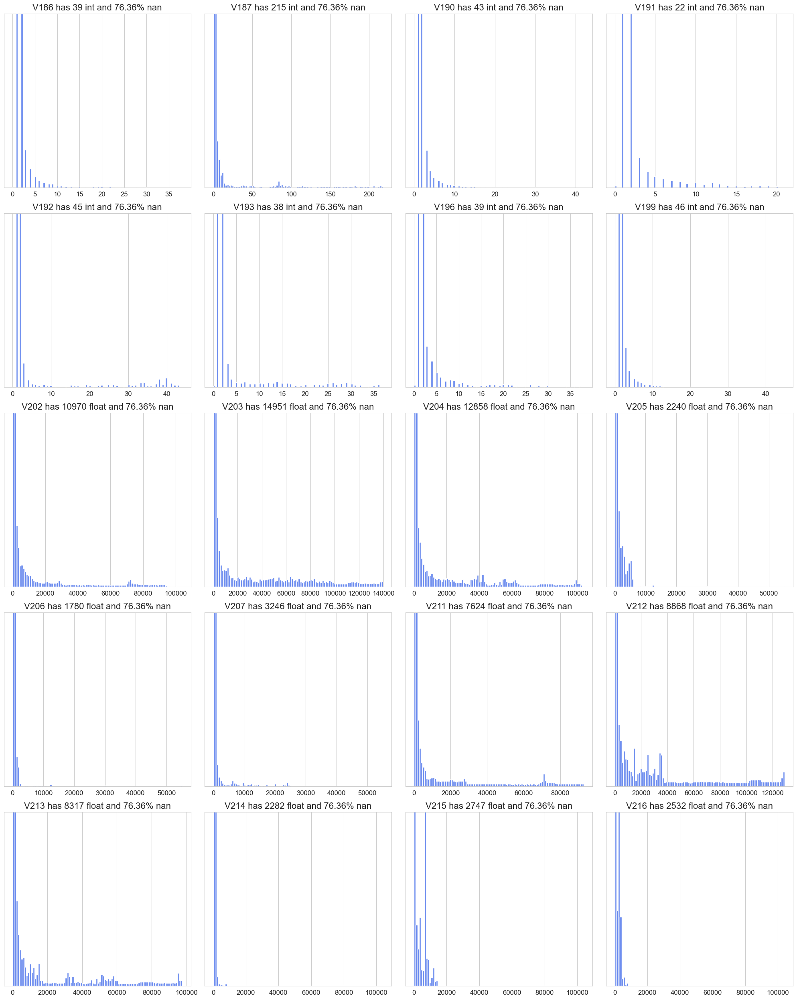

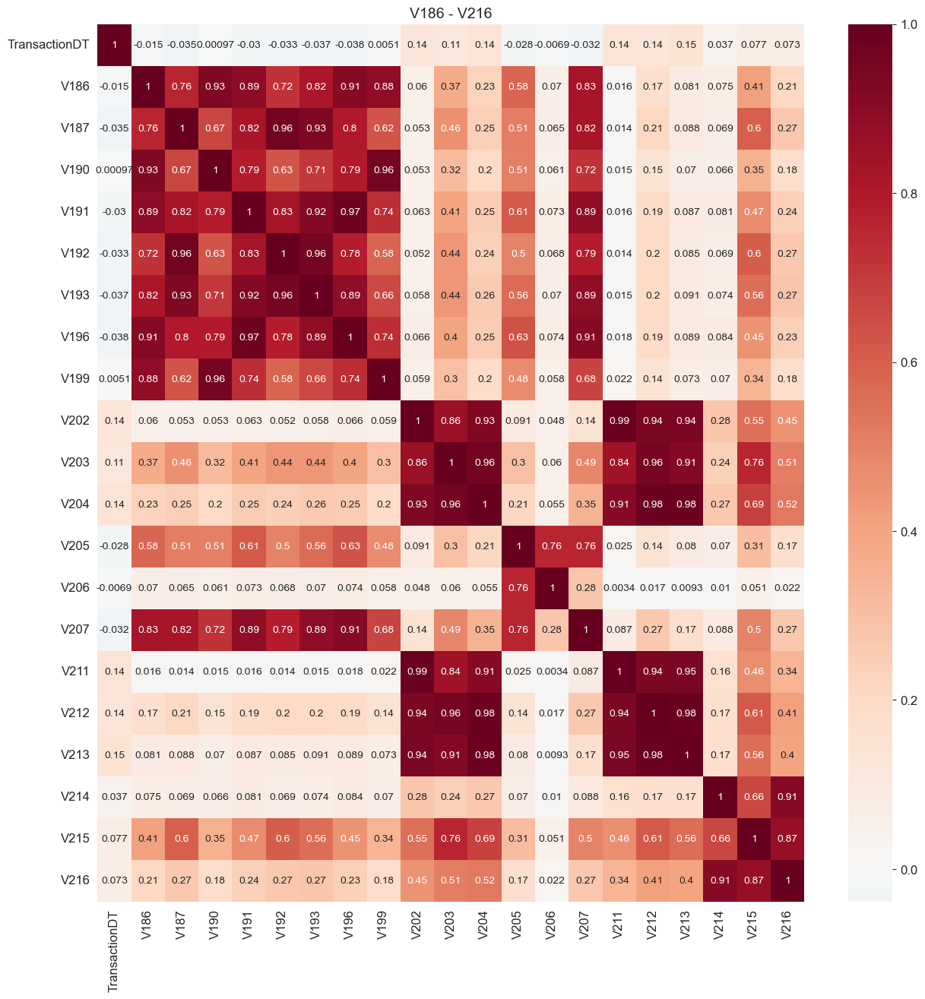

In [160]:
Vs = [x for x in nans_groups[450909] if (int(x[1:])>183)]
make_plots(Vs)
make_corr(Vs)

In [161]:
grps = [[186,187,190,191,192,193,196,199],[202,203,204,211,212,213],[205,206],[207],[214,215,216]]
select_representative_features(grps)

Selected representative features: [187, 203, 205, 207, 215]


### V169 ~ V210

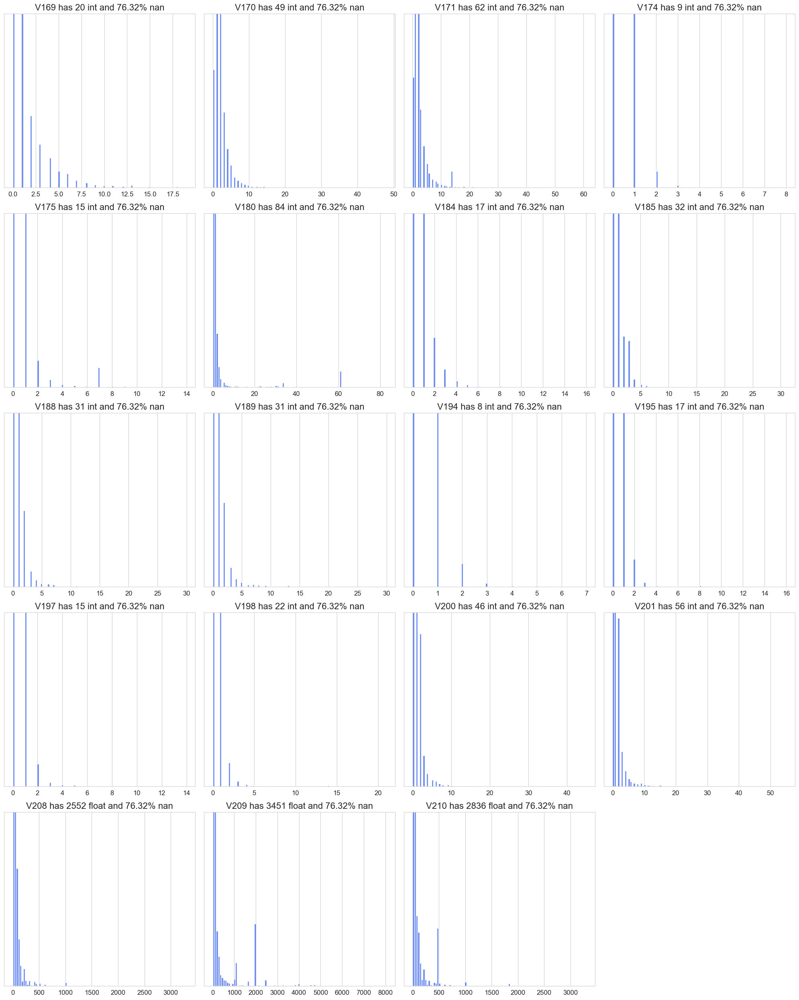

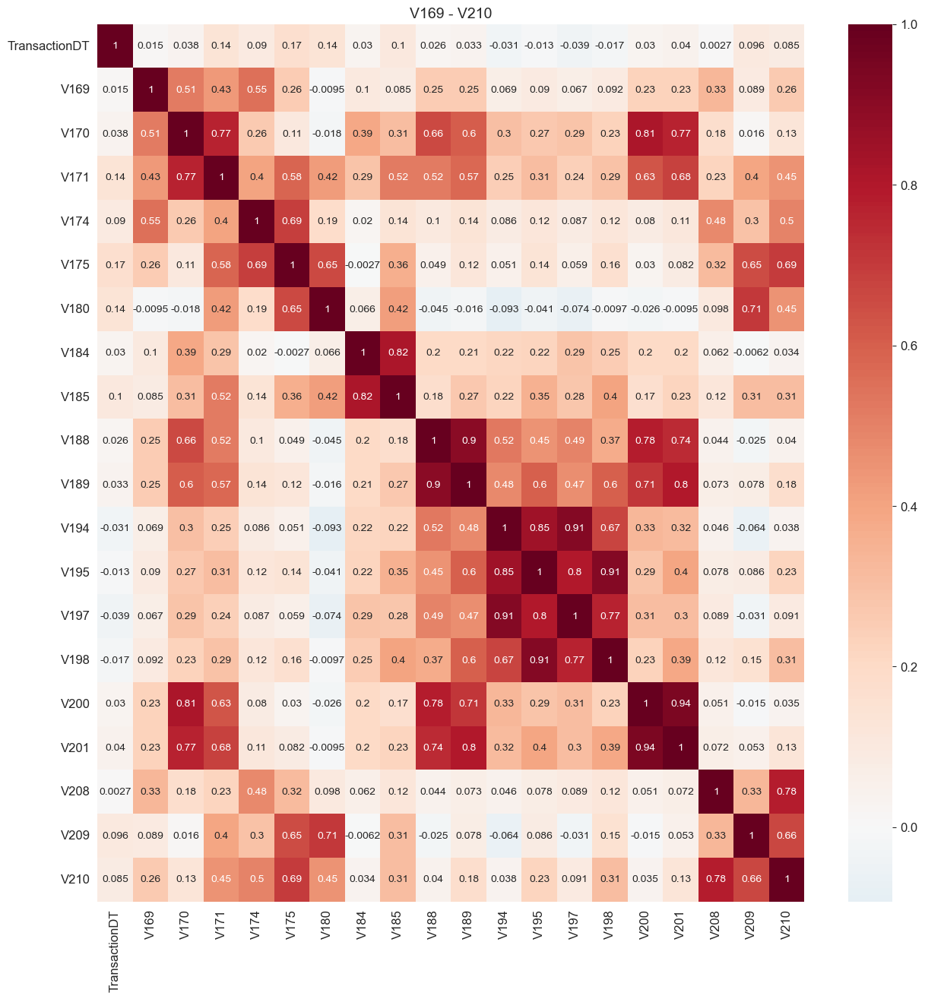

In [162]:
Vs = nans_groups[450721]
make_plots(Vs)
make_corr(Vs)

In [163]:
grps = [[169],[170,171,200,201],[174,175],[180],[184,185],[188,189],[194,195,197,198],[208,210],[209]]
select_representative_features(grps)

Selected representative features: [169, 171, 175, 180, 185, 188, 198, 210, 209]


### V217 ~ V278

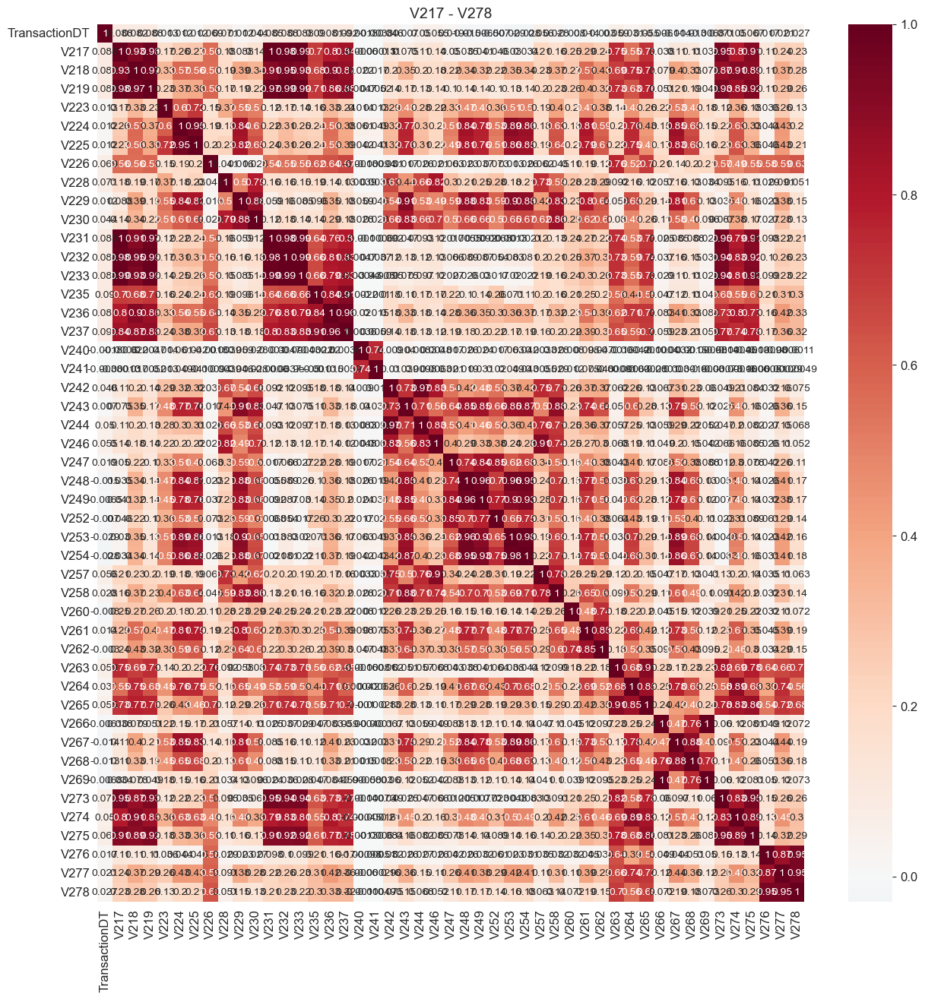

In [164]:
Vs = [x for x in nans_groups[460110]]
make_corr(Vs)

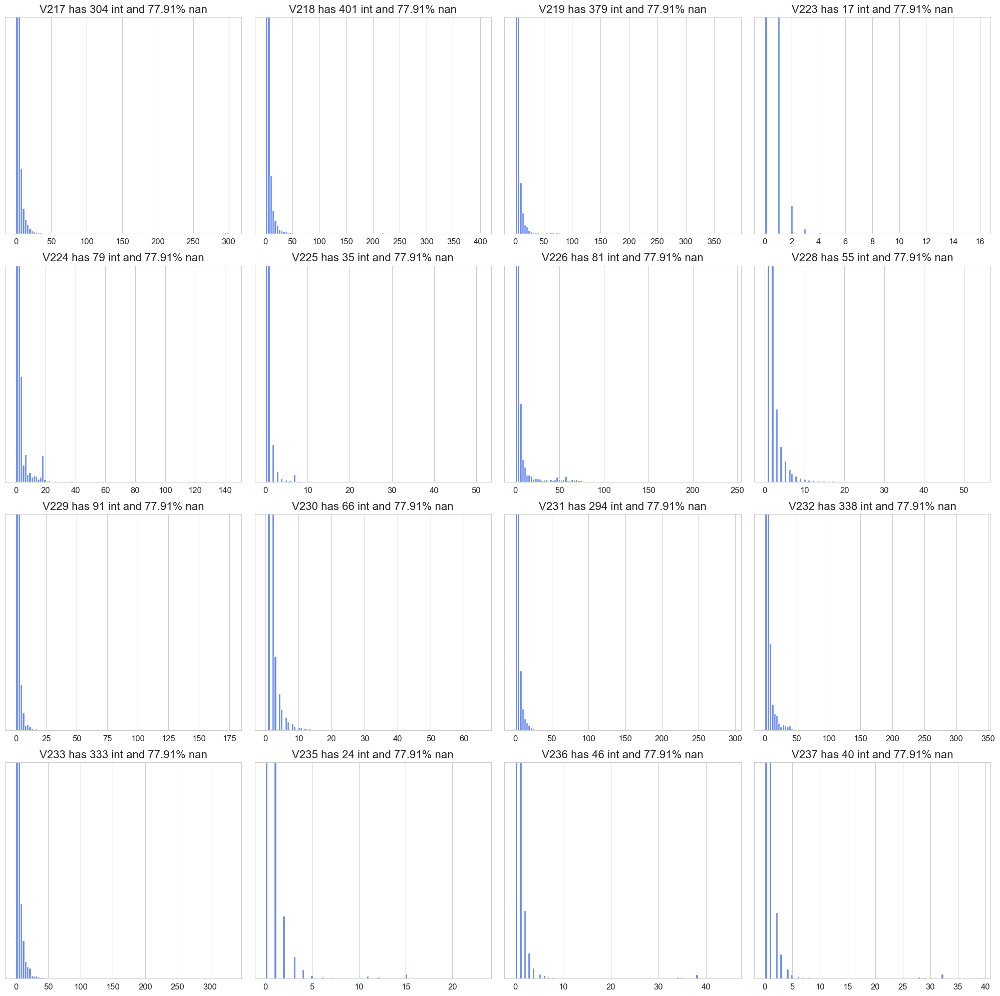

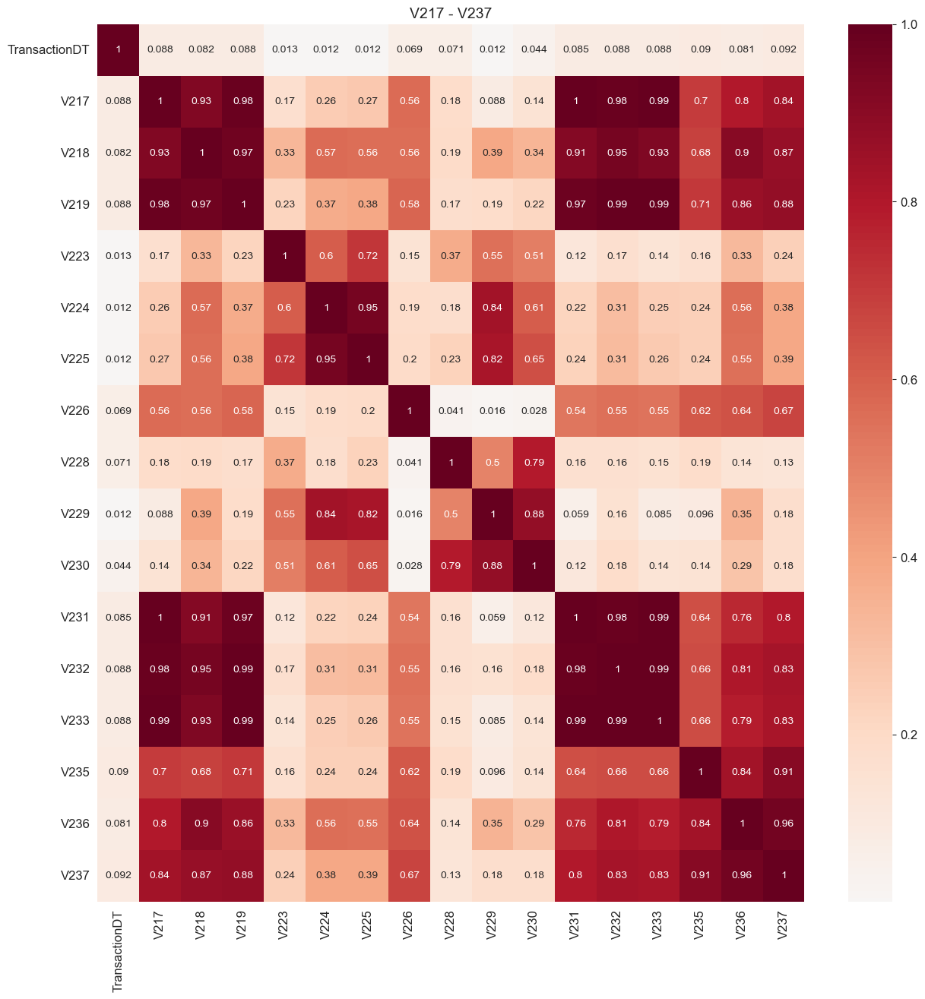

In [165]:
Vs = [x for x in nans_groups[460110] if int(x[1:])<240]
make_plots(Vs)
make_corr(Vs)

In [166]:
grps = [[217,218,219,231,232,233,236,237],[223],[224,225],[226],[228],[229,230],[235]]
select_representative_features(grps)

Selected representative features: [218, 223, 224, 226, 228, 229, 235]


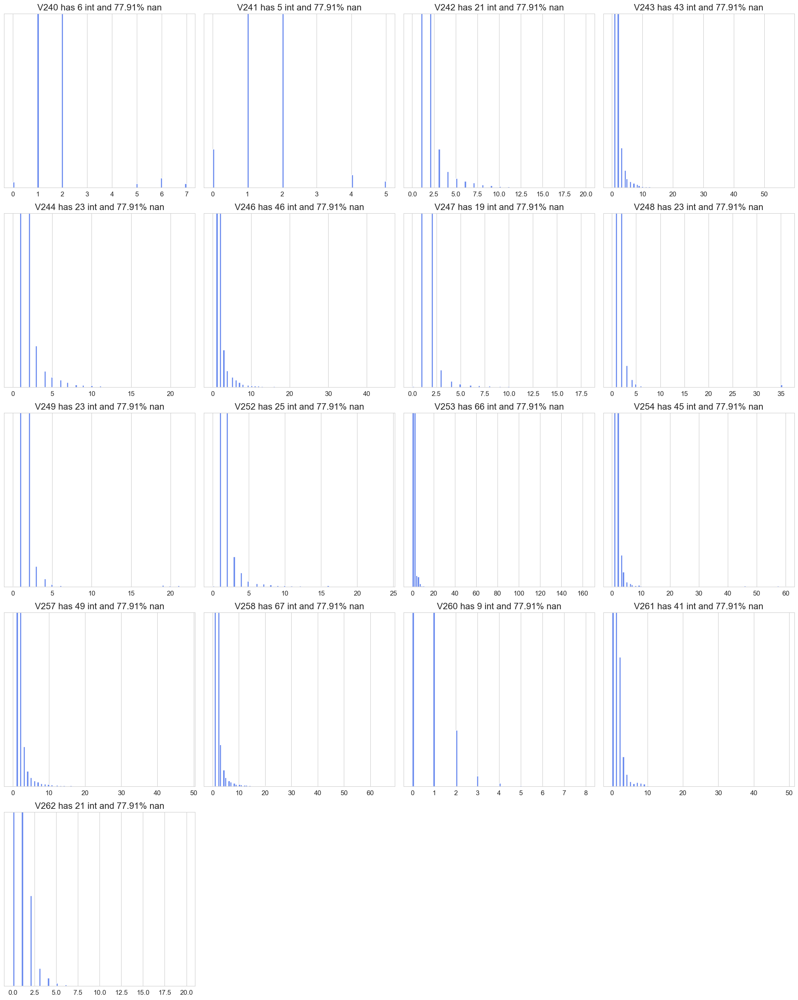

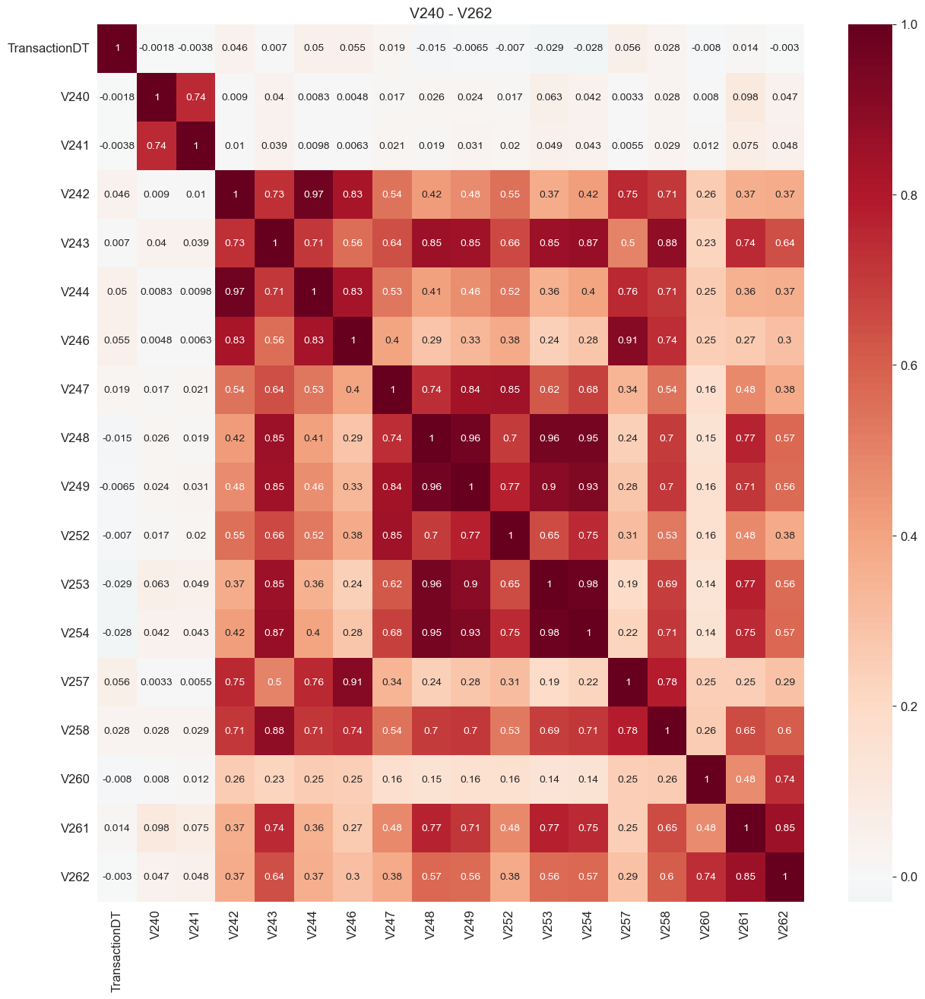

In [167]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>237)&(int(x[1:])<263)]
make_plots(Vs)
make_corr(Vs)

In [168]:
grps = [[240,241],[242,243,244,258],[246,257],[247,248,249,253,254],[252],[260],[261,262]]
select_representative_features(grps)

Selected representative features: [240, 258, 257, 253, 252, 260, 261]


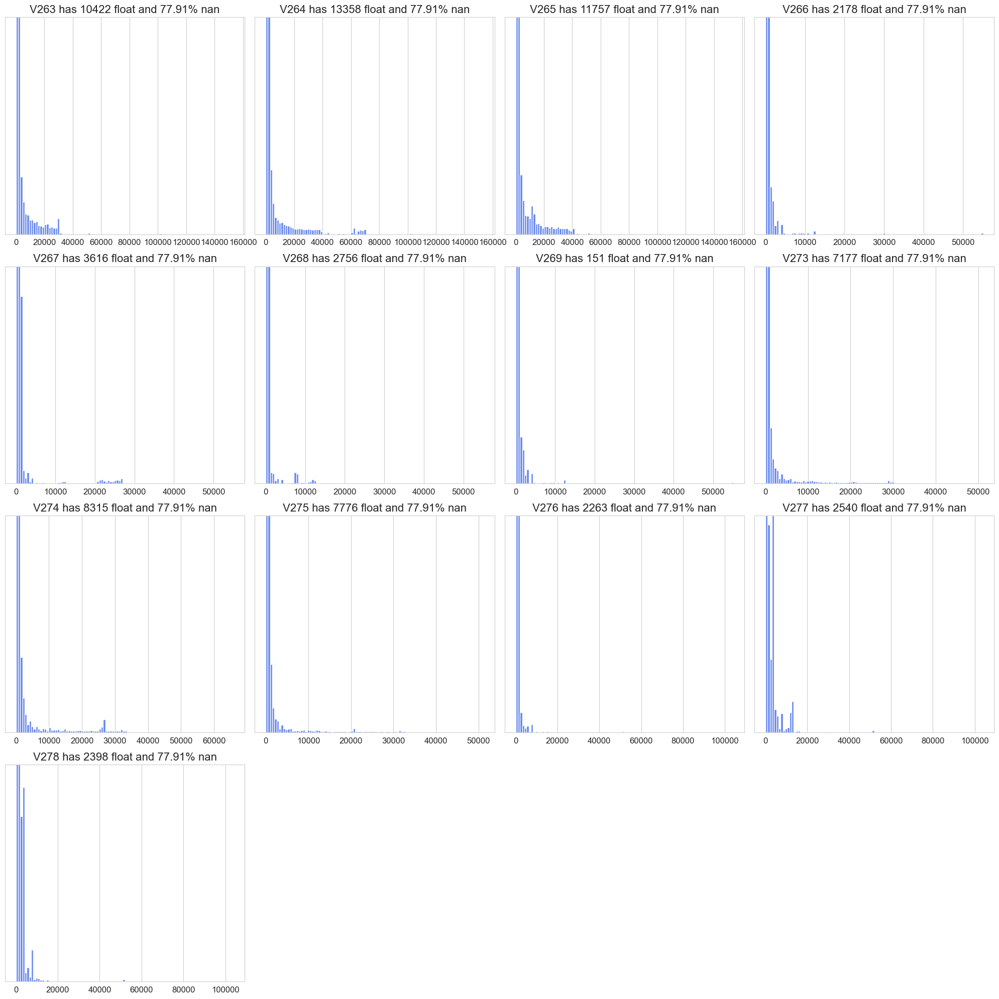

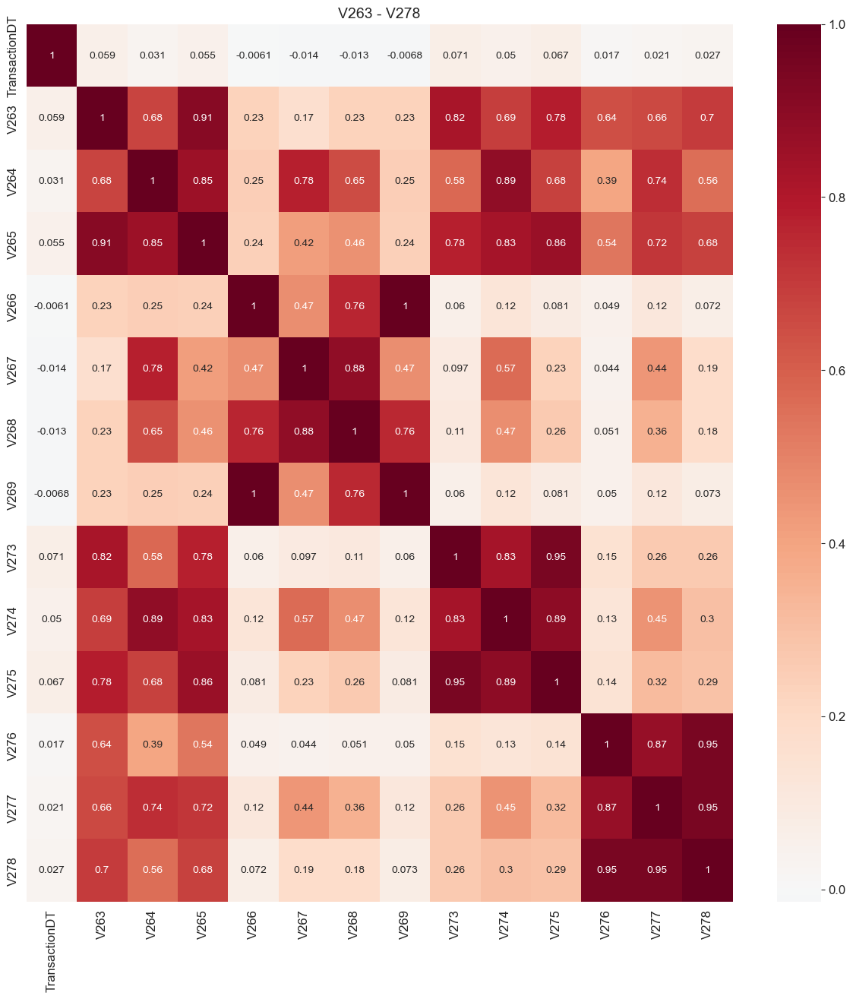

In [169]:
Vs = [x for x in nans_groups[460110] if (int(x[1:])>262)]
make_plots(Vs)
make_corr(Vs)

In [170]:
grps = [[263,265,264],[266,269],[267,268],[273,274,275],[276,277,278]]
select_representative_features(grps)

Selected representative features: [264, 266, 267, 274, 277]


### V220 ~ V272

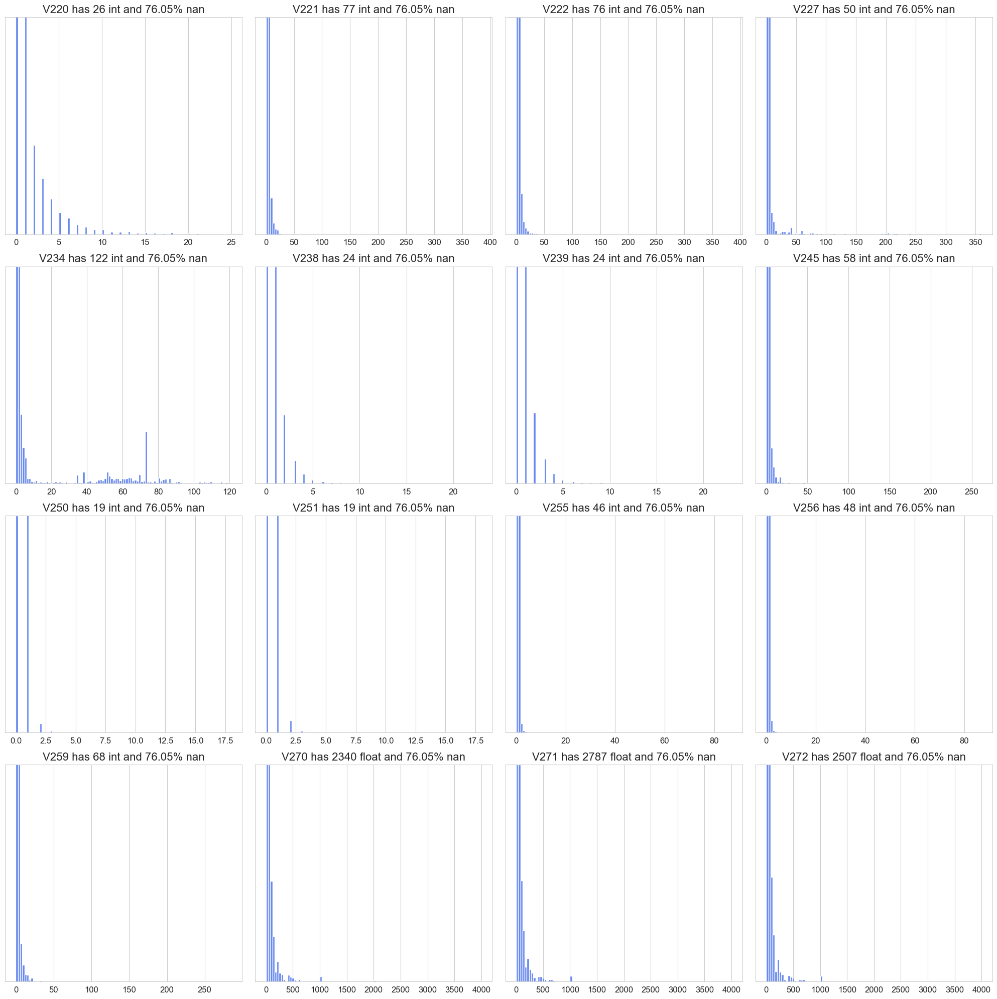

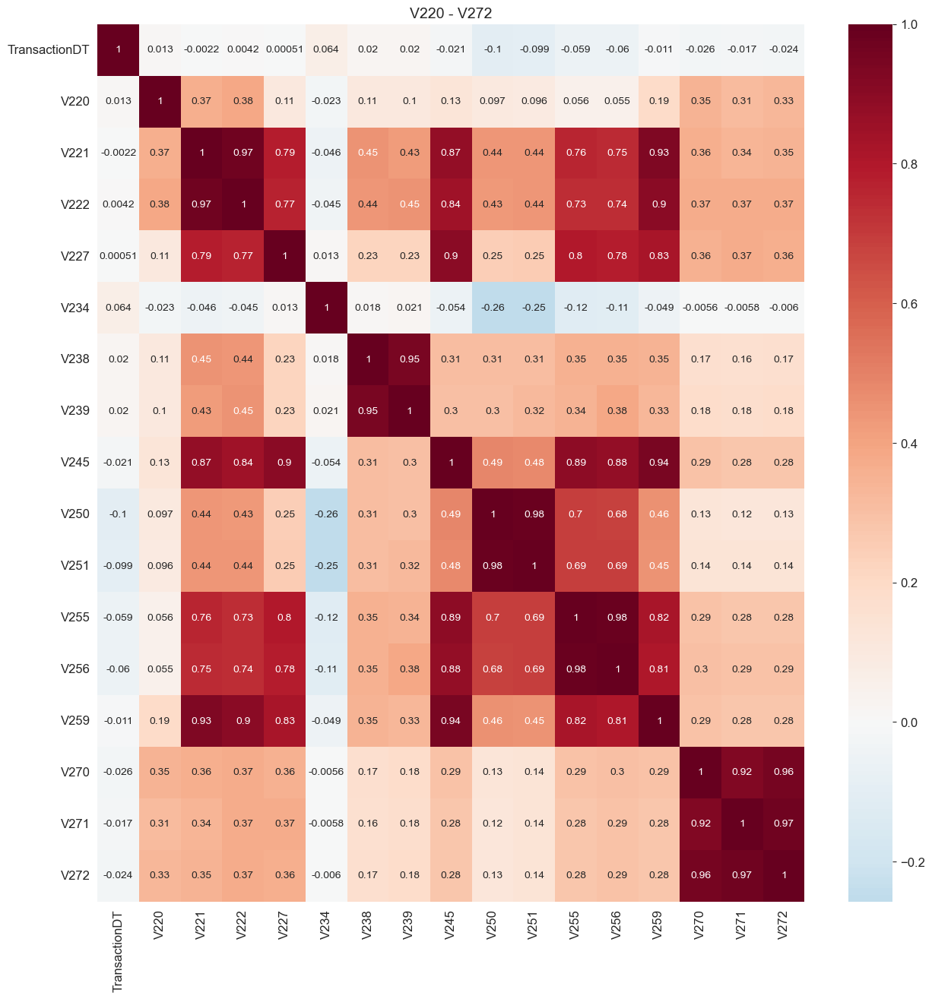

In [171]:
Vs = nans_groups[449124]
make_plots(Vs)
make_corr(Vs)

In [172]:
grps = [[220],[221,222,227,245,255,256,259],[234],[238,239],[250,251],[270,271,272]]
select_representative_features(grps)

Selected representative features: [220, 221, 234, 238, 250, 271]


### V279 ~ V321

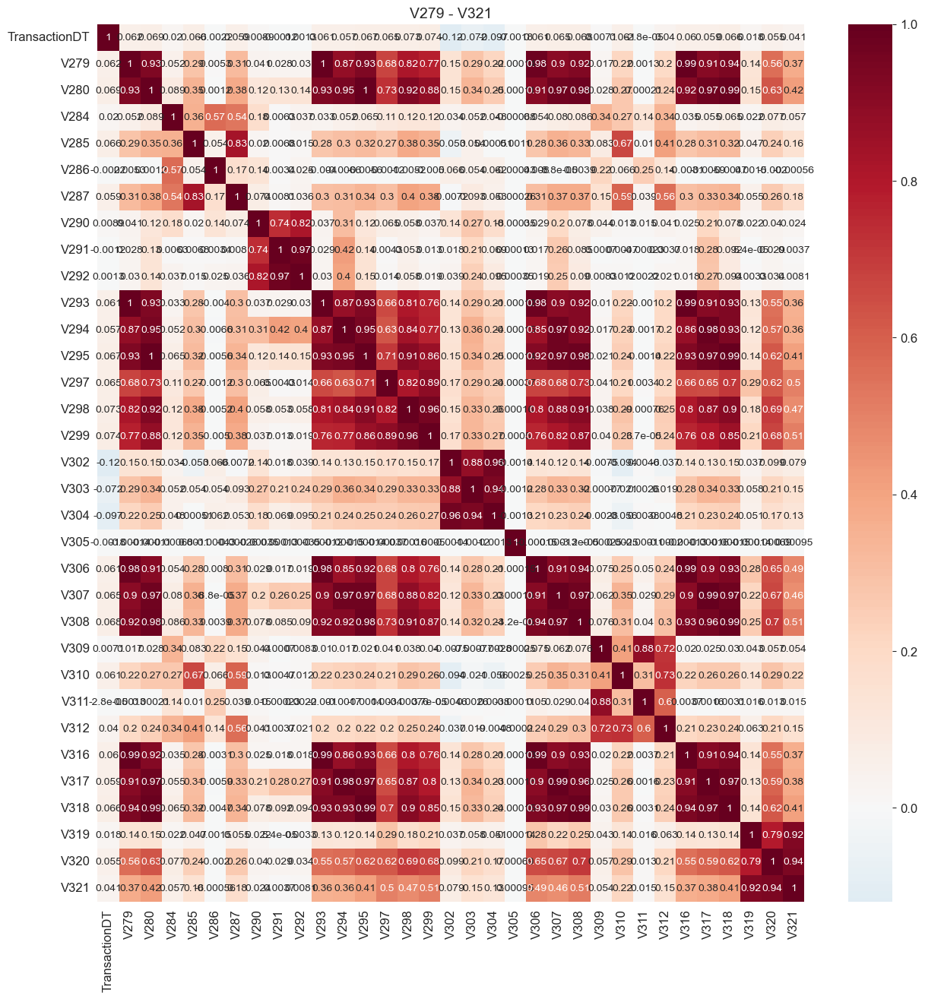

In [173]:
Vs = [x for x in nans_groups[12]]
make_corr(Vs)

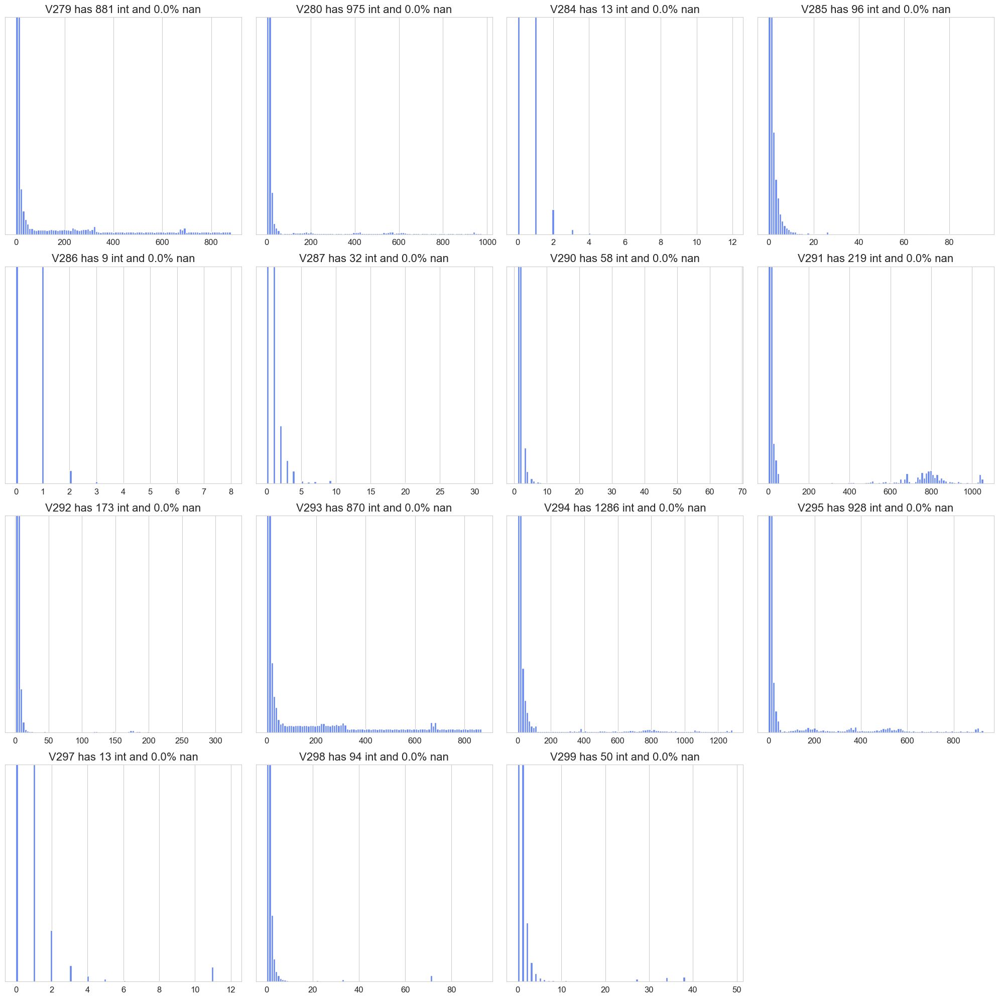

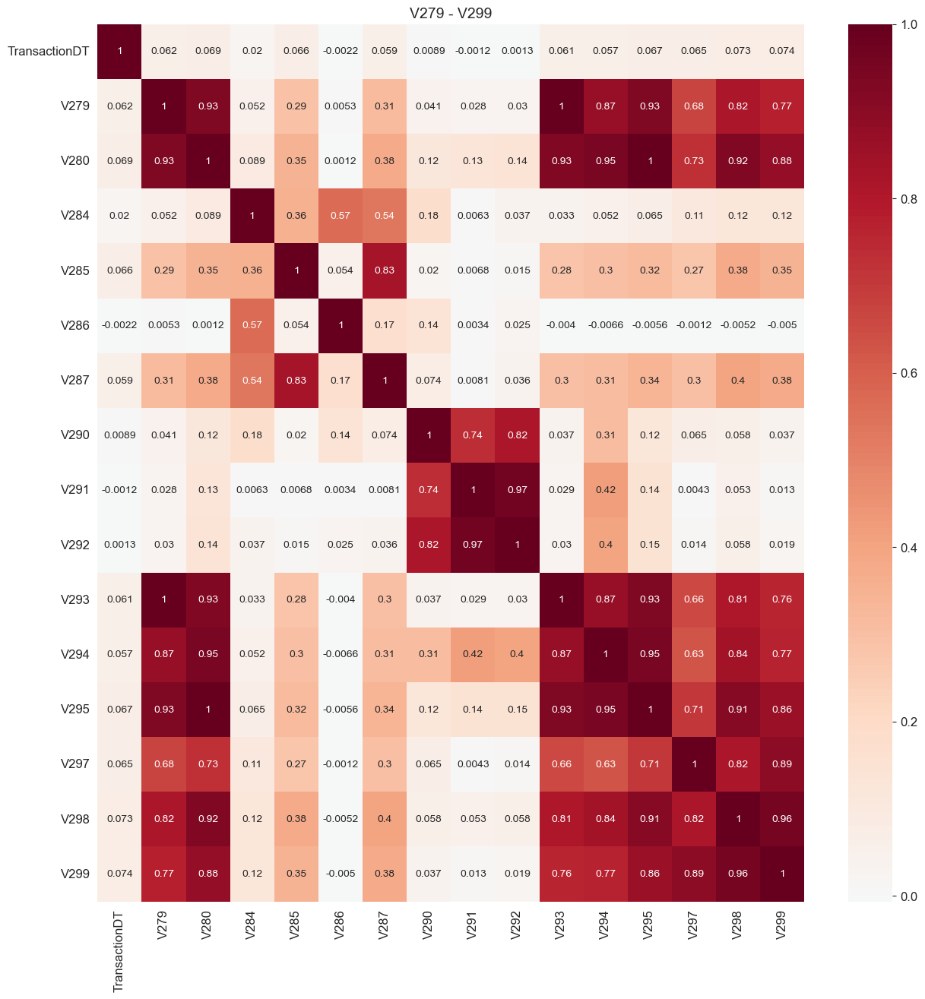

In [174]:
Vs = [x for x in nans_groups[12] if int(x[1:])<302]
make_plots(Vs)
make_corr(Vs)

In [175]:
grps = [[279,280,293,294,295,298,299],[284],[285,287],[286],[290,291,292],[297]]
select_representative_features(grps)

Selected representative features: [294, 284, 285, 286, 291, 297]


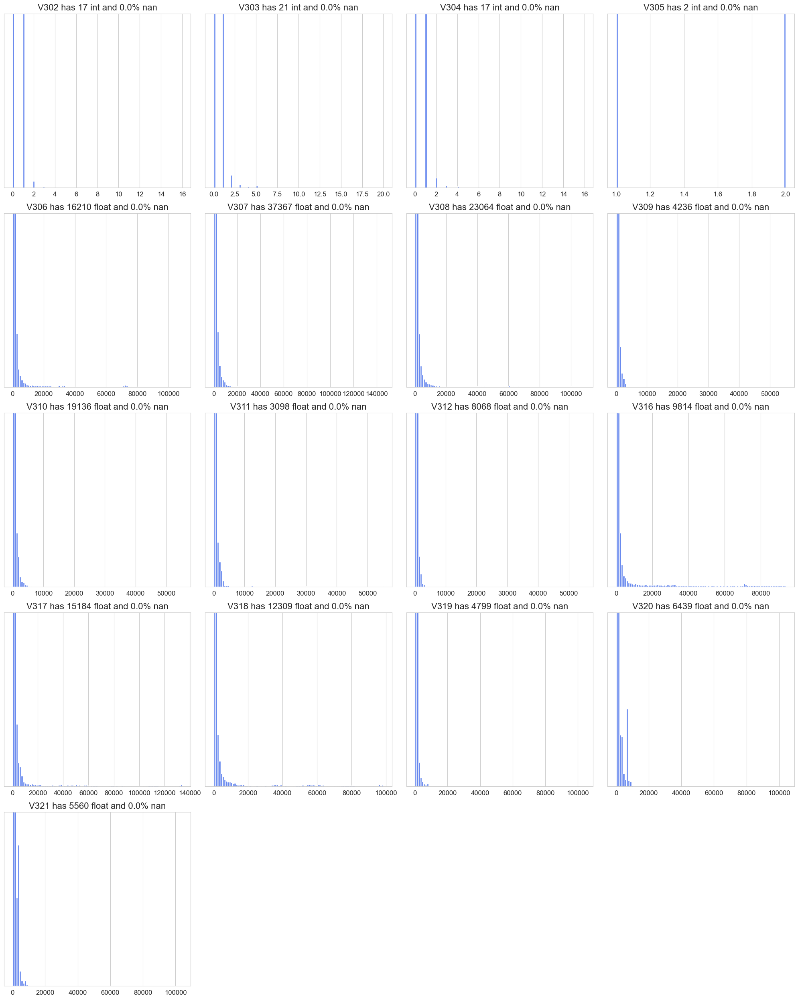

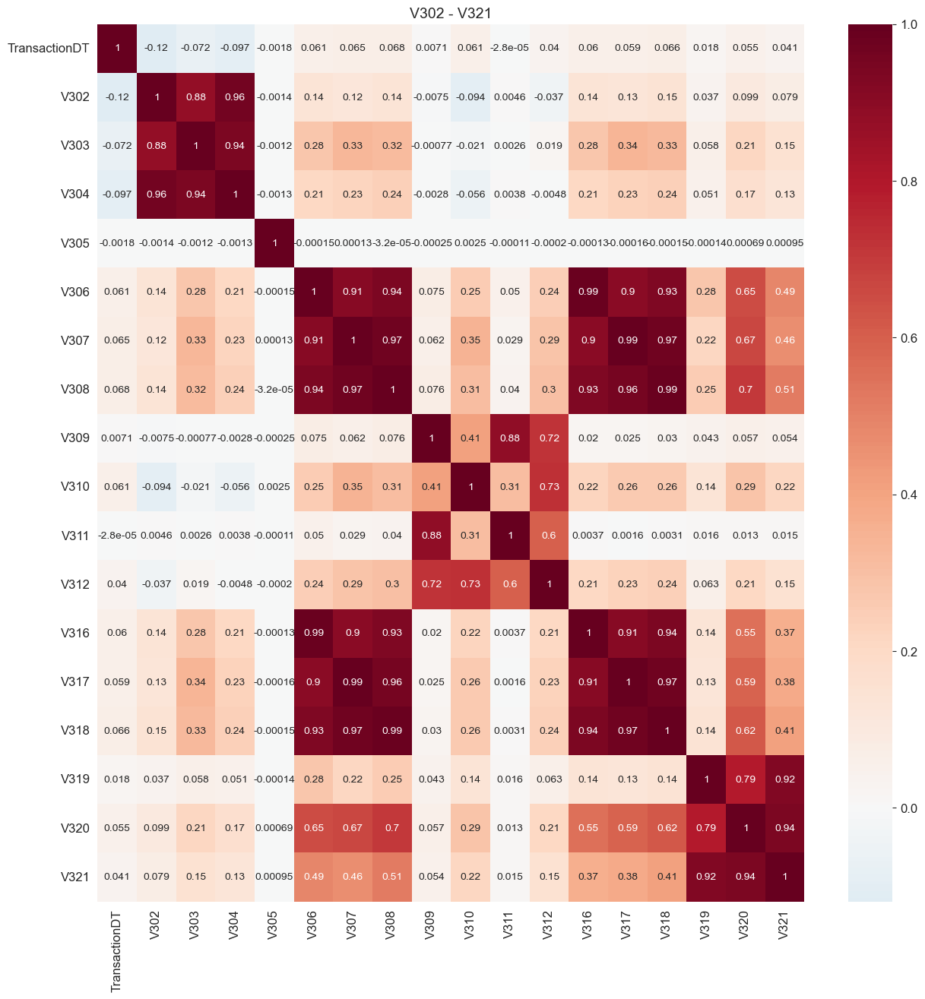

In [176]:
Vs = [x for x in nans_groups[12] if int(x[1:])>299]
make_plots(Vs)
make_corr(Vs)

In [177]:
grps = [[302,303,304],[305],[306,307,308,316,317,318],[309,311],[310,312],[319,320,321]]
select_representative_features(grps)

Selected representative features: [303, 305, 307, 309, 310, 320]


### V281 ~ V315, D1

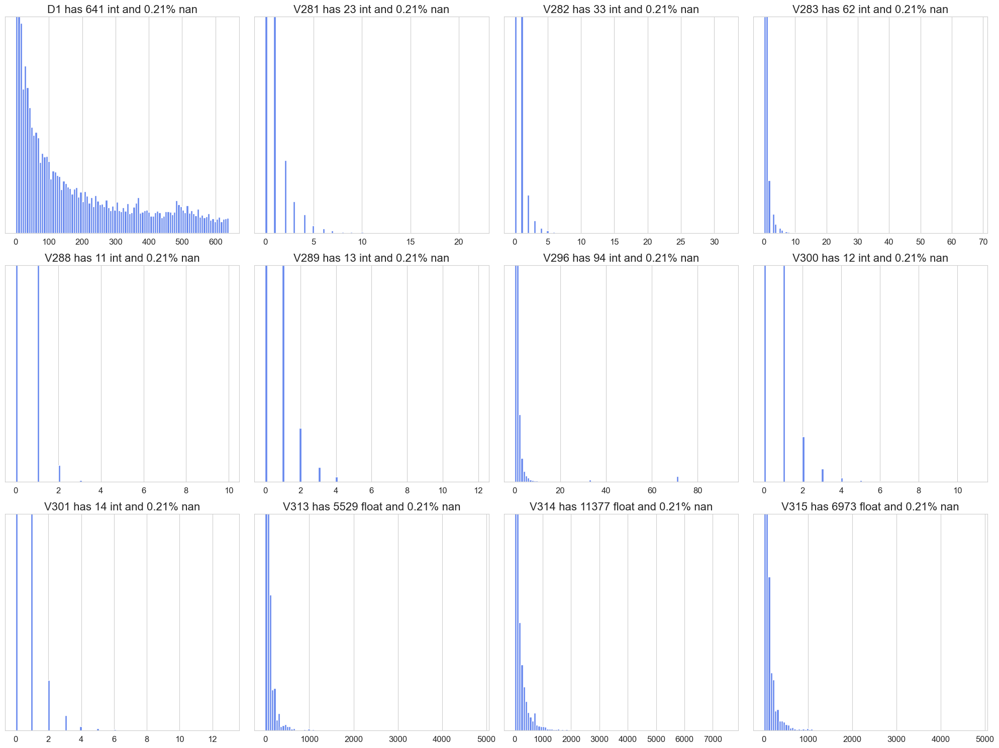

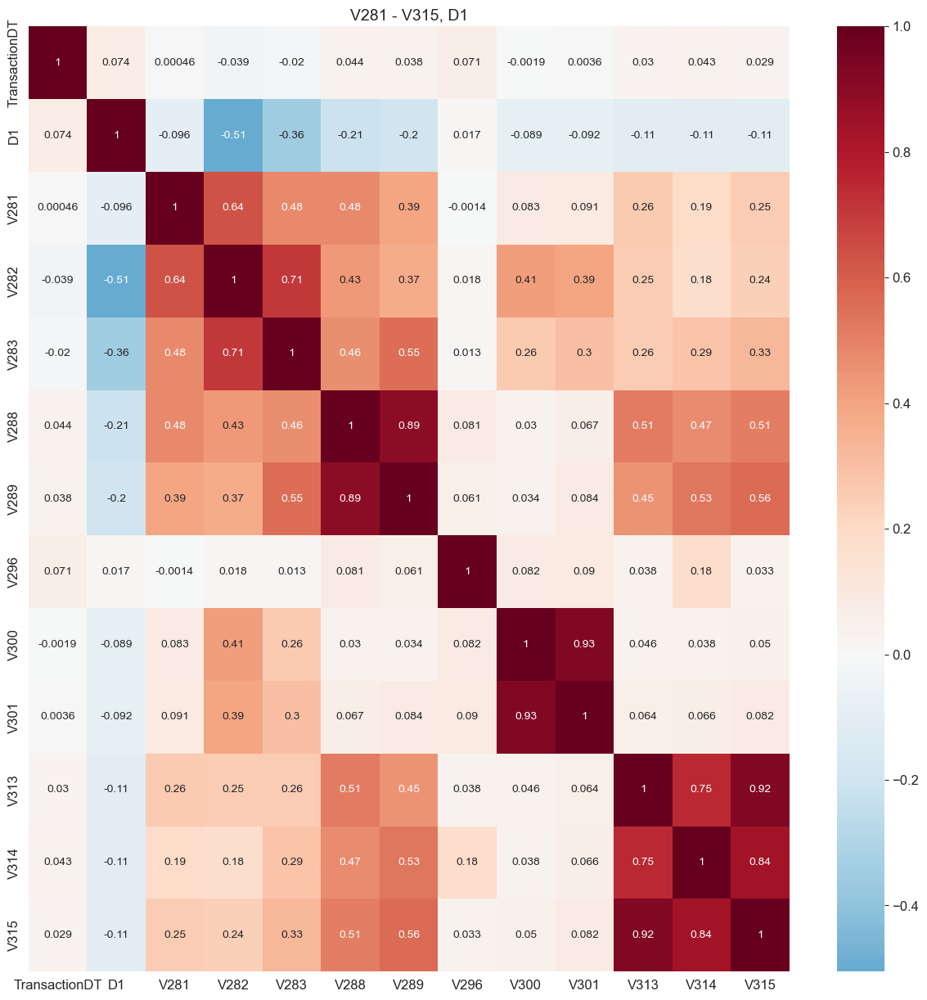

In [178]:
Vs = nans_groups[1269]
make_plots(Vs)
Vtitle = 'V281 - V315, D1'
make_corr(Vs,Vtitle)

In [179]:
grps = [[281],[282,283],[288,289],[296],[300,301],[313,314,315]]
select_representative_features(grps)

Selected representative features: [281, 283, 289, 296, 301, 314]


### V322 - V339

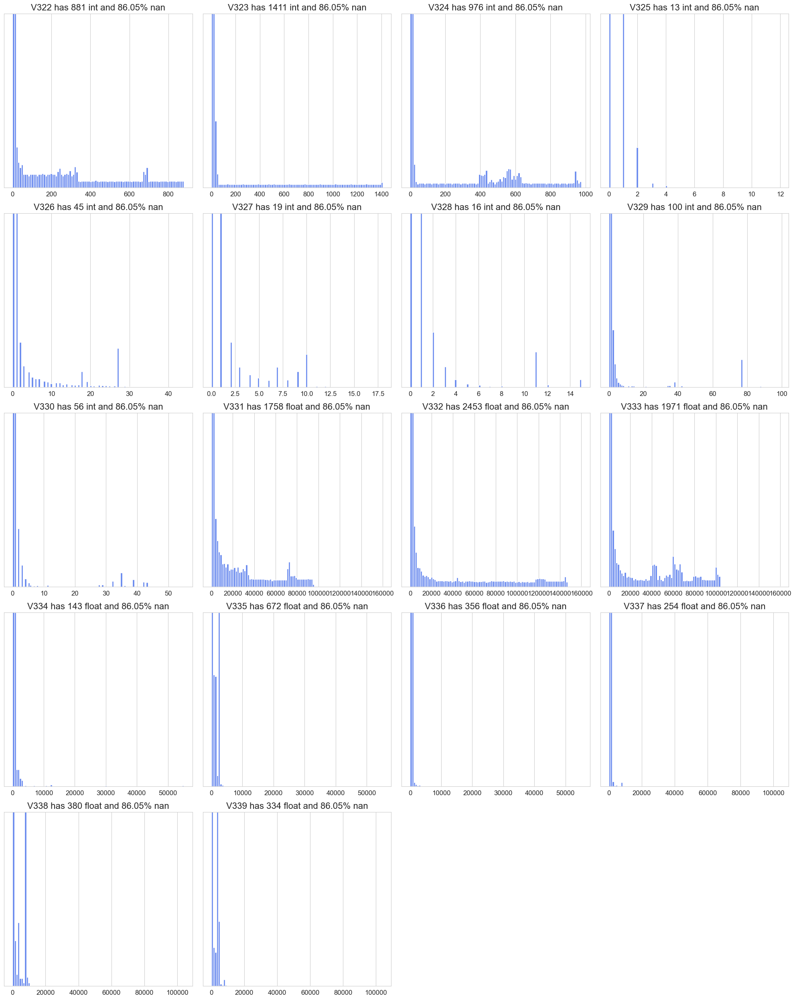

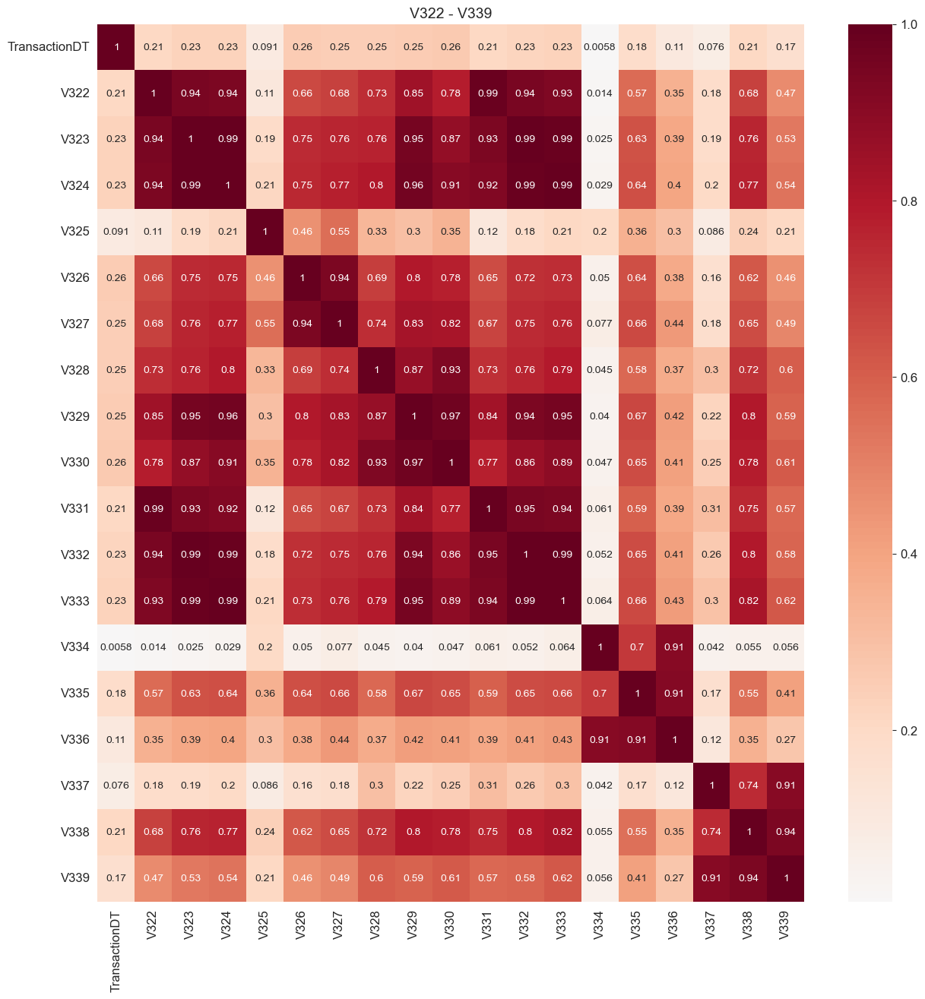

In [180]:
Vs = nans_groups[508189]
make_plots(Vs)
make_corr(Vs)

In [181]:
grps = [[322,323,324,326,327,328,329,330,331,332,333],[325],[334,335,336],[337,338,339]]
select_representative_features(grps)

Selected representative features: [332, 325, 335, 338]


### V Reduced

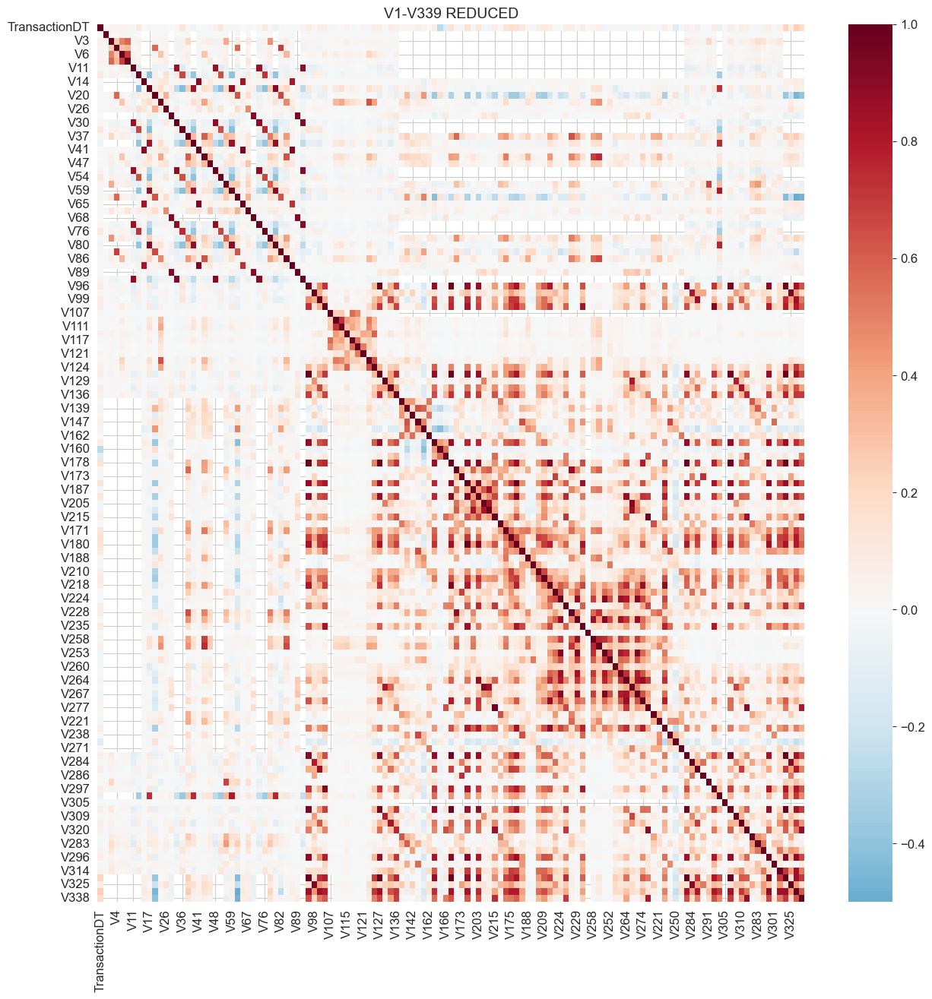

In [182]:
v =  [1, 3, 4, 6, 8, 11]
v += [13, 14, 17, 20, 23, 26, 27, 30]
v += [36, 37, 40, 41, 44, 47, 48]
v += [54, 56, 59, 62, 65, 67, 68, 70]
v += [76, 78, 80, 82, 86, 88, 89, 91]
v += [96, 98, 99, 104]
v += [107, 108, 111, 115, 117, 120, 121, 123]
v += [124, 127, 129, 130, 136]
v += [138, 139, 142, 147, 156, 162]
v += [165, 160, 166]
v += [178, 176, 173, 182]
v += [187, 203, 205, 207, 215]
v += [169, 171, 175, 180, 185, 188, 198, 210, 209]
v += [218, 223, 224, 226, 228, 229, 235]
v += [240, 258, 257, 253, 252, 260, 261]
v += [264, 266, 267, 274, 277]
v += [220, 221, 234, 238, 250, 271]
v += [294, 284, 285, 286, 291, 297]
v += [303, 305, 307, 309, 310, 320]
v += [281, 283, 289, 296, 301, 314]
v += [332, 325, 335, 338]

cols = ['TransactionDT'] + ['V'+str(x) for x in v]
train2 = train_df[cols].sample(frac=0.2)
plt.figure(figsize=(15,15))
sns.heatmap(train2[cols].corr(), cmap='RdBu_r', annot=False, center=0.0)
plt.title('V1-V339 REDUCED',fontsize=14)
plt.show()

## Id columns

In [183]:
id_columns = [col for col in train_df.columns if col.startswith("id")]

# Count unique values in each id column
unique_counts = train_df[id_columns].nunique().sort_values()
print(unique_counts)
categorical_ids = [col for col in id_columns if train_df[col].nunique() < 20]

id_38         2
id_27         2
id_37         2
id_28         2
id_16         2
id_29         2
id_12         2
id_35         2
id_36         2
id_15         3
id_23         3
id_34         4
id_32         4
id_24        12
id_04        15
id_18        18
id_03        24
id_22        25
id_14        25
id_09        46
id_13        54
id_10        62
id_30        75
id_01        77
id_07        84
id_05        93
id_08        94
id_26        95
id_06       101
id_17       104
id_31       130
id_33       260
id_25       341
id_11       365
id_20       394
id_21       490
id_19       522
id_02    115655
dtype: int64


In [184]:
n=0
for col in id_columns:
    n+=1
    print(f"--{n}--")
    print(f"Column: {col}")
    print(f"Data Type: {train_df[col].dtype}\n")

--1--
Column: id_01
Data Type: float64

--2--
Column: id_02
Data Type: float64

--3--
Column: id_03
Data Type: float64

--4--
Column: id_04
Data Type: float64

--5--
Column: id_05
Data Type: float64

--6--
Column: id_06
Data Type: float64

--7--
Column: id_07
Data Type: float64

--8--
Column: id_08
Data Type: float64

--9--
Column: id_09
Data Type: float64

--10--
Column: id_10
Data Type: float64

--11--
Column: id_11
Data Type: float64

--12--
Column: id_12
Data Type: object

--13--
Column: id_13
Data Type: float64

--14--
Column: id_14
Data Type: float64

--15--
Column: id_15
Data Type: object

--16--
Column: id_16
Data Type: object

--17--
Column: id_17
Data Type: float64

--18--
Column: id_18
Data Type: float64

--19--
Column: id_19
Data Type: float64

--20--
Column: id_20
Data Type: float64

--21--
Column: id_21
Data Type: float64

--22--
Column: id_22
Data Type: float64

--23--
Column: id_23
Data Type: object

--24--
Column: id_24
Data Type: float64

--25--
Column: id_25
Data Typ

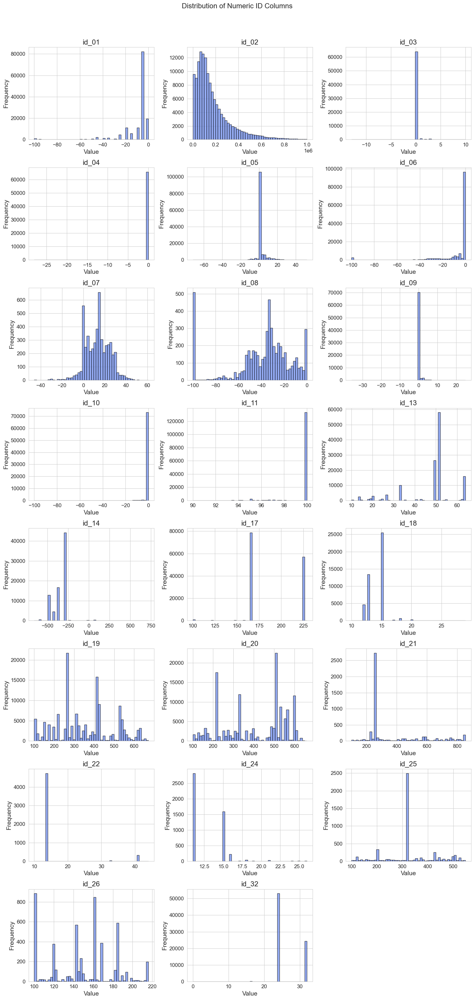

In [185]:
numeric_id_columns = [col for col in id_columns if train_df[col].dtype in ['int64', 'float64']]

num_cols = 3  
num_rows = int(np.ceil(len(numeric_id_columns) / num_cols)) 

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))  
fig.suptitle("Distribution of Numeric ID Columns", fontsize=16)
axes = axes.flatten()

for i, col in enumerate(numeric_id_columns):
    axes[i].hist(train_df[col].dropna(), bins=50, edgecolor='k', alpha=0.7)
    axes[i].set_title(col)
    axes[i].set_xlabel("Value")
    axes[i].set_ylabel("Frequency")

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()

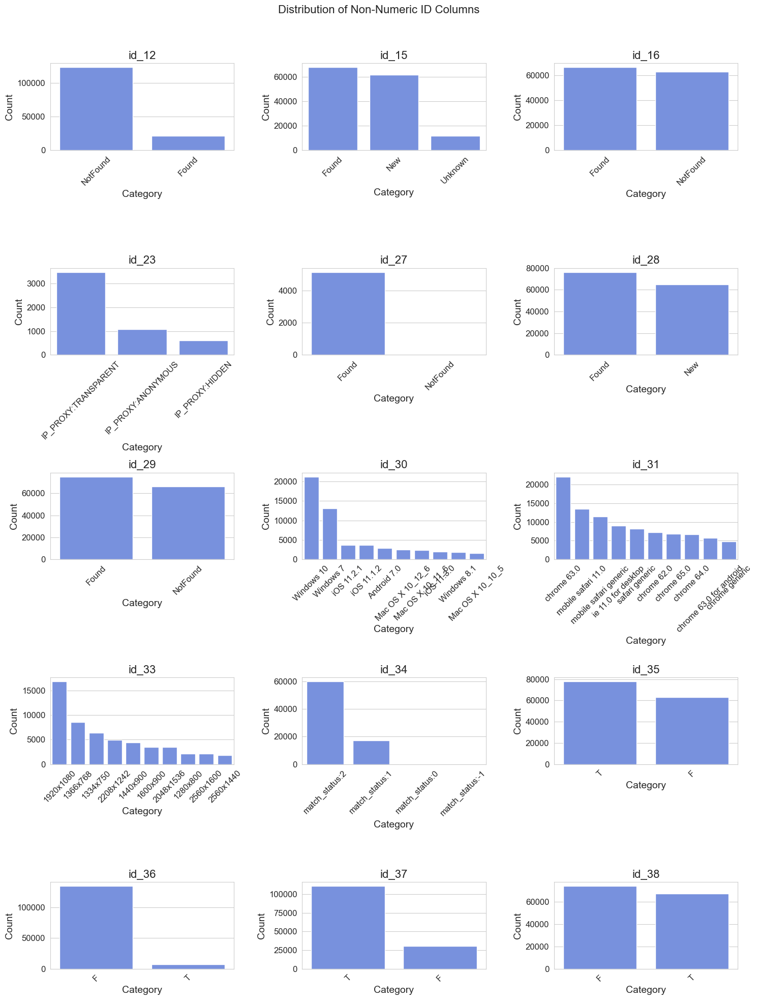

In [186]:
non_numeric_id_columns = [col for col in id_columns if train_df[col].dtype == 'object']

num_cols = 3  
num_rows = int(np.ceil(len(non_numeric_id_columns) / num_cols))  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4))  
fig.suptitle("Distribution of Non-Numeric ID Columns", fontsize=16)

axes = axes.flatten()

for i, col in enumerate(non_numeric_id_columns):
    sns.countplot(data=train_df, x=col, ax=axes[i], order=train_df[col].value_counts().index[:10])
    axes[i].set_title(col)
    axes[i].set_xlabel("Category")
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels for better readability

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0, 1, 0.96])   
plt.show()

**Categorical features, might need frequency Encoding**

- cat_id = ["id_12", "id_15", "id_16", "id_23", "id_27", "id_28","id_29", "id_30", "id_31", "id_33", "id_34"]

    
**Binary Features**
- binary_id = ["id_35", "id_36", "id_37", "id_38"]

    
**Numerical Values (Potential Score Variables)**
- We might create **user interaction variables** (e.g., mean, standard deviation) for the following:
- num_id = ["id_01", "id_02", "id_03", "id_04", "id_05", "id_06", "id_07", "id_08", "id_09", "id_10", "id_11", "id_13", "id_17", "id_18", "id_19", "id_20", "id_21", "id_22","id_24", "id_25", "id_26", "id_32"]
 


## Card columns

In [187]:
card_columns = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']

for col in card_columns:
    print(f"{col} - Unique Values: {train_df[col].nunique()}")

card1 - Unique Values: 13553
card2 - Unique Values: 500
card3 - Unique Values: 114
card4 - Unique Values: 4
card5 - Unique Values: 119
card6 - Unique Values: 4


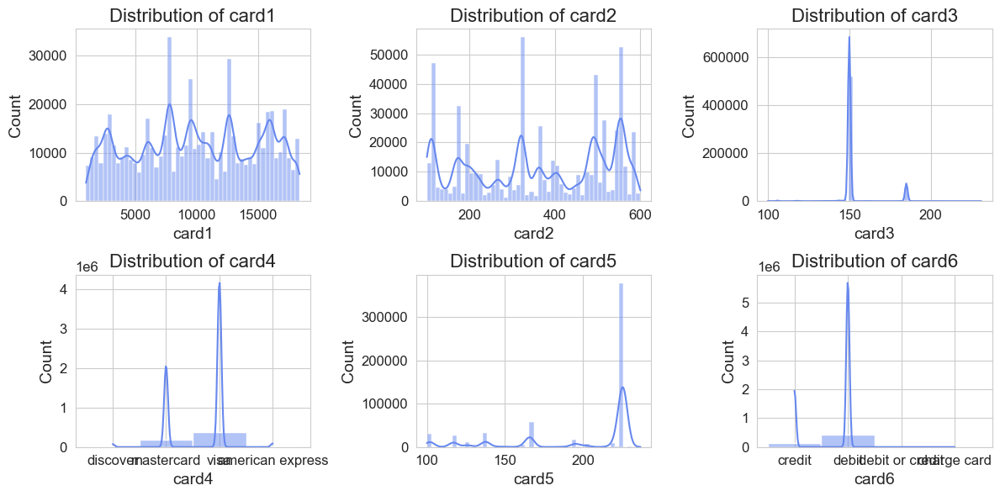

In [188]:
# Plot histograms for numerical card features
for i, col in enumerate(card_columns[:6]): 
    plt.subplot(2, 3, i+1)
    sns.histplot(train_df[col].dropna(), bins=50, kde=True)
    plt.title(f"Distribution of {col}")

plt.tight_layout()
plt.show()

In [189]:
for i in card_columns:
    print(f'---{i}---')
    card_fraud_rate = train_df.groupby(i)['isFraud'].mean()
    print(card_fraud_rate.sort_values(ascending=False).head(10))

---card1---
card1
10320    1.0
14671    1.0
8185     1.0
11292    1.0
15042    1.0
11228    1.0
4895     1.0
15053    1.0
4817     1.0
4788     1.0
Name: isFraud, dtype: float64
---card2---
card2
289.0    0.406780
405.0    0.403509
319.0    0.390000
176.0    0.360624
482.0    0.327381
407.0    0.303571
311.0    0.280277
104.0    0.248011
324.0    0.241692
177.0    0.241169
Name: isFraud, dtype: float64
---card3---
card3
139.0    1.000000
160.0    1.000000
224.0    1.000000
175.0    1.000000
181.0    1.000000
132.0    1.000000
206.0    1.000000
125.0    1.000000
208.0    0.500000
191.0    0.388889
Name: isFraud, dtype: float64
---card4---
card4
discover            0.077282
visa                0.034756
mastercard          0.034331
american express    0.028698
Name: isFraud, dtype: float64
---card5---
card5
167.0    1.000000
191.0    0.500000
107.0    0.333333
139.0    0.230769
137.0    0.147184
212.0    0.119048
147.0    0.112710
141.0    0.093842
143.0    0.093023
223.0    0.088675
Name

Card1: Might be a Hashed Identifier
- A single card1 linked to multiple addresses and emails might indicate stolen or resold cards.
  - card1_addr1 → Frequency Encoding
  - card1_addr1_P_emaildomain → Frequency Encoding

- Sudden changes in transaction amount can signal fraudulent activity.
  - TransactionAmt_card1_mean
  - TransactionAmt_card1_std
  - TransactionAmt_card1_addr1_mean
  - TransactionAmt_card1_addr1_std
  - TransactionAmt_card1_addr1_P_emaildomain_mean
  - TransactionAmt_card1_addr1_P_emaildomain_std

- Fraudsters often use stolen cards quickly before they get blocked.
  - D9_card1_mean, D9_card1_std
  - D9_card1_addr1_mean, D9_card1_addr1_std
  - D9_card1_addr1_P_emaildomain_mean, D9_card1_addr1_P_emaildomain_std
  - D11_card1_mean, D11_card1_std
  - D11_card1_addr1_mean, D11_card1_addr1_std
  - D11_card1_addr1_P_emaildomain_mean, D11_card1_addr1_P_emaildomain_std

Card2: Might be the Identification Number of the Card
- Pretty similar to card1 information, so use:
  - Frequency Encoding

Card3: Might be the CVV (Card Verification Value)
- Encoding techniques:
  - Target Encoding
  - Frequency Encoding

Card4: Might be the Card Type
- One-Hot Encoding

Card5: Might be the Bank Identification Number (BIN)
- Target Encoding

Card6: Might be the Card Type (Credit/Debit/Prepaid)
- One-Hot Encoding


# Feature Engineering

## Engineer ProductCD feature to capture time-dependent properties

From the EDA plots, we can see:
1. Some categories, such as Product H & R, show sharp peaks in fraud at specific times (e.g., certain hours or days), which suggests that fraud is not evenly distributed across time.
2. If fraud behavior is time-sensitive, we might need time-based features like DT_W, DT_M, or other rolling averages to capture this behavior.

Therefore, instead of using simple label encoding, which treats ProductCD as an ordinal variable, we need categorical encoding that captures:
- Fraud trends per product over time (ProductCD_W_Day, ProductCD_C_Day, etc.).
- Transaction count trends per product per day (to measure popularity or unusual spikes).

Why Not Use Simple Label Encoding?
- Label Encoding assumes an ordinal relationship between categories, but ignore time-dependent properties.
- One-Hot Encoding would create too many sparse features.

In [190]:
start_yr = startdate.year  
train_df['days_since_start'] = ((train_df['TransactionDT'].dt.year - start_yr) * 365 + train_df['TransactionDT'].dt.dayofyear).astype(np.int16)
train_df['weeks_since_start'] = ((train_df['TransactionDT'].dt.year - start_yr) * 52 + train_df['TransactionDT'].dt.isocalendar().week).astype(np.int16)
train_df['months_since_start'] = (train_df['TransactionDT'].dt.year-2017)*12 + train_df['TransactionDT'].dt.month

test_df['days_since_start'] = ((test_df['TransactionDT'].dt.year - start_yr) * 365 + test_df['TransactionDT'].dt.dayofyear).astype(np.int16)
test_df['weeks_since_start'] = ((test_df['TransactionDT'].dt.year - start_yr) * 52 + test_df['TransactionDT'].dt.isocalendar().week).astype(np.int16)
test_df['months_since_start'] = (test_df['TransactionDT'].dt.year-2017)*12 + test_df['TransactionDT'].dt.month

In [191]:
# Generate a new feature "ProductCD_C_Day"
# It represents number of transactions on product "C" each day
agg_df = (train_df.groupby(['ProductCD','days_since_start'])['isFraud'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
train_df['ProductCD_C_Day'] = pd.merge(train_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']

agg_df = (test_df.groupby(['ProductCD','days_since_start'])['TransactionAmt'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
test_df['ProductCD_C_Day'] = pd.merge(test_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']
train_df.loc[train_df.ProductCD != 'C','ProductCD_C_Day'] = -999
test_df.loc[test_df.ProductCD != 'C','ProductCD_C_Day'] = -999

# Generate a new feature "ProductCD_R_Day"
agg_df = (train_df.groupby(['ProductCD','days_since_start'])['isFraud'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
train_df['ProductCD_R_Day'] = pd.merge(train_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']

agg_df = (test_df.groupby(['ProductCD','days_since_start'])['TransactionAmt'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
test_df['ProductCD_R_Day'] = pd.merge(test_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']
train_df.loc[train_df.ProductCD != 'R','ProductCD_R_Day'] = -999
test_df.loc[test_df.ProductCD != 'R','ProductCD_R_Day'] = -999

# Generate a new feature "ProductCD_H_Day"
agg_df = (train_df.groupby(['ProductCD','days_since_start'])['isFraud'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
train_df['ProductCD_H_Day'] = pd.merge(train_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']

agg_df = (test_df.groupby(['ProductCD','days_since_start'])['TransactionAmt'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
test_df['ProductCD_H_Day'] = pd.merge(test_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']
train_df.loc[train_df.ProductCD != 'H','ProductCD_H_Day'] = -999
test_df.loc[test_df.ProductCD != 'H','ProductCD_H_Day'] = -999

# Generate a new feature "ProductCD_S_Day"
agg_df = (train_df.groupby(['ProductCD','days_since_start'])['isFraud'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
train_df['ProductCD_S_Day'] = pd.merge(train_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']

agg_df = (test_df.groupby(['ProductCD','days_since_start'])['TransactionAmt'].agg(['count','mean']))
agg_df.reset_index(inplace=True)
test_df['ProductCD_S_Day'] = pd.merge(test_df[['ProductCD','days_since_start']],agg_df[['ProductCD','days_since_start','count']],on = ['ProductCD','days_since_start'],how='left')['count']
train_df.loc[train_df.ProductCD != 'S','ProductCD_S_Day'] = -999
test_df.loc[test_df.ProductCD != 'S','ProductCD_S_Day'] = -999

## Try to identify same users  the userID column

In [192]:
train_df['open_card'] = train_df.days_since_start - train_df['D1']
test_df['open_card'] = test_df.days_since_start - test_df['D1']

train_df['uid1'] = train_df['card1'].astype(str) + '_' +train_df['addr1'].astype(str)+'_'+train_df['addr2'].astype(str)+'_'+ train_df['open_card'].astype(str)
test_df['uid1'] = test_df['card1'].astype(str) +'_'+  test_df['addr1'].astype(str)+'_'+test_df['addr2'].astype(str)+'_'+test_df['open_card'] .astype(str)
train_df['uid1'] = train_df['card1'].astype(str) + '_' +train_df['addr1'].astype(str)+'_'+train_df['addr2'].astype(str)
test_df['uid1'] = test_df['card1'].astype(str) +'_'+  test_df['addr1'].astype(str)+'_'+test_df['addr2'].astype(str)

In [193]:
unique_count = train_df['uid1'].nunique()
print(f"Number of unique values: {unique_count}")

Number of unique values: 40026


## Engineer features linking device and userID

Rationale:
1. In fraud detection, **identifying device usage patterns** is crucial because fraudsters often **change devices** or **share devices** across multiple accounts to avoid detection. 
2. The purpose of this step is to link transactions to unique devices and analyze user behavior based on device usage, by creating two features:
    - number of devices per user
    - number of users sharing the same device

In [194]:
# Create a Unique String Representation for Each Device
train_df['device_hash'] = (
    train_df['id_30'].astype(str) + 
    train_df['id_31'].astype(str) + 
    train_df['id_32'].astype(str) + 
    train_df['id_33'].astype(str) + 
    train_df['DeviceType'].astype(str) + 
    train_df['DeviceInfo'].astype(str)
)

test_df['device_hash'] = (
    test_df['id_30'].astype(str) + 
    test_df['id_31'].astype(str) + 
    test_df['id_32'].astype(str) + 
    test_df['id_33'].astype(str) + 
    test_df['DeviceType'].astype(str) + 
    test_df['DeviceInfo'].astype(str)
)

train_df['device_hash'] = train_df['device_hash'].apply(lambda x: hashlib.sha256(x.encode('utf-8')).hexdigest()[0:15])
test_df['device_hash'] = test_df['device_hash'].apply(lambda x: hashlib.sha256(x.encode('utf-8')).hexdigest()[0:15]) # This converts the long device string into a short, unique, anonymized identifier.
train_df['device_hash']

0         c7f2e00e03ae096
1         c7f2e00e03ae096
2         c7f2e00e03ae096
3         c7f2e00e03ae096
4         b4c6a71d2bd7773
               ...       
590535    c7f2e00e03ae096
590536    c7f2e00e03ae096
590537    c7f2e00e03ae096
590538    c7f2e00e03ae096
590539    c7f2e00e03ae096
Name: device_hash, Length: 590540, dtype: object

In [195]:
# Count the number of devices per user
concat_df = pd.concat([train_df[['uid1', 'device_hash']], test_df[['uid1', 'device_hash']]])
tmp = concat_df.groupby('uid1')['device_hash'].agg(['nunique'])
train_df['uid_device_nunique'] = train_df['uid1'].map(tmp.to_dict()['nunique'])
test_df['uid_device_nunique'] = test_df['uid1'].map(tmp.to_dict()['nunique'])

In [196]:
# Count the number of users per device
tmp = concat_df.groupby('device_hash')['uid1'].agg(['nunique'])
train_df['device_uid_nunique'] = train_df['device_hash'].map(tmp.to_dict()['nunique'])
test_df['device_uid_nunique'] = test_df['device_hash'].map(tmp.to_dict()['nunique'])

## Engineer D1-D15

**Rationale for Normalizing Timedelta Features (D1-D15)**
- From the EDA, we see for each timedelta features, distributions vary greatly.
- D1-D15 Represent Time-Based Features  
     - D1: Number of days since the account was opened.  
     - D2: Number of days since the last transaction.  
     - D10: Transaction interval over a specific past period.  
-  Time Shift Issues in the Dataset  
     - Early transaction data might have a different distribution compared to later data.
     - Directly using raw D1-D15 values could cause inconsistent model performance across different time periods.
     

**Normalization Method: Max Scaling**

$$
D_t^{\text{revised}} = \frac{D_t}{\max(D_t)}
$$

    - Ensures comparability within each time window, eliminating discrepancies between different time periods.  
    - Mitigates time shift effects, allowing the model to focus on relative differences rather than absolute values.  
    - Reduces extreme value impact, improving stability and generalization in fraud detection models.

In [197]:
D_groups = {
    'weeks_since_start': ['D1', 'D2', 'D4', 'D6', 'D10', 'D11', 'D12', 'D14', 'D15'],   
    'months_since_start': ['D3', 'D5', 'D7', 'D8', 'D13','D14']   
}


for time_col, D_list in D_groups.items():
    for df in [train_df, test_df]:  
        df[[t + '_revised' for t in D_list]] = df[D_list].div(df.groupby(time_col)[D_list].transform('max'))

## Engineer features: P_ and (R__) 
emaildomain: purchaser and recipient email domain

New Features Created:
1. Count Encoding 
   - Purpose: If an email domain is very rare in the dataset, it might be fraud-related.  
   - Reasoning: Fraudulent transactions often use uncommon or disposable email domains.  

2. Email Domain Match Check
   - Purpose: Checks if the sender's (`P_emaildomain`) and receiver's (`R_emaildomain`) domains match.  
   - Reasoning:  
     - If they match, it might indicate a legitimate transaction.  
     - If they don’t match it could be a sign of fraud (e.g., unusual email mismatches in transactions).  

In [198]:
train_df['email_domain_match'] = (train_df['P_emaildomain'] == train_df['R_emaildomain']).astype(int)
test_df['email_domain_match'] = (test_df['P_emaildomain'] == test_df['R_emaildomain']).astype(int)

In [199]:
# Count encoding for P_emaildomain
email_counts = pd.concat([train_df['P_emaildomain'], test_df['P_emaildomain']]).value_counts().to_dict()
train_df['P_emaildomain_count'] = train_df['P_emaildomain'].map(email_counts)
test_df['P_emaildomain_count'] = test_df['P_emaildomain'].map(email_counts)

# Count encoding for R_emaildomain
email_counts = pd.concat([train_df['R_emaildomain'], test_df['R_emaildomain']]).value_counts().to_dict()
train_df['R_emaildomain_count'] = train_df['R_emaildomain'].map(email_counts)
test_df['R_emaildomain_count'] = test_df['R_emaildomain'].map(email_counts)

## ID variables

**Categorical features, might need frequency Encoding**

- cat_id = ["id_12", "id_15", "id_16", "id_23", "id_27", "id_28","id_29", "id_30", "id_31", "id_33", "id_34"]

    
**Binary Features**
- binary_id = ["id_35", "id_36", "id_37", "id_38"]

    
**Numerical Values (Potential Score Variables)**
- We might create **user interaction variables** (e.g., mean, standard deviation) for the following:
- num_id = ["id_01", "id_02", "id_03", "id_04", "id_05", "id_06", "id_07", "id_08", "id_09", "id_10", "id_11", "id_13", "id_17", "id_18", "id_19", "id_20", "id_21", "id_22","id_24", "id_25", "id_26", "id_32"]
 


In [200]:
cat_id = ["id_12", "id_15", "id_16", "id_23", "id_27", "id_28","id_29", "id_30", "id_31", "id_33", "id_34"]
binary_id = ["id_35", "id_36", "id_37", "id_38"]
num_id = ["id_01", "id_02", "id_03", "id_04", "id_05", "id_06", "id_07", "id_08", "id_09", "id_10", "id_11", "id_13", "id_17", "id_18", "id_19", "id_20", "id_21", "id_22","id_24", "id_25", "id_26", "id_32"]

In [201]:
# Numerical Features: Mean & Standard Deviation Encoding (Train & Test Separately)
for col in num_id:
    train_df[f'{col}_uid1_mean'] = train_df.groupby('uid1')[col].transform('mean')
    train_df[f'{col}_uid1_std'] = train_df.groupby('uid1')[col].transform('std')

    test_df[f'{col}_uid1_mean'] = test_df.groupby('uid1')[col].transform('mean')
    test_df[f'{col}_uid1_std'] = test_df.groupby('uid1')[col].transform('std')

# Categorical Features: Count Encoding (Train & Test Separately)
for col in cat_id + binary_id:
    train_count_map = train_df[col].value_counts().to_dict()
    test_count_map = test_df[col].value_counts().to_dict()

    train_df[f'{col}_count_enc'] = train_df[col].map(train_count_map)
    test_df[f'{col}_count_enc'] = test_df[col].map(test_count_map)

## Card columns

Card1: Might be a Hashed Identifier
- A single card1 linked to multiple addresses and emails might indicate stolen or resold cards.
  - card1_addr1 → Frequency Encoding
  - card1_addr1_P_emaildomain → Frequency Encoding

- Sudden changes in transaction amount can signal fraudulent activity.
  - TransactionAmt_card1_mean
  - TransactionAmt_card1_std
  - TransactionAmt_card1_addr1_mean
  - TransactionAmt_card1_addr1_std
  - TransactionAmt_card1_addr1_P_emaildomain_mean
  - TransactionAmt_card1_addr1_P_emaildomain_std

- Fraudsters often use stolen cards quickly before they get blocked.
  - D9_card1_mean, D9_card1_std
  - D9_card1_addr1_mean, D9_card1_addr1_std
  - D9_card1_addr1_P_emaildomain_mean, D9_card1_addr1_P_emaildomain_std
  - D11_card1_mean, D11_card1_std
  - D11_card1_addr1_mean, D11_card1_addr1_std
  - D11_card1_addr1_P_emaildomain_mean, D11_card1_addr1_P_emaildomain_std


In [202]:
def encode_FE(df1, df2, cols):
    for col in cols:
        df = pd.concat([df1[col], df2[col]])
        vc = df.value_counts(dropna=True, normalize=True).to_dict()
        nm = col + '_FE'
        df1[nm] = df1[col].map(vc).astype('float32')
        df2[nm] = df2[col].map(vc).astype('float32')
        print(nm, ', ', end='')

for df in [train_df, test_df]:
    df['card1_addr1'] = df['card1'].astype(str) + '_' + df['addr1'].astype(str)
    df['card1_addr1_P_emaildomain'] = df['card1_addr1'] + '_' + df['P_emaildomain'].astype(str)

encode_FE(train_df, test_df, ['card1_addr1', 'card1_addr1_P_emaildomain'])

def add_aggregated_features(df, group_cols, target_col):
    agg = df.groupby(group_cols)[target_col].agg(['mean', 'std']).reset_index()
    agg.columns = group_cols + [f'{target_col}_{"_".join(group_cols)}_mean', f'{target_col}_{"_".join(group_cols)}_std']
    return agg

# List of features to aggregate
features_to_aggregate = ['TransactionAmt', 'D9', 'D11']
groupings = [['card1'], ['card1_addr1'], ['card1_addr1_P_emaildomain']]

for feature in features_to_aggregate:
    for group in groupings:
        agg = add_aggregated_features(train_df, group, feature)
        train_df = train_df.merge(agg, on=group, how='left')
        test_df = test_df.merge(agg, on=group, how='left')

card1_addr1_FE , card1_addr1_P_emaildomain_FE , 

Card2: Might be the Identification Number of the Card
- Pretty similar to card1 information, so use:
  - Frequency Encoding

Card3: Might be the CVV (Card Verification Value)
- Encoding techniques:
  - Target Encoding
  - Frequency Encoding

Card4: Might be the Card Type
- One-Hot Encoding

Card5: Might be the Bank Identification Number (BIN)
- Target Encoding

Card6: Might be the Card Type (Credit/Debit/Prepaid)
- One-Hot Encoding

In [203]:
# Frequency Encoding for Card2
card2_freq = train_df['card2'].value_counts().to_dict()
train_df['card2_FE'] = train_df['card2'].map(card2_freq).astype('float32')
test_df['card2_FE'] = test_df['card2'].map(card2_freq).astype('float32')

# Target Encoding for Card3
card3_target_mean = train_df.groupby('card3')['isFraud'].mean().to_dict()
train_df['card3_target_enc'] = train_df['card3'].map(card3_target_mean)
test_df['card3_target_enc'] = test_df['card3'].map(card3_target_mean)

# Frequency Encoding for Card3
card3_freq = train_df['card3'].value_counts().to_dict()
train_df['card3_FE'] = train_df['card3'].map(card3_freq).astype('float32')
test_df['card3_FE'] = test_df['card3'].map(card3_freq).astype('float32')

# One-Hot Encoding for Card4
train_df = pd.get_dummies(train_df, columns=['card4'], drop_first=True)
test_df = pd.get_dummies(test_df, columns=['card4'], drop_first=True)

# Target Encoding for Card5
card5_target_mean = train_df.groupby('card5')['isFraud'].mean().to_dict()
train_df['card5_target_enc'] = train_df['card5'].map(card5_target_mean)
test_df['card5_target_enc'] = test_df['card5'].map(card5_target_mean)

# One-Hot Encoding for Card6
train_df = pd.get_dummies(train_df, columns=['card6'], drop_first=True)
test_df = pd.get_dummies(test_df, columns=['card6'], drop_first=True)

## Daily/hourly Transactions

In [204]:
# Compute the number of transactions per day (day_count) and per hour (hour_count).
train_len = len(train_df)
train_test_all = pd.concat([train_df[['TransactionDT','TransactionAmt']],test_df[['TransactionDT','TransactionAmt']]],ignore_index=True,sort=False)
train_test_all['day_count'] = train_test_all.groupby(train_test_all.TransactionDT.dt.date)['TransactionAmt'].transform('count')
train_test_all['hour_count'] = train_test_all.groupby(train_test_all.TransactionDT.map(lambda x:str(x)[:13]))['TransactionAmt'].transform('count')

train_df['day_count'] = train_test_all[:train_len].day_count.tolist()
test_df['day_count'] = train_test_all[train_len:].day_count.tolist()
train_df['hour_count'] = train_test_all[:train_len].hour_count.tolist()
test_df['hour_count'] = train_test_all[train_len:].hour_count.tolist()

## Linking transaction amount and product category

Based on previous EDA, we found patterns exist between transaction amount and product category; therefore we 
1. **Create unique identifier**:create a unique product identifier combining transaction amount (TransactionAmt) and product category (e.g. 100.0_w)
2. **Count Encoding**: A new feature, ProductID_count_full, is created, representing how often each ProductID appears.

In [205]:
temp123 = ['TransactionAmt__ProductCD']
for feature in temp123:
    f1, f2 = feature.split('__')
    # Combine transaction amount and product category
    train_df[feature] = train_df[f1].astype(str) + '_' + train_df[f2].astype(str)
    test_df[feature] = test_df[f1].astype(str) + '_' + test_df[f2].astype(str)

    # Count encoding (skipping Label Encoding)
    combined_counts = pd.concat([train_df[feature], test_df[feature]], ignore_index=True).value_counts(dropna=False)
    train_df[feature + '_count'] = train_df[feature].map(combined_counts)
    test_df[feature + '_count'] = test_df[feature].map(combined_counts)

# Rename the feature
train_df.rename(columns={'TransactionAmt__ProductCD': 'ProductID'}, inplace=True)
test_df.rename(columns={'TransactionAmt__ProductCD': 'ProductID'}, inplace=True)

# Feature Selection

## Drop columns with over 80% features

In [206]:
missing_ratio = train_df.isnull().mean()
missing_ratio_list = missing_ratio[missing_ratio > 0.85].index.tolist()
missing_ratio_list

['dist2',
 'D6',
 'D7',
 'D8',
 'D9',
 'D12',
 'D13',
 'D14',
 'V138',
 'V139',
 'V140',
 'V141',
 'V142',
 'V143',
 'V144',
 'V145',
 'V146',
 'V147',
 'V148',
 'V149',
 'V150',
 'V151',
 'V152',
 'V153',
 'V154',
 'V155',
 'V156',
 'V157',
 'V158',
 'V159',
 'V160',
 'V161',
 'V162',
 'V163',
 'V164',
 'V165',
 'V166',
 'V322',
 'V323',
 'V324',
 'V325',
 'V326',
 'V327',
 'V328',
 'V329',
 'V330',
 'V331',
 'V332',
 'V333',
 'V334',
 'V335',
 'V336',
 'V337',
 'V338',
 'V339',
 'id_03',
 'id_04',
 'id_07',
 'id_08',
 'id_09',
 'id_10',
 'id_14',
 'id_18',
 'id_21',
 'id_22',
 'id_23',
 'id_24',
 'id_25',
 'id_26',
 'id_27',
 'id_30',
 'id_32',
 'id_33',
 'id_34',
 'device_version',
 'OS_id_30',
 'D6_revised',
 'D12_revised',
 'D14_revised',
 'D7_revised',
 'D8_revised',
 'D13_revised',
 'id_23_count_enc',
 'id_27_count_enc',
 'id_30_count_enc',
 'id_33_count_enc',
 'id_34_count_enc']

In [207]:
drop_cols = []
drop_cols += missing_ratio_list

## Remove variables with little predictive power

In [208]:
print(train_df.columns.tolist())

['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card5', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84',

In [209]:
features_to_exclude = ["TransactionDT", "days_since_start", "LogTransactionAmt",
    "weeks_since_start", "months_since_start",
    "D1", "D2", "D3", "D4", "D5", "D6", "D7", "D8", "D9", "D10", "D11", "D12", "D13", "D14", "D15",
    "DeviceInfo", "device_version", "card2", "card1", "card3", "card4", "card5", "card6", 
    "P_emaildomain", "R_emaildomain",'id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_31', 'id_35', 'id_36', 'id_37', 'id_38'
]

drop_cols += features_to_exclude

In [210]:
print(drop_cols)

['dist2', 'D6', 'D7', 'D8', 'D9', 'D12', 'D13', 'D14', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339', 'id_03', 'id_04', 'id_07', 'id_08', 'id_09', 'id_10', 'id_14', 'id_18', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27', 'id_30', 'id_32', 'id_33', 'id_34', 'device_version', 'OS_id_30', 'D6_revised', 'D12_revised', 'D14_revised', 'D7_revised', 'D8_revised', 'D13_revised', 'id_23_count_enc', 'id_27_count_enc', 'id_30_count_enc', 'id_33_count_enc', 'id_34_count_enc', 'TransactionDT', 'days_since_start', 'LogTransactionAmt', 'weeks_since_start', 'months_since_start', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D1

In [211]:
train_df = train_df.drop(columns=drop_cols, errors='ignore')
test_df = test_df.drop(columns=drop_cols, errors='ignore')

In [212]:
print(train_df.shape)
print(test_df.shape)

(590540, 447)
(506691, 445)


## Feature Importance Analysis

In [213]:
# Identify invalid columns that are not int, float, bool, or category
invalid_cols = [col for col in train_df.columns if train_df[col].dtype not in ['int64', 'float64', 'bool', 'category']]

print("Invalid columns:", invalid_cols)
print(train_df[invalid_cols].dtypes)

for col in invalid_cols:
    train_df[col] = train_df[col].astype("category")
    test_df[col] = test_df[col].astype("category")

Invalid columns: ['ProductCD', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'DeviceType', 'device_name', 'browser_id_31', 'weekday', 'hour', 'month', 'uid1', 'device_hash', 'email_domain_match', 'card1_addr1', 'card1_addr1_P_emaildomain', 'card1_addr1_FE', 'card1_addr1_P_emaildomain_FE', 'card2_FE', 'card3_FE', 'ProductID']
ProductCD                        object
M1                               object
M2                               object
M3                               object
M4                               object
M5                               object
M6                               object
M7                               object
M8                               object
M9                               object
DeviceType                       object
device_name                      object
browser_id_31                    object
weekday                           int32
hour                              int32
month                             int32
uid1                     

In [214]:
X = train_df.drop(columns=["isFraud"])  
y = train_df["isFraud"]  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost Model
model = xgb.XGBClassifier(
    tree_method="gpu_hist",   
    enable_categorical=True,   
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    objective="binary:logistic",
    eval_metric="auc",
    random_state=42
)


model.fit(X_train, y_train)

# Extract Feature Importance
feature_importance = model.feature_importances_
feature_names = X.columns

importance_df = pd.DataFrame({"Feature": feature_names, "Importance": feature_importance})
importance_df = importance_df.sort_values(by="Importance", ascending=False)

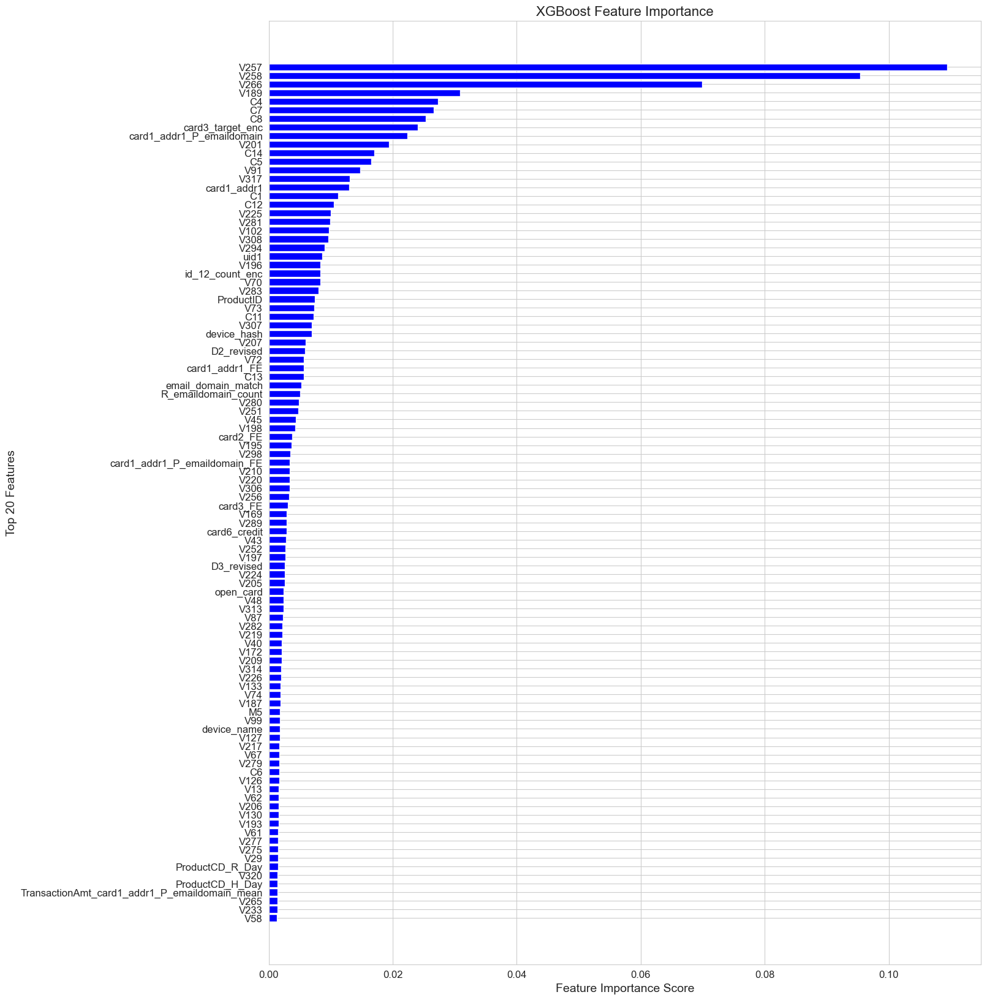

In [215]:
# Plot Feature Importance
plt.figure(figsize=(15, 20))
plt.barh(importance_df["Feature"][:100], importance_df["Importance"][:100], color="blue")
plt.xlabel("Feature Importance Score")
plt.ylabel("Top 20 Features")
plt.title("XGBoost Feature Importance")
plt.gca().invert_yaxis()  # Flip to show most important first
plt.show()

In [216]:
# Select features that contribute to 90% of the total importance
importance_df["Cumulative_Importance"] = importance_df["Importance"].cumsum()
top_features = importance_df[importance_df["Cumulative_Importance"] <= 0.99]["Feature"].tolist()

print("Top 90% contributing features:", top_features)
print(f"Total selected features: {len(top_features)}")

Top 90% contributing features: ['V257', 'V258', 'V266', 'V189', 'C4', 'C7', 'C8', 'card3_target_enc', 'card1_addr1_P_emaildomain', 'V201', 'C14', 'C5', 'V91', 'V317', 'card1_addr1', 'C1', 'C12', 'V225', 'V281', 'V102', 'V308', 'V294', 'uid1', 'V196', 'id_12_count_enc', 'V70', 'V283', 'ProductID', 'V73', 'C11', 'V307', 'device_hash', 'V207', 'D2_revised', 'V72', 'card1_addr1_FE', 'C13', 'email_domain_match', 'R_emaildomain_count', 'V280', 'V251', 'V45', 'V198', 'card2_FE', 'V195', 'V298', 'card1_addr1_P_emaildomain_FE', 'V210', 'V220', 'V306', 'V256', 'card3_FE', 'V169', 'V289', 'card6_credit', 'V43', 'V252', 'V197', 'D3_revised', 'V224', 'V205', 'open_card', 'V48', 'V313', 'V87', 'V282', 'V219', 'V40', 'V172', 'V209', 'V314', 'V226', 'V133', 'V74', 'V187', 'M5', 'V99', 'device_name', 'V127', 'V217', 'V67', 'V279', 'C6', 'V126', 'V13', 'V62', 'V206', 'V130', 'V193', 'V61', 'V277', 'V275', 'V29', 'ProductCD_R_Day', 'V320', 'ProductCD_H_Day', 'TransactionAmt_card1_addr1_P_emaildomain_mean

## Time Consistency Check

In [217]:
min_month = pd.to_numeric(train_df["month"], errors="coerce").min()
max_month = pd.to_numeric(train_df["month"], errors="coerce").max()

first_month_df = train_df[train_df["month"] == min_month]
last_month_df = train_df[train_df["month"] == max_month]


failing_features = []

# Loop through each feature and test its "time consistency"
for feature in top_features:
    X_train, y_train = first_month_df[[feature]], first_month_df["isFraud"]
    X_val, y_val = last_month_df[[feature]], last_month_df["isFraud"]

    # Train a single-feature model
    model = xgb.XGBClassifier(
        tree_method="gpu_hist",
        enable_categorical=True,
        n_estimators=100,
        learning_rate=0.1,
        max_depth=3,
        objective="binary:logistic",
        eval_metric="auc",
        random_state=42
    )

    model.fit(X_train, y_train)

    # Compute AUC scores
    train_auc = roc_auc_score(y_train, model.predict_proba(X_train)[:, 1])
    val_auc = roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])

    # Check if the feature fails the time consistency test
    if train_auc < 0.5 or val_auc < 0.5:
        failing_features.append(feature)

# Remove failing features
final_selected_features = [f for f in top_features if f not in failing_features]

# Output results
print(f"Total failing features removed: {len(failing_features)}")
print("Final feature list after time consistency check:", final_selected_features)

Total failing features removed: 12
Final feature list after time consistency check: ['V257', 'V258', 'V266', 'V189', 'C4', 'C7', 'C8', 'card3_target_enc', 'card1_addr1_P_emaildomain', 'V201', 'C14', 'C5', 'V91', 'V317', 'card1_addr1', 'C1', 'C12', 'V225', 'V281', 'V102', 'V308', 'V294', 'uid1', 'V196', 'id_12_count_enc', 'V70', 'V283', 'ProductID', 'V73', 'C11', 'V307', 'device_hash', 'V207', 'D2_revised', 'V72', 'card1_addr1_FE', 'C13', 'email_domain_match', 'R_emaildomain_count', 'V280', 'V251', 'V45', 'V198', 'card2_FE', 'V195', 'V298', 'card1_addr1_P_emaildomain_FE', 'V210', 'V220', 'V306', 'V256', 'card3_FE', 'V169', 'V289', 'card6_credit', 'V43', 'V252', 'V197', 'D3_revised', 'V224', 'V205', 'open_card', 'V48', 'V313', 'V87', 'V282', 'V219', 'V40', 'V172', 'V209', 'V314', 'V226', 'V133', 'V74', 'V187', 'V99', 'device_name', 'V127', 'V217', 'V67', 'V279', 'C6', 'V126', 'V13', 'V62', 'V206', 'V130', 'V193', 'V277', 'V275', 'V29', 'V320', 'TransactionAmt_card1_addr1_P_emaildomain_me

In [218]:
# final list of features passing time consistency and feature importance check:
print(final_selected_features)

['V257', 'V258', 'V266', 'V189', 'C4', 'C7', 'C8', 'card3_target_enc', 'card1_addr1_P_emaildomain', 'V201', 'C14', 'C5', 'V91', 'V317', 'card1_addr1', 'C1', 'C12', 'V225', 'V281', 'V102', 'V308', 'V294', 'uid1', 'V196', 'id_12_count_enc', 'V70', 'V283', 'ProductID', 'V73', 'C11', 'V307', 'device_hash', 'V207', 'D2_revised', 'V72', 'card1_addr1_FE', 'C13', 'email_domain_match', 'R_emaildomain_count', 'V280', 'V251', 'V45', 'V198', 'card2_FE', 'V195', 'V298', 'card1_addr1_P_emaildomain_FE', 'V210', 'V220', 'V306', 'V256', 'card3_FE', 'V169', 'V289', 'card6_credit', 'V43', 'V252', 'V197', 'D3_revised', 'V224', 'V205', 'open_card', 'V48', 'V313', 'V87', 'V282', 'V219', 'V40', 'V172', 'V209', 'V314', 'V226', 'V133', 'V74', 'V187', 'V99', 'device_name', 'V127', 'V217', 'V67', 'V279', 'C6', 'V126', 'V13', 'V62', 'V206', 'V130', 'V193', 'V277', 'V275', 'V29', 'V320', 'TransactionAmt_card1_addr1_P_emaildomain_mean', 'V265', 'V233', 'V58', 'V290', 'id_07_uid1_std', 'V310', 'V129', 'V33', 'V263',

## Handle different columns within test and training

In [219]:
train_df = train_df[final_selected_features + ['isFraud']] 
test_df = test_df[final_selected_features+ ['TransactionID']]    

In [220]:
test_df[['TransactionID']]

,TransactionID,TransactionID
0,3663549,3663549
1,3663550,3663550
2,3663551,3663551
3,3663552,3663552
4,3663553,3663553
...,...,...
506686,4170235,4170235
506687,4170236,4170236
506688,4170237,4170237
506689,4170238,4170238


In [221]:
train_features = set(train_df.columns)
test_features = set(test_df.columns)

only_in_train = train_features - test_features
only_in_test = test_features - train_features

print("Features only in train_df:", only_in_train)
print("Features only in test_df:", only_in_test)

Features only in train_df: {'isFraud'}
Features only in test_df: set()


In [222]:
train_df.to_csv('train_df.csv')
test_df.to_csv('test_df.csv')